# **UFC Fight History Analysis**

### **Machine Learning and Deep Learning**

*Sander Thomasrud - 176169*

*Mikael Karlsen Hauglid - 177121*

*Dario Patzi Chavez - 177125*

In [ ]:
# Downloads
%pip install pandas numpy scipy seaborn matplotlib scikit-learn xgboost tensorflow ipython

Note: you may need to restart the kernel to use updated packages.


In [ ]:
# Imports

# General 
import os
import re
import time
import random

# Data Handling
import numpy as np
import pandas as pd
from scipy.stats import pearsonr, chi2_contingency, randint, uniform

# Visualization
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick
import seaborn as sns
from IPython.display import display

# Preprocessing, Models, and Evaluation
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.decomposition import PCA
from sklearn.utils import resample, class_weight
from sklearn.model_selection import (
    train_test_split,
    GridSearchCV,
    RandomizedSearchCV
)
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.metrics import (
    roc_curve,
    roc_auc_score,
    classification_report,
    confusion_matrix,
    ConfusionMatrixDisplay,
    r2_score,
    accuracy_score
)

# XGBoost
from xgboost import XGBClassifier

# TensorFlow / Keras
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Input
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.optimizers import Adam

# Setting options to display all columns of a dataframe
pd.options.display.max_columns = None
pd.options.display.max_colwidth = 100

### Loading Data

In [6]:
# Loading data
ufc_df = pd.read_csv("ufc-master.csv")

# Taking a look at the first rows
display(ufc_df.head(5))

# Taking a look at the columns
print(ufc_df.info(max_cols=120))

,RedFighter,BlueFighter,RedOdds,BlueOdds,RedExpectedValue,BlueExpectedValue,Date,Location,Country,Winner,TitleBout,WeightClass,Gender,NumberOfRounds,BlueCurrentLoseStreak,BlueCurrentWinStreak,BlueDraws,BlueAvgSigStrLanded,BlueAvgSigStrPct,BlueAvgSubAtt,BlueAvgTDLanded,BlueAvgTDPct,BlueLongestWinStreak,BlueLosses,BlueTotalRoundsFought,BlueTotalTitleBouts,BlueWinsByDecisionMajority,BlueWinsByDecisionSplit,BlueWinsByDecisionUnanimous,BlueWinsByKO,BlueWinsBySubmission,BlueWinsByTKODoctorStoppage,BlueWins,BlueStance,BlueHeightCms,BlueReachCms,BlueWeightLbs,RedCurrentLoseStreak,RedCurrentWinStreak,RedDraws,RedAvgSigStrLanded,RedAvgSigStrPct,RedAvgSubAtt,RedAvgTDLanded,RedAvgTDPct,RedLongestWinStreak,RedLosses,RedTotalRoundsFought,RedTotalTitleBouts,RedWinsByDecisionMajority,RedWinsByDecisionSplit,RedWinsByDecisionUnanimous,RedWinsByKO,RedWinsBySubmission,RedWinsByTKODoctorStoppage,RedWins,RedStance,RedHeightCms,RedReachCms,RedWeightLbs,RedAge,BlueAge,LoseStreakDif,WinStreakDif,LongestWinStreakDif,WinDif,LossDif,TotalRoundDif,TotalTitleBoutDif,KODif,SubDif,HeightDif,ReachDif,AgeDif,SigStrDif,AvgSubAttDif,AvgTDDif,EmptyArena,BMatchWCRank,RMatchWCRank,RWFlyweightRank,RWFeatherweightRank,RWStrawweightRank,RWBantamweightRank,RHeavyweightRank,RLightHeavyweightRank,RMiddleweightRank,RWelterweightRank,RLightweightRank,RFeatherweightRank,RBantamweightRank,RFlyweightRank,RPFPRank,BWFlyweightRank,BWFeatherweightRank,BWStrawweightRank,BWBantamweightRank,BHeavyweightRank,BLightHeavyweightRank,BMiddleweightRank,BWelterweightRank,BLightweightRank,BFeatherweightRank,BBantamweightRank,BFlyweightRank,BPFPRank,BetterRank,Finish,FinishDetails,FinishRound,FinishRoundTime,TotalFightTimeSecs,RedDecOdds,BlueDecOdds,RSubOdds,BSubOdds,RKOOdds,BKOOdds
0,Alexandre Pantoja,Kai Asakura,-250.0,215.0,40.0000,215.0,2024-12-07,"Las Vegas, Nevada, USA",USA,Red,True,Flyweight,MALE,5,0,0,0,0.00,0.00,0.0,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,Orthodox,172.72,175.26,125,0,6,0,4.41,0.49,0.8,2.61,0.47,6,3,42,3,0,2,4,2,4,0,12,Orthodox,165.10,170.18,125,34,31,0,-6,-6,-12,-3,-42,-3,-2,-4,7.62,5.08,-3,-4.41,-0.8,-2.61,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,11.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Red,SUB,Rear Naked Choke,2.0,2:05,425.0,300.0,800.0,150.0,2500.0,400.0,350.0
1,Shavkat Rakhmonov,Ian Machado Garry,-210.0,295.0,47.6190,295.0,2024-12-07,"Las Vegas, Nevada, USA",USA,Red,False,Welterweight,MALE,3,0,8,0,5.50,0.55,0.3,0.77,0.55,8,0,20,0,0,1,4,3,0,0,8,Orthodox,190.50,187.96,170,0,6,0,4.12,0.61,1.8,1.49,0.29,6,0,11,0,0,0,0,1,5,0,6,Orthodox,185.42,195.58,170,30,27,0,2,2,2,0,9,0,2,-5,5.08,-7.62,-3,1.38,-1.5,-0.72,NaN,7.0,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.0,NaN,NaN,NaN,NaN,NaN,Red,U-DEC,NaN,5.0,5:00,1500.0,250.0,650.0,180.0,3000.0,240.0,700.0
2,Ciryl Gane,Alexander Volkov,-380.0,300.0,26.3158,300.0,2024-12-07,"Las Vegas, Nevada, USA",USA,Red,False,Heavyweight,MALE,3,0,4,0,5.13,0.57,0.2,0.45,0.63,4,4,44,0,0,1,4,6,1,0,12,Orthodox,200.66,203.20,250,0,1,0,5.49,0.60,0.5,0.58,0.21,7,2,33,3,0,0,3,4,2,0,9,Orthodox,193.04,205.74,245,34,36,0,3,-3,3,2,11,-3,2,-1,7.62,-2.54,2,-0.36,-0.3,-0.13,NaN,3.0,2.0,NaN,NaN,NaN,NaN,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Red,S-DEC,NaN,3.0,5:00,900.0,-160.0,450.0,1100.0,3000.0,350.0,1100.0
3,Bryce Mitchell,Kron Gracie,-950.0,625.0,10.5263,625.0,2024-12-07,"Las Vegas, Nevada, USA",USA,Red,False,Featherweight,MALE,3,2,0,0,3.74,0.44,0.5,0.47,0.25,1,2,7,0,0,0,0,0,1,0,1,Southpaw,175.26,177.80,145,1,0,0,2.30,0.58,1.6,3.45,0.41,6,2,22,0,1,0,5,0,1,0,7,Southpaw,177.80,177.80,145,30,36,1,0,-5,-6,0,-15,0,0,0,-2.54,0.00,6,1.44,-1.1,-2.98,NaN,NaN,13.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Red,KO/TKO,Elbows,3.0,0:39,639.0,-200.0,1100.0,380.0,1400.0,500.0,4000.0
4,Nate Landwehr,Dooho Choi,-130.0,110.0,76.9231,110.0,2024-12-07,"Las Vegas, Nevada, USA",USA,Blue,False,Feathe

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6528 entries, 0 to 6527
Data columns (total 118 columns):
 #    Column                       Non-Null Count  Dtype  
---   ------                       --------------  -----  
 0    RedFighter                   6528 non-null   object 
 1    BlueFighter                  6528 non-null   object 
 2    RedOdds                      6301 non-null   float64
 3    BlueOdds                     6302 non-null   float64
 4    RedExpectedValue             6301 non-null   float64
 5    BlueExpectedValue            6302 non-null   float64
 6    Date                         6528 non-null   object 
 7    Location                     6528 non-null   object 
 8    Country                      6528 non-null   object 
 9    Winner                       6528 non-null   object 
 10   TitleBout                    6528 non-null   bool   
 11   WeightClass                  6528 non-null   object 
 12   Gender                       6528 non-null   object 
 13   N

### Data Understanding

In [7]:
# Define custom colors
custom_palette = {
    'Red': '#e74c3c',
    'Blue': '#3498db',
    'Missing': 'gray',
    'Correct': '#4CAF50',
    'Wrong': '#F44336',
    'Favorite': 'green',
    'Underdog': 'orange'
}

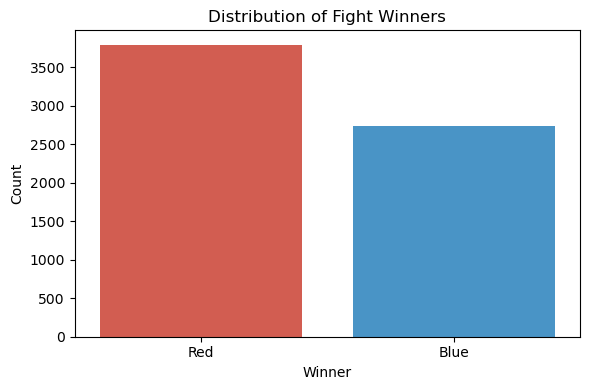

In [8]:
# -- Target variable 'Winner' --
plt.figure(figsize=(6, 4))
sns.countplot(data=ufc_df, x='Winner', hue='Winner', palette=custom_palette)

plt.title('Distribution of Fight Winners')
plt.xlabel('Winner')
plt.ylabel('Count')
plt.tight_layout()
plt.show()

## Data Pre-processing

### Initial Pre-processing

This section contains the initial pre-processing, which needs to be done to all the versions of the datasets.

#### Data Quality Issues

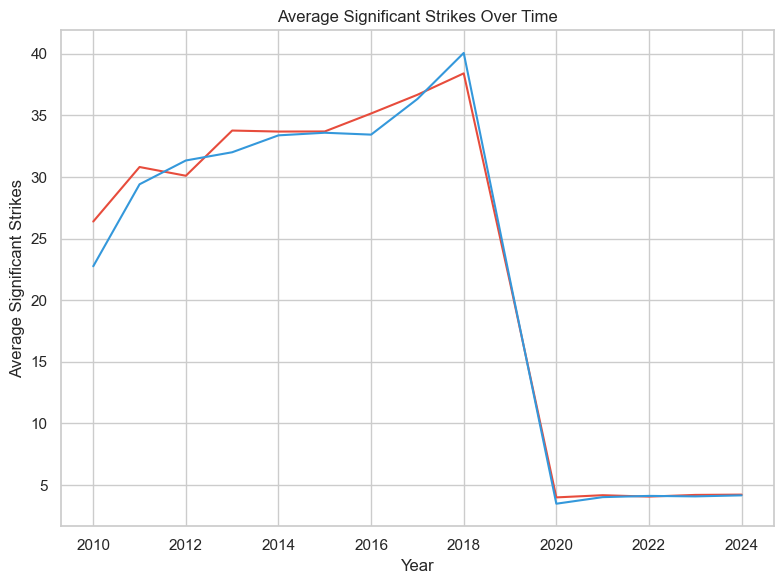

In [9]:
# Extract year from Date column
ufc_df['Year'] = pd.to_datetime(ufc_df['Date']).dt.year

# Calculate yearly averages
avg_per_year = ufc_df.groupby('Year')[['RedAvgSigStrLanded', 'BlueAvgSigStrLanded']].mean().reset_index()

# Plot
plt.figure(figsize=(8, 6))
sns.set(style="whitegrid")
sns.lineplot(data=avg_per_year, x='Year', y='RedAvgSigStrLanded', color=custom_palette['Red'])
sns.lineplot(data=avg_per_year, x='Year', y='BlueAvgSigStrLanded', color=custom_palette['Blue'])

plt.title('Average Significant Strikes Over Time')
plt.xlabel('Year')
plt.ylabel('Average Significant Strikes')
plt.tight_layout()
plt.show()

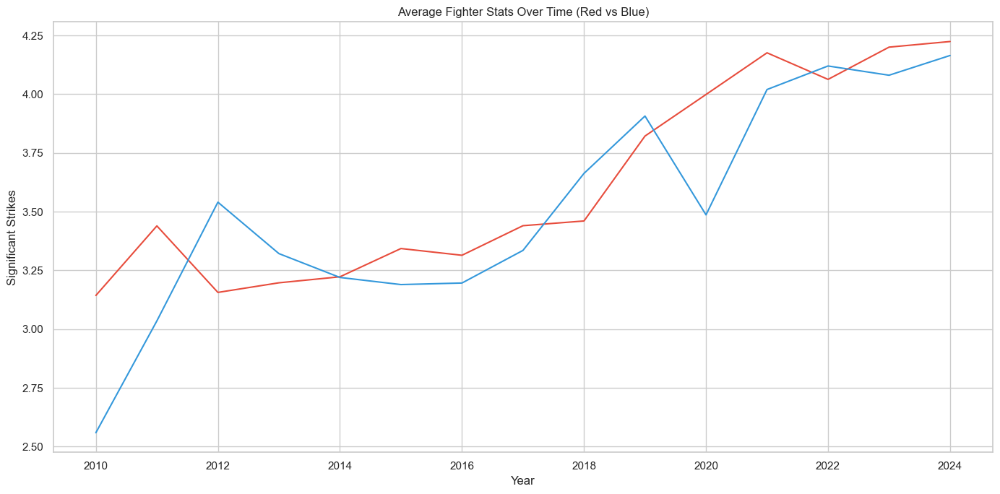

In [10]:
# Measure appears to change here - change all entries from idx (2739) to max
idx = ufc_df[(ufc_df['RedFighter'] == 'Henry Cejudo') & (ufc_df['BlueFighter'] == 'Marlon Moraes')].index.values.astype(int)[0]

# Calculation

# Getting the average fight time
avg_fight_time = ufc_df['TotalFightTimeSecs'].mean()

# Dict for holding number of fights for each fighter
fights_per_fighter = {}

# Dict for holding fight time per fighter
fight_time_per_fighter = {}

# Iterating the fights from last index to 2739, by using step size -1
for i in range(len(ufc_df)-1, idx-1, -1):

  # Extracting row
  row = ufc_df.iloc[i]

  # Extracting fighters
  red_fighter = row['RedFighter']
  blue_fighter = row['BlueFighter']

  # Extracting fight time, and filling in if empty
  fight_time = row['TotalFightTimeSecs']

  if pd.isnull(fight_time): fight_time = 900

  # -- Checking red fighter --
  if red_fighter in fights_per_fighter:

    # Extracting average strikes per fight
    old_value = row['RedAvgSigStrLanded']

    # Calculating average per minute
    new_value = (old_value * fights_per_fighter[red_fighter]) / (fight_time_per_fighter[red_fighter] / 60)

    # Updating dictionaries
    fights_per_fighter[red_fighter] += 1
    fight_time_per_fighter[red_fighter] += fight_time

    # Updating dataframe
    ufc_df.loc[i, 'RedAvgSigStrLanded'] = new_value

  # If this is first fight
  else:

    # Setting value correctly
    ufc_df.loc[i, 'RedAvgSigStrLanded'] = ufc_df.loc[i, 'RedAvgSigStrLanded'] / (avg_fight_time / 60)

    # Adding to dicts
    fights_per_fighter[red_fighter] = 1
    fight_time_per_fighter[red_fighter] = fight_time


  # -- Checking blue fighter --
  if blue_fighter in fights_per_fighter:

    # Extracting average strikes per fight
    old_value = row['BlueAvgSigStrLanded']

    # Calculating average per minute
    new_value = (old_value * fights_per_fighter[blue_fighter]) / (fight_time_per_fighter[blue_fighter] / 60)

    # Updating dictionaries
    fights_per_fighter[blue_fighter] += 1
    fight_time_per_fighter[blue_fighter] += fight_time

    # Updating dataframe
    ufc_df.loc[i, 'BlueAvgSigStrLanded'] = new_value

  # If this is first fight
  else:

    # Setting value correctly
    ufc_df.loc[i, 'BlueAvgSigStrLanded'] = ufc_df.loc[i, 'BlueAvgSigStrLanded'] / (avg_fight_time / 60)

    # Adding to dicts
    fights_per_fighter[blue_fighter] = 1
    fight_time_per_fighter[blue_fighter] = fight_time


# Extract year from Date column
ufc_df['Year'] = pd.to_datetime(ufc_df['Date']).dt.year

# Calculate yearly averages
avg_per_year = ufc_df.groupby('Year')[['RedAvgSigStrLanded', 'BlueAvgSigStrLanded']].mean().reset_index()

# Plot
plt.figure(figsize=(14, 7))
sns.lineplot(data=avg_per_year, x='Year', y='RedAvgSigStrLanded', color=custom_palette['Red'])
sns.lineplot(data=avg_per_year, x='Year', y='BlueAvgSigStrLanded', color=custom_palette['Blue'])

plt.title('Average Fighter Stats Over Time (Red vs Blue)')
plt.xlabel('Year')
plt.ylabel('Significant Strikes')
plt.tight_layout()
plt.show()


#### Odds Conversion

In [11]:
# Define the function to convert American odds to decimal odds
def convert_moneyline_to_decimal(df, column_name):
    def moneyline_to_decimal(ml):
        if pd.isna(ml):  # Check for NaN values
            return np.nan
        ml = int(ml)
        if ml > 0:
            return (ml / 100) + 1
        else:
            return round((100 / abs(ml)) + 1, 2)

    df[f"{column_name}Decimal"] = df[column_name].apply(moneyline_to_decimal)
    return df

# Apply to training set
ufc_df = convert_moneyline_to_decimal(ufc_df, 'RedOdds')
ufc_df = convert_moneyline_to_decimal(ufc_df, 'BlueOdds')

#### Initial Feature Selection

In this section, only the obvious columns will be dropped. This includes columns related to the outcome of fights, odds we will not use, as well as a few other columns that will not be used in the analysis. 

In [12]:
# Listing all columns related to fight-outcome, except Winner
finish_related_cols = [
    'Finish',
    'FinishRound',
    'FinishDetails',
    'FinishRoundTime',
    'TotalFightTimeSecs'
]

# Listing all columns related to odds, except moneyline and potential return
odds_related_cols = [
    'RedDecOdds',
    'BlueDecOdds',
    'RSubOdds',
    'BSubOdds',
    'RKOOdds',
    'BKOOdds'
]

# Listing other columns that will not be used, for different reasons
other_columns = [
    'Location',
    'Country',
    'EmptyArena', 
    'Year'
]

# Dropping the columns from the dataset
ufc_df = ufc_df.drop(columns= finish_related_cols + odds_related_cols + other_columns)

#### Splitting the data

To ensure no data leakage, we perform the split early. All following processing, such as imputation and feature selection, is made based on the train set. The test set is updated afterwards - following the same transformation as the train set.

In [13]:
# Sorting by date
ufc_df['Date'] = pd.to_datetime(ufc_df['Date'])
ufc_df = ufc_df.sort_values('Date')

# Splitting the data chronologically 
split_index = int(len(ufc_df) * 0.85)
train_df = ufc_df.iloc[:split_index].copy()
test_df = ufc_df.iloc[split_index:].copy()

#### Missing Values

In [14]:
# Drop all features with more than 50% missing values

# Calculate missing value ratios
missing_ratio = train_df.isnull().mean()

# Identify columns to drop
dropped_columns = missing_ratio[missing_ratio > 0.5].index.tolist()

# Drop the columns from the DataFrame
train_df = train_df.drop(columns=dropped_columns)

# Drop the same columns from the test set
test_df = test_df.drop(columns=dropped_columns)

# Optional: print or log the dropped columns
print(f"Dropped {len(dropped_columns)} columns:\n")
for col in dropped_columns:
    print(f" - {col}")

Dropped 28 columns:

 - BMatchWCRank
 - RMatchWCRank
 - RWFlyweightRank
 - RWFeatherweightRank
 - RWStrawweightRank
 - RWBantamweightRank
 - RHeavyweightRank
 - RLightHeavyweightRank
 - RMiddleweightRank
 - RWelterweightRank
 - RLightweightRank
 - RFeatherweightRank
 - RBantamweightRank
 - RFlyweightRank
 - RPFPRank
 - BWFlyweightRank
 - BWFeatherweightRank
 - BWStrawweightRank
 - BWBantamweightRank
 - BHeavyweightRank
 - BLightHeavyweightRank
 - BMiddleweightRank
 - BWelterweightRank
 - BLightweightRank
 - BFeatherweightRank
 - BBantamweightRank
 - BFlyweightRank
 - BPFPRank


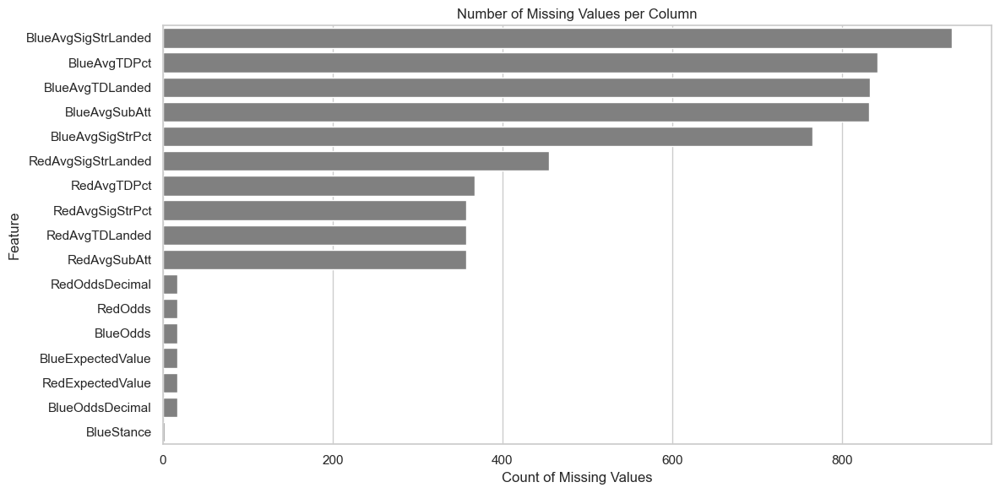

In [15]:
# Looking at the remaining features and their missing value count

# Creating helper function
def plot_missing_values(df):

    # Step 1: Create a DataFrame showing where values are missing
    missing_df = df.isnull().melt(var_name='Column', value_name='IsMissing')

    # Step 2: Filter only the missing entries
    missing_df = missing_df[missing_df['IsMissing'] == True]

    # Step 3: Plot using Seaborn
    plt.figure(figsize=(12, 6))
    sns.countplot(data=missing_df, y='Column', order=missing_df['Column'].value_counts().index, color=custom_palette['Missing'])

    plt.title('Number of Missing Values per Column')
    plt.xlabel('Count of Missing Values')
    plt.ylabel('Feature')
    plt.tight_layout()
    plt.show()

# Plotting missing values for the training set
plot_missing_values(train_df)

The top 10 columns with the most missing values are individual stat columns. This is most likely due to debut fights, where fighters have not yet recorded career stats. This hypothesis is tested below.

In [16]:
# Ensure Date is datetime and sorted
train_df['Date'] = pd.to_datetime(train_df['Date'])
train_df = train_df.sort_values('Date')

# Rebuild first-fight flags for red and blue fighters
first_red_fights = train_df.groupby('RedFighter')['Date'].min().reset_index().rename(columns={'Date': 'FirstRedFight'})
first_blue_fights = train_df.groupby('BlueFighter')['Date'].min().reset_index().rename(columns={'Date': 'FirstBlueFight'})

# Merge back into main DataFrame
train_df = train_df.merge(first_red_fights, on='RedFighter', how='left')
train_df = train_df.merge(first_blue_fights, on='BlueFighter', how='left')

# Create first fight indicators
train_df['IsFirstRedFight'] = train_df['Date'] == train_df['FirstRedFight']
train_df['IsFirstBlueFight'] = train_df['Date'] == train_df['FirstBlueFight']

<Figure size 1200x600 with 0 Axes>

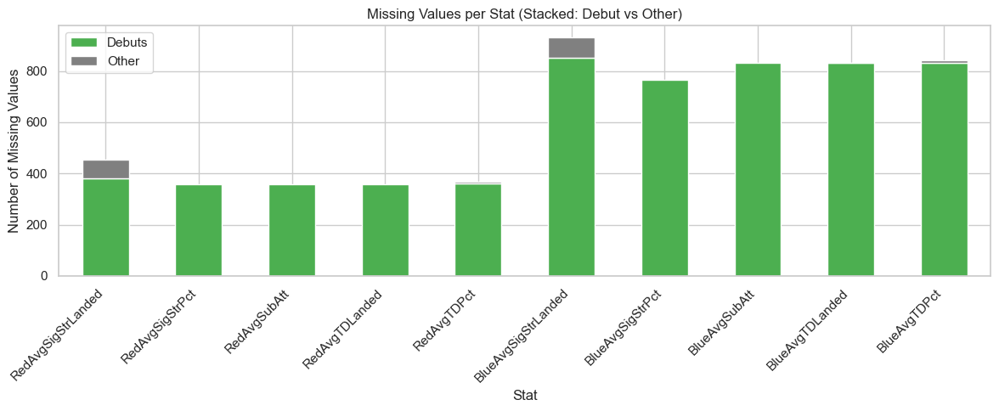

In [17]:
# List of individual stat columns to analyze
individual_stat_cols = [
    'RedAvgSigStrLanded', 'RedAvgSigStrPct', 'RedAvgSubAtt', 'RedAvgTDLanded', 'RedAvgTDPct',
    'BlueAvgSigStrLanded', 'BlueAvgSigStrPct', 'BlueAvgSubAtt', 'BlueAvgTDLanded', 'BlueAvgTDPct'
]

# Collect missing value stats
summary = []

for col in individual_stat_cols:
    is_red = col.startswith('Red')
    first_fight_col = 'IsFirstRedFight' if is_red else 'IsFirstBlueFight'

    total_missing = train_df[col].isna().sum()
    first_fight_missing = train_df[train_df[col].isna() & train_df[first_fight_col]].shape[0]
    other_missing = total_missing - first_fight_missing

    summary.append({
        'Stat': col,
        'FirstFightMissing': first_fight_missing,
        'OtherMissing': other_missing
    })

# Create a DataFrame for plotting
missing_df = pd.DataFrame(summary).set_index('Stat')

# Plot
plt.figure(figsize=(12, 6))
missing_df[['FirstFightMissing', 'OtherMissing']].plot(
    kind='bar', stacked=True,
    color=[custom_palette['Correct'], custom_palette['Missing']],  # Debut = blue, Other = gray
    figsize=(12, 5)
)

plt.title('Missing Values per Stat (Stacked: Debut vs Other)')
plt.ylabel('Number of Missing Values')
plt.xlabel('Stat')
plt.xticks(rotation=45, ha='right')
plt.legend(['Debuts', 'Other'])
plt.tight_layout()
plt.show()

As seen above, most of the missing values are due to debut fights. To avoid dropping all these fights, we impute the value based on Gender and Weight Class, and then add a flag deciding whether it was imputed or not.

In [18]:
# Define stat columns of interest
stat_cols = [
    'RedAvgSigStrLanded', 'BlueAvgSigStrLanded',
    'RedAvgSigStrPct', 'BlueAvgSigStrPct',
    'RedAvgSubAtt', 'BlueAvgSubAtt',
    'RedAvgTDLanded', 'BlueAvgTDLanded',
    'RedAvgTDPct', 'BlueAvgTDPct'
]

# Drop rows from train_df where the missing values are NOT due to debut fights
for col in stat_cols:
    if col.startswith('Red'):
        mask = train_df[col].isna() & ~train_df['IsFirstRedFight']
        train_df = train_df[~mask]
    elif col.startswith('Blue'):
        mask = train_df[col].isna() & ~train_df['IsFirstBlueFight']
        train_df = train_df[~mask]

# Function to impute by group mean
def impute_by_group(df, col):
    return df.groupby(['Gender', 'WeightClass'])[col].transform(lambda grp: grp.fillna(grp.mean()))

# Apply imputation to train_df
for col in stat_cols:
    train_df[col] = impute_by_group(train_df, col)

# Apply the same imputation to test_df using train_df group means
group_means = train_df.groupby(['Gender', 'WeightClass'])[stat_cols].mean().reset_index()

for col in stat_cols:
    for _, row in group_means.iterrows():
        gender = row['Gender']
        weight_class = row['WeightClass']
        mean_val = row[col]
        mask = (test_df['Gender'] == gender) & (test_df['WeightClass'] == weight_class) & (test_df[col].isna())
        test_df.loc[mask, col] = mean_val

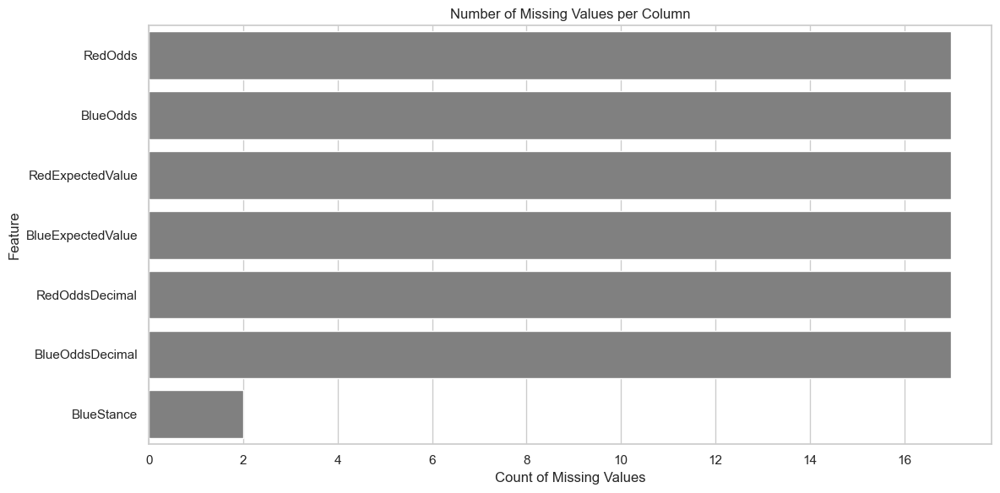

In [19]:
# Plot remaining missing values in train_df
plot_missing_values(train_df)


In [20]:
# Dropping the rows that contain these missing values
train_df = train_df.dropna()

# Also applying the same to the test set
test_df = test_df.dropna()

# Dropping the helper columns made earlier
train_df = train_df.drop(columns=['FirstRedFight', 'FirstBlueFight', 'IsFirstRedFight', 'IsFirstBlueFight'])

#### Outliers

**Individual Fighter Stats**

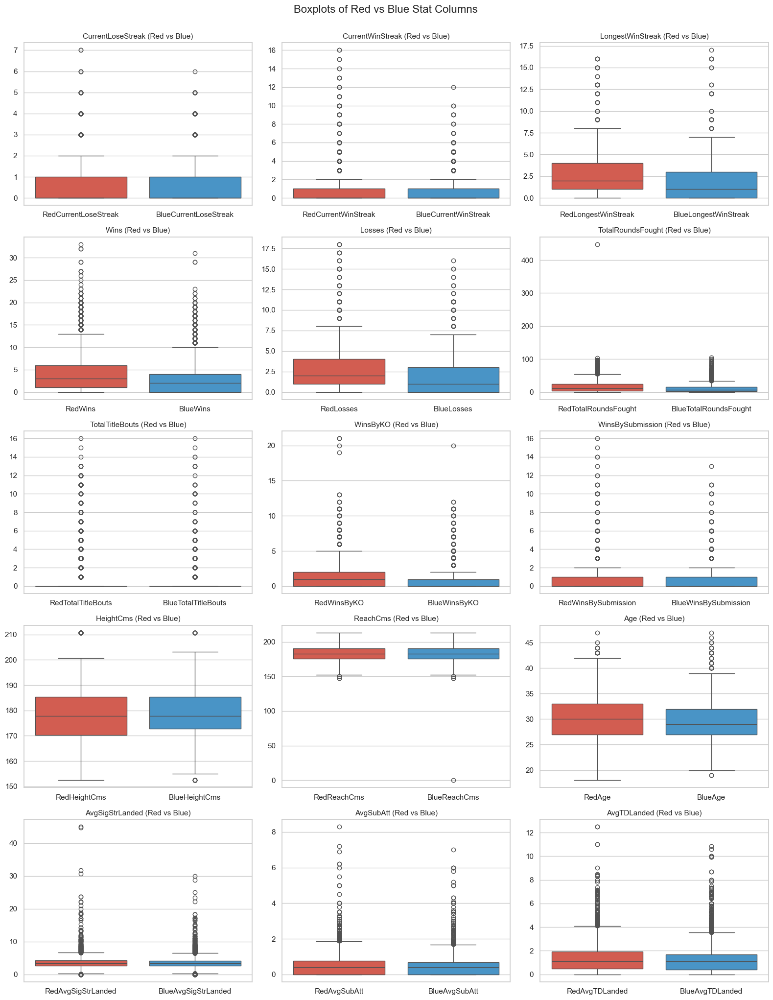

In [21]:
# Helper funciton to plot distribution of stats
def plot_distribution_boxplots(df, cols, n_cols=3):
    
    # Create subplots
    n_rows = (len(cols) + n_cols - 1) // n_cols

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(16, 4 * n_rows))
    axes = axes.flatten()

    # Plot each stat for Red and Blue
    for i, stat in enumerate(cols):
        sns.boxplot(
            data=df[[f'Red{stat}', f'Blue{stat}']].melt(var_name='Corner', value_name='Value'),
            x='Corner', y='Value', ax=axes[i], hue='Corner', palette={'Red'+stat: '#e74c3c', 'Blue'+stat: '#3498db'}
        )
        axes[i].set_title(f'{stat} (Red vs Blue)', fontsize=11)
        axes[i].set_xlabel('')
        axes[i].set_ylabel('')

    # Remove any unused axes
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.suptitle('Boxplots of Red vs Blue Stat Columns', fontsize=16, y=1.02)
    plt.show()


# List of stat base names
base_stats = [
    'CurrentLoseStreak', 'CurrentWinStreak', 'LongestWinStreak', 'Wins', 'Losses',
    'TotalRoundsFought', 'TotalTitleBouts', 'WinsByKO', 'WinsBySubmission',
    'HeightCms', 'ReachCms', 'Age',
    'AvgSigStrLanded', 'AvgSubAtt', 'AvgTDLanded' 
]

# Plotting the distributions of the stats
plot_distribution_boxplots(train_df, base_stats)



We fix the errors in the BlueReachCms- and RedTotalRoundsFought-columns.

In [22]:
# Step 1: Identify the fighter(s) with invalid Reach (0 cm)
zero_reach_fighters = train_df[train_df['BlueReachCms'] == 0]['BlueFighter'].unique()
print("Fighters with 0 reach as Blue:", zero_reach_fighters)

# Step 2: Display all fights for that fighter (both as Red and Blue)
for fighter in zero_reach_fighters:
    print(f"\nFights for: {fighter}")
    display(train_df[(train_df['RedFighter'] == fighter) | (train_df['BlueFighter'] == fighter)][[
        'Date', 'RedFighter', 'BlueFighter', 'RedReachCms', 'BlueReachCms'
    ]].sort_values('Date'))

Fighters with 0 reach as Blue: ['Irwin Rivera']

Fights for: Irwin Rivera


,Date,RedFighter,BlueFighter,RedReachCms,BlueReachCms
4192,2020-05-16,Giga Chikadze,Irwin Rivera,187.96,0.00
4315,2020-08-08,Irwin Rivera,Ali Qaisi,167.64,172.72
4384,2020-09-19,Andre Ewell,Irwin Rivera,190.50,170.18


In [23]:
# Step 1: Identify fighter(s) with extreme value in RedTotalRoundsFought
outlier_value = train_df['RedTotalRoundsFought'].max()
outlier_fighters = train_df[train_df['RedTotalRoundsFought'] == outlier_value]['RedFighter'].unique()

print("Fighter(s) with outlier RedTotalRoundsFought value:", outlier_fighters)

# Step 2: Display all fights for those fighter(s)
for fighter in outlier_fighters:
    print(f"\nFights for: {fighter}")
    display(train_df[(train_df['RedFighter'] == fighter) | (train_df['BlueFighter'] == fighter)][[
        'Date', 'RedFighter', 'BlueFighter', 'RedTotalRoundsFought', 'BlueTotalRoundsFought'
    ]].sort_values('Date'))

Fighter(s) with outlier RedTotalRoundsFought value: ['Brian Kelleher']

Fights for: Brian Kelleher


,Date,RedFighter,BlueFighter,RedTotalRoundsFought,BlueTotalRoundsFought
2810,2017-06-03,Iuri Alcantara,Brian Kelleher,33,0
2884,2017-07-22,Brian Kelleher,Marlon Vera,1,14
2968,2017-10-21,Damian Stasiak,Brian Kelleher,10,2
3170,2018-02-24,Renan Barao,Brian Kelleher,40,5
3241,2018-05-12,John Lineker,Brian Kelleher,35,8
3555,2018-12-29,Brian Kelleher,Montel Jackson,11,3
4182,2020-05-13,Hunter Azure,Brian Kelleher,3,13
4215,2020-06-06,Cody Stamann,Brian Kelleher,17,15
4360,2020-09-05,Brian Kelleher,Ray Rodriguez,448,0
4575,2021-02-13,Ricky Simon,Brian Kelleher,21,19


In [24]:
# Manually changing the values

# BlueReachCms
train_df.loc[(train_df['BlueFighter'] == 'Irwin Rivera') & (train_df['BlueReachCms'] == 0), 'BlueReachCms'] = 167.64

# RedTotalRoundsFought
train_df.loc[(train_df['RedFighter'] == 'Brian Kelleher') & (train_df['RedTotalRoundsFought'] == outlier_value), 'RedTotalRoundsFought'] = 17

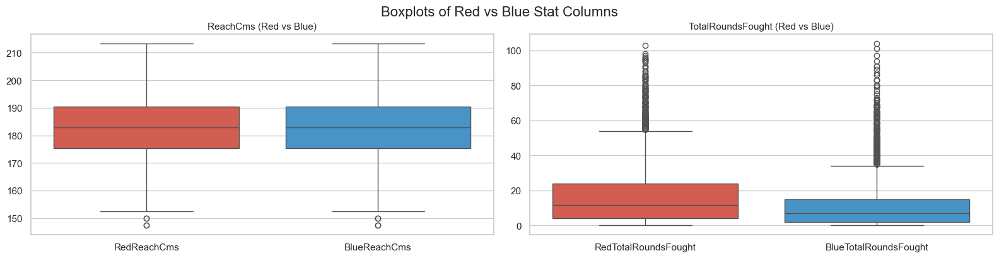

In [25]:
# Listing the columns to be plotted
plot_cols = [
    'ReachCms',
    'TotalRoundsFought'
]

# Calling the function to plot the boxplots
plot_distribution_boxplots(train_df, plot_cols, n_cols=2)


Since these outlier values were clearly isolated errors, they do not imply that any transformation should be applied to the test set. However, the boxplots for the test-set are displayed below to ensure that there are no data quality issues present.

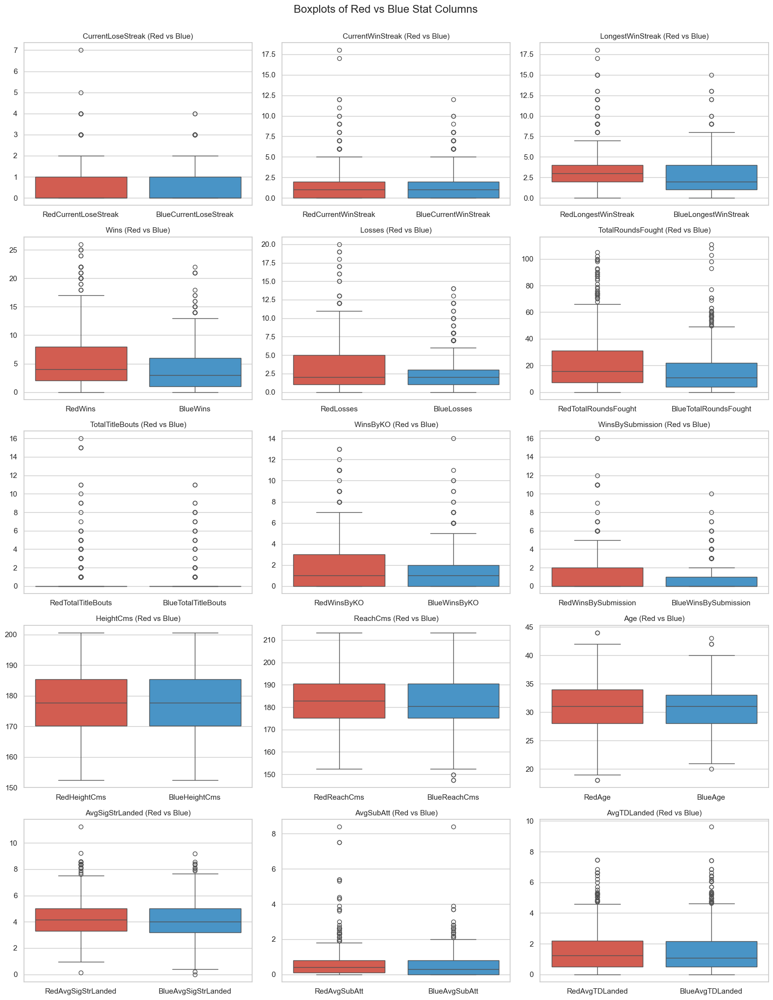

In [26]:
# Plotting the distributions from the test set
plot_distribution_boxplots(test_df, base_stats)

As we anticipated, there is no need to make any changes to the test set. 

### Construction of *Dataset 1: All Features*

This section constructs the first dataset that will be used for modelling. We only perform the most basic, necessary pre-processing to run the models. 

In [27]:
# Copying the datasets
train1 = train_df.copy()
test1 = test_df.copy()

#### Handling Categorical Features

In [28]:
# Identify all categorical columns
categorical_cols = train1.select_dtypes(include=['object', 'category', 'bool']).columns.tolist()

# Print each column with its unique values
print("All categorical columns, and their unique values:\n")
for col in categorical_cols:
    unique_vals = train1[col].unique()
    print(f" - {col}: {unique_vals}\n")

All categorical columns, and their unique values:

 - RedFighter: ['Eric Schafer' 'Brandon Vera' 'Junior Dos Santos' ... 'Gabriel Bonfim'
 'Gregory Rodrigues' 'Ismael Bonfim']

 - BlueFighter: ['Jason Brilz' 'Jon Jones' 'Gabriel Gonzaga' ... 'Melquizael Costa'
 'Jailton Almeida' 'Brunno Ferreira']

 - Winner: ['Blue' 'Red']

 - TitleBout: [False  True]

 - WeightClass: ['Light Heavyweight' 'Heavyweight' 'Middleweight' 'Welterweight'
 'Lightweight' 'Featherweight' 'Bantamweight' 'Catch Weight' 'Flyweight'
 "Women's Bantamweight" "Women's Strawweight" "Women's Flyweight"
 "Women's Featherweight"]

 - Gender: ['MALE' 'FEMALE']

 - BlueStance: ['Orthodox' 'Southpaw' 'Switch' 'Open Stance' 'Switch ']

 - RedStance: ['Orthodox' 'Southpaw' 'Switch' 'Open Stance']

 - BetterRank: ['neither' 'Blue' 'Red']



RedFighter and BlueFighter are not relevant to the analysis, so they will be dropped. All other features are encoded below. The error in the BlueStance-column is also fixed. 

In [ ]:
# --- Clean 'BlueStance' ---
train1.loc[:, 'BlueStance'] = train1['BlueStance'].replace({'Switch ': 'Switch'})
test1.loc[:, 'BlueStance'] = test1['BlueStance'].replace({'Switch ': 'Switch'})

# --- Encode binary categorical features ---
binary_map = {
    'Winner': {'Red': 0, 'Blue': 1},
    'TitleBout': {False: 0, True: 1},
    'Gender': {'MALE': 0, 'FEMALE': 1}
}

train1['EncodedWinner'] = train1['Winner'].map(binary_map['Winner'])
train1['EncodedTitleBout'] = train1['TitleBout'].map(binary_map['TitleBout'])
train1['EncodedGender'] = train1['Gender'].map(binary_map['Gender'])

test1['EncodedWinner'] = test1['Winner'].map(binary_map['Winner'])
test1['EncodedTitleBout'] = test1['TitleBout'].map(binary_map['TitleBout'])
test1['EncodedGender'] = test1['Gender'].map(binary_map['Gender'])

# --- One-hot encode multi-category features ---
categorical_cols = ['RedStance', 'BlueStance', 'BetterRank', 'WeightClass']

# Fit one-hot encoder on training data
encoder = OneHotEncoder(handle_unknown='ignore', sparse_output=False)
encoder.fit(train1[categorical_cols])

# Transform both train and test
train_encoded = pd.DataFrame(encoder.transform(train1[categorical_cols]),
                             columns=encoder.get_feature_names_out(categorical_cols),
                             index=train1.index)

test_encoded = pd.DataFrame(encoder.transform(test1[categorical_cols]),
                            columns=encoder.get_feature_names_out(categorical_cols),
                            index=test1.index)

# Concatenate the new one-hot encoded columns
train1 = pd.concat([train1, train_encoded], axis=1)
test1 = pd.concat([test1, test_encoded], axis=1)

# --- Drop original categorical columns ---
cols_to_drop = ['RedFighter', 'BlueFighter', 'Winner', 'TitleBout', 'Gender'] + categorical_cols
train1.drop(columns=cols_to_drop, inplace=True)
test1.drop(columns=cols_to_drop, inplace=True)

#### Finalizing the dataset

To prepare the dataset for modelling, we remove most of the odds-related features. The RedOddsDecimal, BlueOddsDecimal and Date are kept for now, as they are needed for the betting simulation.

In [30]:
# Dropping the last columns
train1 = train1.drop(columns=['RedOdds', 'BlueOdds', 'RedExpectedValue', 'BlueExpectedValue'])
test1 = test1.drop(columns=['RedOdds', 'BlueOdds', 'RedExpectedValue', 'BlueExpectedValue'])

### Constructing Dataset 2: *PCA*

To reduce the number of features, we perform PCA on Dataset 1. To preserve most of the variance in the data, we set the threshold for variance explained by the selected PCs to 95%.

In [31]:
# Copying the datasets
train2 = train1.copy()
test2 = test1.copy()

In [ ]:
# Columns to keep after PCA
columns_to_retain = ['RedOddsDecimal', 'BlueOddsDecimal', 'Date', 'EncodedWinner']

# Step 1: Drop retained columns and get numeric features
train_numeric = train2.drop(columns=columns_to_retain).select_dtypes(include='number')
test_numeric = test2.drop(columns=columns_to_retain).select_dtypes(include='number')

# Step 2: Standardize using training data only
scaler = StandardScaler()
train_scaled = scaler.fit_transform(train_numeric)
test_scaled = scaler.transform(test_numeric)

# Step 3: Determine number of components to preserve 95% variance
pca_full = PCA()
pca_full.fit(train_scaled)
cumulative_variance = pca_full.explained_variance_ratio_.cumsum()
num_components = (cumulative_variance < 0.95).sum() + 1

# Step 4: Apply PCA
pca = PCA(n_components=num_components)
train_pca = pca.fit_transform(train_scaled)
test_pca = pca.transform(test_scaled)

# Step 5: Create new datasets with PCs and retained columns
pc_train2 = pd.DataFrame(train_pca, columns=[f'PC{i+1}' for i in range(num_components)], index=train2.index)
pc_test2 = pd.DataFrame(test_pca, columns=[f'PC{i+1}' for i in range(num_components)], index=test2.index)

# Combine with retained columns
train2 = pd.concat([pc_train2, train2[columns_to_retain]], axis=1)
test2 = pd.concat([pc_test2, test2[columns_to_retain]], axis=1)

print(f"Train- and test-set created with {num_components} principal components.")
display(train2.head())

Train- and test-set created with 53 principal components.


,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19,PC20,PC21,PC22,PC23,PC24,PC25,PC26,PC27,PC28,PC29,PC30,PC31,PC32,PC33,PC34,PC35,PC36,PC37,PC38,PC39,PC40,PC41,PC42,PC43,PC44,PC45,PC46,PC47,PC48,PC49,PC50,PC51,PC52,PC53,RedOddsDecimal,BlueOddsDecimal,Date,EncodedWinner
0,-0.446763,-2.276798,1.175997,0.108147,0.806567,-1.164175,3.111761,0.048562,0.668225,-0.150223,0.769619,0.524514,-0.943608,0.070811,-0.700235,0.605461,0.351806,0.295472,1.114478,-0.105785,-0.093001,1.733636,-0.330902,0.269865,1.301501,0.470938,0.040483,-0.226447,-0.307344,-0.132134,-0.376121,-0.171423,-0.758979,0.134978,-0.196826,-0.153224,-0.237244,-0.032384,-0.328814,-1.232850,-0.762799,-0.228067,-1.143822,-0.026261,-0.706456,-0.636672,-0.751570,-0.396220,-1.042006,0.464540,0.087759,0.844542,0.511507,2.40,1.62,2010-03-21,1
1,1.634247,-4.211550,0.208374,-1.662588,-1.439674,0.351678,-0.351411,-1.344278,0.349015,-0.907386,1.375381,-0.709011,-2.468714,-0.008343,0.576573,1.140986,-0.921520,-0.865817,1.041179,-0.625863,-0.161667,1.293648,-0.138287,0.754874,1.230805,1.485616,-0.339275,-0.640173,0.710523,0.759502,0.071435,-0.728696,-0.897550,0.035714,-0.477779,-0.403200,0.282134,-0.055927,-0.984228,-1.249447,-0.501991,-0.874538,-0.091830,-0.666372,0.100903,0.307257,1.253769,-0.406728,-0.482008,0.860035,-1.147073,0.414013,0.030256,3.15,1.43,2010-03-21,1
2,1.707819,-2.593702,4.955236,0.752342,-2.480523,0.171630,0.682296,1.692301,0.826520,-0.503217,0.697376,-0.665100,-0.385707,-1.764408,-0.168630,-0.407615,0.457836,0.808685,-0.002563,1.465050,-0.145764,-1.923754,0.107497,-0.420941,-0.217440,-0.560510,0.229321,1.034974,0.200422,-0.458936,0.278316,0.395739,0.182878,0.264251,0.533666,-0.107865,0.250419,-0.332560,0.876673,0.252029,-0.319981,0.145285,-0.384713,-0.834186,0.274291,0.652428,0.678691,-1.026002,-1.830557,0.021010,-1.149243,-0.145945,1.550032,1.40,3.30,2010-03-21,0
3,2.364514,-5.402421,1.244201,-1.049729,-0.361794,-2.793844,0.142563,1.191241,0.871099,0.455291,-0.475777,2.660746,0.389754,-0.653652,-0.028469,1.259711,-0.606662,0.523275,1.901410,1.541883,-2.794461,-1.251646,0.644230,0.263272,-1.067940,1.725391,0.793412,0.716625,0.655600,-0.644686,-1.637412,0.473526,0.728922,1.094701,-1.619843,-0.201639,-1.377533,-1.016777,3.143454,1.621780,0.179880,3.009903,-0.093252,0.199959,-0.306242,1.283004,-0.902982,1.210183,0.213855,0.314367,-0.869412,-1.093434,0.254407,1.29,4.15,2010-03-21,0
4,0.402510,-2.030516,1.472748,-0.194939,0.500434,-0.691952,-1.914264,1.486792,0.474475,-0.504878,0.421492,-1.056245,-0.334513,-0.481127,-0.103084,-0.761318,0.183366,-0.520688,-0.884593,-1.656920,0.259710,0.456741,0.877794,-0.764761,-0.714877,-1.237860,0.534749,0.276537,-0.191519,-0.473842,-0.187413,-0.318122,-0.045872,0.663101,-0.273468,-0.073502,-0.786872,-0.799724,-0.176837,0.269763,0.100859,1.026777,-0.673764,0.437802,0.134280,-0.671229,0.385617,-2.025098,-0.261477,-0.344974,-1.242410,-0.121263,0.298138,1.83,2.00,2010-03-21,0


### Constructing Dataset 3: *Selected Features*

In [33]:
# Copying the initial datasets
train3 = train_df.copy()
test3 = test_df.copy()

#### Feature Engineering

In this section, new features are introduced to the dataset. They are all computed from the existing columns in the data, either to add information, or to combine information to reduce total number of features.

**Bookmaker Margin**

In [34]:
# Define the functiom to calculate Bookmaker margin
def calculate_bookmaker_margin(df):
    df['BookmakerMargin'] = df.apply(
        lambda row: (
            (100 / (row['RedOdds'] + 100) if row['RedOdds'] > 0 else -row['RedOdds'] / (-row['RedOdds'] + 100)) +
            (100 / (row['BlueOdds'] + 100) if row['BlueOdds'] > 0 else -row['BlueOdds'] / (-row['BlueOdds'] + 100)) - 1
        ) * 100,
        axis=1
    )
    return df

# Applying the function to both datasets
train3 = calculate_bookmaker_margin(train3)
test3 = calculate_bookmaker_margin(test3)

**Rates and Ratios**

In [35]:
# Define the transformation function to add winrate, and drop the columns
def add_winrate_and_drop_counts(df):

    # To avoid division by zero
    epsilon = 1e-5

    # Calculate win rates
    df['RedWinRate'] = df['RedWins'] / (df['RedWins'] + df['RedLosses'] + df['RedDraws'] + epsilon)
    df['BlueWinRate'] = df['BlueWins'] / (df['BlueWins'] + df['BlueLosses'] + df['BlueDraws'] + epsilon)

    # Drop the original count columns
    df = df.drop(columns=[
        'RedWins', 'RedLosses', 'RedDraws',
        'BlueWins', 'BlueLosses', 'BlueDraws'
    ])

    return df

# Apply the function to both datasets
train3 = add_winrate_and_drop_counts(train3)
test3 = add_winrate_and_drop_counts(test3)


In [36]:
# Defining the transformation function to add the ratios and drop the original columns
def add_physical_ratios_and_drop(df):

    # To avoid division by zero
    epsilon = 1e-5

    # Calculate ratios
    df['Height_Ratio'] = df['BlueHeightCms'] / (df['RedHeightCms'] + epsilon)
    df['Reach_Ratio'] = df['BlueReachCms'] / (df['RedReachCms'] + epsilon)
    df['Weight_Ratio'] = df['BlueWeightLbs'] / (df['RedWeightLbs'] + epsilon)
    df['Age_Ratio'] = df['BlueAge'] / (df['RedAge'] + epsilon)

    # Drop the original columns
    df = df.drop(columns=[
        'RedHeightCms', 'BlueHeightCms',
        'RedReachCms', 'BlueReachCms',
        'RedWeightLbs', 'BlueWeightLbs',
        'RedAge', 'BlueAge'
    ])

    return df

# Applying the function to both datasets
train3 = add_physical_ratios_and_drop(train3)
test3 = add_physical_ratios_and_drop(test3)

#### Final Feature Selection

In this section, we attempt to reduce the number of features in the dataset, without losing important information.

**Odds**

Since the odds-related features are very dependent on each other, we drop the American lines and the expected values. The decimal odds are kept along with the date-feature, as they will be used for the betting simulation after modelling. 

In [37]:
# Dropping the odds columns from both datasets
train3 = train3.drop(columns=[
    'RedOdds', 'BlueOdds', 'RedExpectedValue', 'BlueExpectedValue'
])

test3 = test3.drop(columns=[
    'RedOdds', 'BlueOdds', 'RedExpectedValue', 'BlueExpectedValue'
])


**Fighter Names**

In [38]:
# Dropping the fighter names from both datasets
train3 = train3.drop(columns=[
    'RedFighter', 'BlueFighter'
])

test3 = test3.drop(columns=[
    'RedFighter', 'BlueFighter'
])

**Date**

In [39]:
"""
# Dropping the date column from both datasets
train3 = train3.drop(columns=['Date'])
test3 = test3.drop(columns=['Date'])
"""

"\n# Dropping the date column from both datasets\ntrain3 = train3.drop(columns=['Date'])\ntest3 = test3.drop(columns=['Date'])\n"

**Categorical Variables**

In this section, we test the significance of the categorical features in the original dataset, to find whether they should be kept or dropped. For this, we use the Chi-Squared test. 

In [ ]:
# Ensure Winner is a string/categorical for the test
train3['Winner'] = train3['Winner'].astype(str)

# Identify categorical columns (excluding 'Winner')
categorical_cols = train3.select_dtypes(include=['object', 'bool']).columns
categorical_cols = [col for col in categorical_cols]

# Run Chi-squared test for each
print("🔍 Chi-squared Test Results vs 'Winner':\n")
for col in categorical_cols:
    if train3[col].nunique() > 1:
        contingency = pd.crosstab(train3[col], train3['Winner'])
        try:
            chi2, p, dof, _ = chi2_contingency(contingency)
            print(f"{col:<25} | Chi2 = {chi2:.2f} | p = {p:.4f} | DOF = {dof}")
        except ValueError:
            print(f"{col:<25} | Skipped (insufficient data)")

🔍 Chi-squared Test Results vs 'Winner':

Winner                    | Chi2 = 5429.89 | p = 0.0000 | DOF = 1
TitleBout                 | Chi2 = 9.05 | p = 0.0026 | DOF = 1
WeightClass               | Chi2 = 7.11 | p = 0.8504 | DOF = 12
Gender                    | Chi2 = 0.00 | p = 0.9581 | DOF = 1
BlueStance                | Chi2 = 3.40 | p = 0.4926 | DOF = 4
RedStance                 | Chi2 = 8.24 | p = 0.0414 | DOF = 3
BetterRank                | Chi2 = 11.38 | p = 0.0034 | DOF = 2


The results above show that only the TitleBout- and BetterRank-columns should be kept. The RedStance column seems to have influence, but since the BlueStance-column clearly does not, they are both dropped along with the others. The features that are kept, are encoded below. 

In [41]:
# Listing the irrelevant categorical columns
categorical_cols_to_drop = [
    'WeightClass', 
    'Gender',
    'RedStance',
    'BlueStance'
]

# Dropping the irrelevant categorical columns from both datasets
train3 = train3.drop(columns=categorical_cols_to_drop)
test3 = test3.drop(columns=categorical_cols_to_drop)

# Encoding the remaining categorical columns
train3['EncodedWinner'] = train3['Winner'].map({'Red': 0, 'Blue': 1})
train3['EncodedTitleBout'] = train3['TitleBout'].map({False: 0, True: 1})
train3['BetterRank'] = train3['BetterRank'].map({'Red': -1, 'neither': 0, 'Blue': 1})

# Same for the test set
test3['EncodedWinner'] = test3['Winner'].map({'Red': 0, 'Blue': 1})
test3['EncodedTitleBout'] = test3['TitleBout'].map({False: 0, True: 1})
test3['BetterRank'] = test3['BetterRank'].map({'Red': -1, 'neither': 0, 'Blue': 1})

# Drop the original categorical columns
train3 = train3.drop(columns=['Winner', 'TitleBout', 'BetterRank'])
test3 = test3.drop(columns=['Winner', 'TitleBout', 'BetterRank'])

**Winning Method**

In [42]:
# Columns to analyze
win_method_cols = [
    'BlueWinsByDecisionSplit', 'BlueWinsByKO', 'BlueWinsBySubmission',
    'RedWinsByDecisionSplit', 'RedWinsByKO', 'RedWinsBySubmission', 
    'BlueWinsByDecisionUnanimous', 'RedWinsByDecisionUnanimous',
    'BlueWinsByDecisionMajority', 'RedWinsByDecisionMajority',
    'BlueWinsByTKODoctorStoppage', 'RedWinsByTKODoctorStoppage'
]

# Compute correlations with the target
correlations = train3[win_method_cols + ['EncodedWinner']].corr()['EncodedWinner'].drop('EncodedWinner')

# Display results sorted by absolute correlation strength
print(correlations.sort_values(key=abs, ascending=False))

RedWinsByDecisionSplit         0.074183
RedWinsByKO                    0.032921
BlueWinsByDecisionSplit       -0.027758
RedWinsByTKODoctorStoppage     0.025124
RedWinsByDecisionMajority      0.022576
BlueWinsByDecisionUnanimous    0.013689
BlueWinsByTKODoctorStoppage   -0.009811
RedWinsByDecisionUnanimous    -0.008062
BlueWinsByKO                  -0.006742
BlueWinsBySubmission           0.006249
RedWinsBySubmission            0.001925
BlueWinsByDecisionMajority    -0.001231
Name: EncodedWinner, dtype: float64


Since the correlations seem to be very close to 0, the columns including information about number of wins with different methods are dropped.

In [43]:
# Dropping the columns related to the win-method for both datasets
train3 = train3.drop(columns=win_method_cols)
test3 = test3.drop(columns=win_method_cols)

**Difference Columns**

Since we already have the individual stats, and also the ratios calculated in feature engineering, we decided to drop the difference-columns.

In [44]:
# Difference columns
dif_features = [
    'LoseStreakDif',
    'WinStreakDif',
    'LongestWinStreakDif',
    'WinDif',
    'LossDif',
    'TotalRoundDif',
    'TotalTitleBoutDif',
    'KODif',
    'SubDif',
    'HeightDif',
    'ReachDif',
    'AgeDif',
    'SigStrDif',
    'AvgSubAttDif',
    'AvgTDDif'
]

# Dropping them from the datasets
train3 = train3.drop(columns=dif_features)
test3 = test3.drop(columns=dif_features)

In [45]:
train3.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5434 entries, 0 to 5547
Data columns (total 33 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   Date                   5434 non-null   datetime64[ns]
 1   NumberOfRounds         5434 non-null   int64         
 2   BlueCurrentLoseStreak  5434 non-null   int64         
 3   BlueCurrentWinStreak   5434 non-null   int64         
 4   BlueAvgSigStrLanded    5434 non-null   float64       
 5   BlueAvgSigStrPct       5434 non-null   float64       
 6   BlueAvgSubAtt          5434 non-null   float64       
 7   BlueAvgTDLanded        5434 non-null   float64       
 8   BlueAvgTDPct           5434 non-null   float64       
 9   BlueLongestWinStreak   5434 non-null   int64         
 10  BlueTotalRoundsFought  5434 non-null   int64         
 11  BlueTotalTitleBouts    5434 non-null   int64         
 12  RedCurrentLoseStreak   5434 non-null   int64         
 13  RedCurre

#### Finalizing the dataset

The final version of the dataset will be ran without the odds, but they are kept for now along with the date. 

In [46]:
# Making a copy to save for dataset 4
train3_copy = train3.copy()
test3_copy = test3.copy()

### Constructing Dataset 4: *With Odds*

Dataset 4 is identival to dataset 3 for now - but in constrast to D3, it will include the odds during training.

In [47]:
# Initializing Dataset 4
train4 = train3_copy
test4 = test3_copy

## Modelling

### Preparation

**Downsampling the training data**

In [ ]:
# Function to downsample the majority class
def downsample(df):

    # Counting the number of wins for each class
    red_wins = df[df['EncodedWinner'] == 0]
    blue_wins = df[df['EncodedWinner'] == 1]

    # Downsample the majority class (Red wins) to match the minority class (Blue wins)
    red_downsampled = resample(red_wins, replace=False, n_samples=len(blue_wins), random_state=42)

    # Return the complete, downsampled dataset
    return pd.concat([red_downsampled, blue_wins]).sort_index()

# Applying to all training sets
train1 = downsample(train1)
train2 = downsample(train2)
train3 = downsample(train3)
train4 = downsample(train4)

**Splitting into X and y**

In [49]:
# Extracting the indices and expected values (for simulation)
test_indexes = test1.index
strategy_cols = test1[['Date', 'RedOddsDecimal', 'BlueOddsDecimal']].copy()

# Dropping the final columns and initializing final datasets
drop_cols = ['EncodedWinner'] + strategy_cols.columns.tolist()

X_train1 = train1.drop(columns=drop_cols)
y_train1 = train1['EncodedWinner']
X_test1 = test1.drop(columns=drop_cols)
y_test1 = test1['EncodedWinner']

X_train2 = train2.drop(columns=drop_cols)
y_train2 = train2['EncodedWinner']
X_test2 = test2.drop(columns=drop_cols)
y_test2 = test2['EncodedWinner']

X_train3 = train3.drop(columns=drop_cols)
y_train3 = train3['EncodedWinner']
X_test3 = test3.drop(columns=drop_cols)
y_test3 = test3['EncodedWinner']

# Dropping only the target and date for Dataset 4, keeping the odds
X_train4 = train4.drop(columns=['EncodedWinner', 'Date'])
y_train4 = train4['EncodedWinner']
X_test4 = test4.drop(columns=['EncodedWinner', 'Date'])
y_test4 = test4['EncodedWinner']

In [50]:
# Printing the shapes of the datasets
print(f"Dataset 1: \n - {X_train1.shape} \n -  {X_test1.shape}")
print(f"\nDataset 2: \n - {X_train2.shape} \n -  {X_test2.shape}")
print(f"\nDataset 3: \n - {X_train3.shape} \n -  {X_test3.shape}")
print(f"\nDataset 4: \n - {X_train4.shape} \n -  {X_test4.shape}")

Dataset 1: 
 - (4528, 88) 
 -  (762, 88)

Dataset 2: 
 - (4528, 53) 
 -  (762, 53)

Dataset 3: 
 - (4528, 29) 
 -  (762, 29)

Dataset 4: 
 - (4528, 31) 
 -  (762, 31)


#### Helper Functions

In [51]:
# Init results list
all_results = []

# Init AUC-ROC score dict
auc_roc_scores = {}


In [ ]:
# Making a function to handle all the model runs
def run_model(model_name, pipeline, param_grid, X_train, y_train, X_test, y_test):
    
    rsearch = RandomizedSearchCV(pipeline, param_grid, cv=5, scoring='roc_auc', n_jobs=-1, n_iter=200, random_state=42)
    rsearch.fit(X_train, y_train)

    # Extracting the best estimator and score
    best_model = rsearch.best_estimator_
    best_score = rsearch.best_score_
    
    # Predicting on the test set; both probabilities and predictions
    y_pred = best_model.predict(X_test)
    y_proba = best_model.predict_proba(X_test)

    # Adding results to results list
    for idx, prob, pred in zip(X_test.index, y_proba, y_pred):    
        all_results.append({
            'Index': idx,
            'Model': model_name,
            'PredictedWinner': 'Red' if pred == 0 else 'Blue',
            'ActualWinner': 'Red' if y_test.loc[idx] == 0 else 'Blue',
            'RedProb': prob[0],
            'BlueProb': prob[1]
        })

    # Print results
    print("Best Parameters:")
    for pm in rsearch.best_params_:
        print(f" - {pm}: {rsearch.best_params_[pm]}")
    print(f"\nAUC-ROC Score: {best_score:.4f}")
    print(f"\nClassification Report for Test set:\n{classification_report(y_test, y_pred, target_names=['Red', 'Blue'])}")

    # Returning best model
    return best_model, rsearch.best_params_, best_score


# Helper function to plot feature importances
def plot_feature_importances(model_name, model, features, top_n=30):

    # Extract feature importances
    importances = model.feature_importances_

    # Create DataFrame for top n features
    feat_imp_df = pd.DataFrame({
        'Feature': features,
        'Importance': importances
    }).sort_values(by='Importance', ascending=False).head(top_n)

    # Plot
    plt.figure(figsize=(10, 6))
    plt.barh(feat_imp_df['Feature'][::-1], feat_imp_df['Importance'][::-1])
    plt.xlabel('Importance')
    plt.title(f'Top {top_n} Feature Importances from {model_name}')
    plt.tight_layout()
    plt.show()

# Helper function to clean the list of best parameters
def clean_best_params(best_params, prefix):
    return {
        key.replace(f"{prefix}__", ""): value
        for key, value in best_params.items()
        if key.startswith(f"{prefix}__")
    }

# Making a list for each of the dataset types
X_trains = [X_train1, X_train2, X_train3, X_train4]
X_tests = [X_test1, X_test2, X_test3, X_test4]
y_trains = [y_train1, y_train2, y_train3, y_train4]
y_tests = [y_test1, y_test2, y_test3, y_test4]

# Helper function to get runtime of models for comparison
import time
import pandas as pd
from sklearn.metrics import accuracy_score, roc_auc_score
from sklearn.base import clone

def evaluate_best_models(best_params_list, pipeline, prefix, model_name):

    results = []

    for i, (params, X_train, X_test, y_train, y_test) in enumerate(zip(best_params_list, X_trains, X_tests, y_trains, y_tests), 1):
        # Clean parameter names
        cleaned_params = {f'{prefix}__{k}': v for k, v in params.items()}

        # Clone the original pipeline to avoid contamination
        pipe = clone(pipeline)
        pipe.set_params(**cleaned_params)

        # Time training and prediction
        start_time = time.time()
        pipe.fit(X_train, y_train)
        y_pred = pipe.predict(X_test)
        end_time = time.time()

        runtime = end_time - start_time
        accuracy = accuracy_score(y_test, y_pred)

        results.append({
            'Model': f'Best_{model_name}_{i}',
            'Accuracy': round(accuracy, 4),
            'ROC AUC': round(roc_auc_score(y_test, y_pred), 4),
            'Runtime (s)': round(runtime, 4),
            'Params': params
        })

    return pd.DataFrame(results)

### Logistic Regression

**Dataset 1: All Features**

In [ ]:
# Pipeline
lr_pipe = Pipeline([
    ('scaler', StandardScaler()),
    ('logreg', LogisticRegression(max_iter=1000))
])

# Define parameter distribution
lr_param_dist = {
    'logreg__C': np.round(np.arange(0.01, 3.05, 0.05), 2)  
}

# Running the model for Dataset 1
best_lr_1, best_params_lr_1, best_lr_1_auc = run_model('Logistic Regression (Dataset 1)', lr_pipe, lr_param_dist, X_train1, y_train1, X_test1, y_test1)

# Extracting the model from the pipeline
best_lr_1 = best_lr_1.named_steps['logreg']

# Adding the AUC-ROC score to the dict
auc_roc_scores['Logistic Regression (Dataset 1)'] = best_lr_1_auc


/opt/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_search.py:318: UserWarning: The total space of parameters 61 is smaller than n_iter=200. Running 61 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


Best Parameters:
 - logreg__C: 0.01

AUC-ROC Score: 0.5993

Classification Report for Test set:
              precision    recall  f1-score   support

         Red       0.69      0.66      0.68       426
        Blue       0.59      0.62      0.60       336

    accuracy                           0.64       762
   macro avg       0.64      0.64      0.64       762
weighted avg       0.64      0.64      0.64       762



**Dataset 2: PCA**

In [54]:
# Running the model for Dataset 2
best_lr_2, best_params_lr_2, best_lr_2_auc = run_model('Logistic Regression (Dataset 2)', lr_pipe, lr_param_dist, X_train2, y_train2, X_test2, y_test2)

# Extracting the model from the pipeline
best_lr_2 = best_lr_2.named_steps['logreg']

# Adding the AUC-ROC score to the dict
auc_roc_scores['Logistic Regression (Dataset 2)'] = best_lr_2_auc

/opt/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_search.py:318: UserWarning: The total space of parameters 61 is smaller than n_iter=200. Running 61 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


Best Parameters:
 - logreg__C: 3.01

AUC-ROC Score: 0.5992

Classification Report for Test set:
              precision    recall  f1-score   support

         Red       0.68      0.65      0.67       426
        Blue       0.58      0.61      0.59       336

    accuracy                           0.63       762
   macro avg       0.63      0.63      0.63       762
weighted avg       0.63      0.63      0.63       762



**Dataset 3: Selected Features**

In [55]:
# Running the model for dataset 3
best_lr_3, best_params_lr_3, best_lr_3_auc = run_model('Logistic Regression (Dataset 3)', lr_pipe, lr_param_dist, X_train3, y_train3, X_test3, y_test3)

# Extracting the model from the pipeline
best_lr_3 = best_lr_3.named_steps['logreg']

# Adding the AUC-ROC score to the dict
auc_roc_scores['Logistic Regression (Dataset 3)'] = best_lr_3_auc

/opt/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_search.py:318: UserWarning: The total space of parameters 61 is smaller than n_iter=200. Running 61 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


Best Parameters:
 - logreg__C: 0.01

AUC-ROC Score: 0.6122

Classification Report for Test set:
              precision    recall  f1-score   support

         Red       0.72      0.65      0.68       426
        Blue       0.60      0.68      0.64       336

    accuracy                           0.66       762
   macro avg       0.66      0.66      0.66       762
weighted avg       0.67      0.66      0.66       762



**Dataset 4: Selected Features with Odds**

In [56]:
# Running the model for Dataset 4
best_lr_4, best_params_lr_4, best_lr_4_auc = run_model('Logistic Regression (Dataset 4)', lr_pipe, lr_param_dist, X_train4, y_train4, X_test4, y_test4)

# Extracting the model from the pipeline
best_lr_4 = best_lr_4.named_steps['logreg']

# Adding the AUC-ROC score to the dict
auc_roc_scores['Logistic Regression (Dataset 4)'] = best_lr_4_auc

/opt/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_search.py:318: UserWarning: The total space of parameters 61 is smaller than n_iter=200. Running 61 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


Best Parameters:
 - logreg__C: 0.01

AUC-ROC Score: 0.6997

Classification Report for Test set:
              precision    recall  f1-score   support

         Red       0.74      0.71      0.73       426
        Blue       0.65      0.69      0.67       336

    accuracy                           0.70       762
   macro avg       0.70      0.70      0.70       762
weighted avg       0.70      0.70      0.70       762



#### Results

In [ ]:
# Cleaning the best parameters
cleaned_params_lr_1 = clean_best_params(best_params_lr_1, prefix='logreg')
cleaned_params_lr_2 = clean_best_params(best_params_lr_2, prefix='logreg')
cleaned_params_lr_3 = clean_best_params(best_params_lr_3, prefix='logreg')
cleaned_params_lr_4 = clean_best_params(best_params_lr_4, prefix='logreg')

# Putting them in a list
cleaned_params_lr_list = [cleaned_params_lr_1, cleaned_params_lr_2, cleaned_params_lr_3, cleaned_params_lr_4]

# Calling the function to re-run the models
lr_runtimes = evaluate_best_models(cleaned_params_lr_list, lr_pipe, 'logreg', 'Logistic Regression')

# Display results
display(lr_runtimes)


,Model,Accuracy,ROC AUC,Runtime (s),Params
0,Best_Logistic Regression_1,0.6430,0.6402,0.0176,{'C': 0.01}
1,Best_Logistic Regression_2,0.6325,0.6299,0.0775,{'C': 3.01}
2,Best_Logistic Regression_3,0.6614,0.6632,0.0083,{'C': 0.01}
3,Best_Logistic Regression_4,0.6995,0.6982,0.0086,{'C': 0.01}


### Random Forest

**Dataset 1: All Features**

Best Parameters:
 - rf__n_estimators: 300
 - rf__min_samples_split: 17
 - rf__min_samples_leaf: 4
 - rf__max_features: 0.1
 - rf__max_depth: 9

AUC-ROC Score: 0.6045

Classification Report for Test set:
              precision    recall  f1-score   support

         Red       0.70      0.68      0.69       426
        Blue       0.61      0.63      0.62       336

    accuracy                           0.66       762
   macro avg       0.65      0.66      0.66       762
weighted avg       0.66      0.66      0.66       762



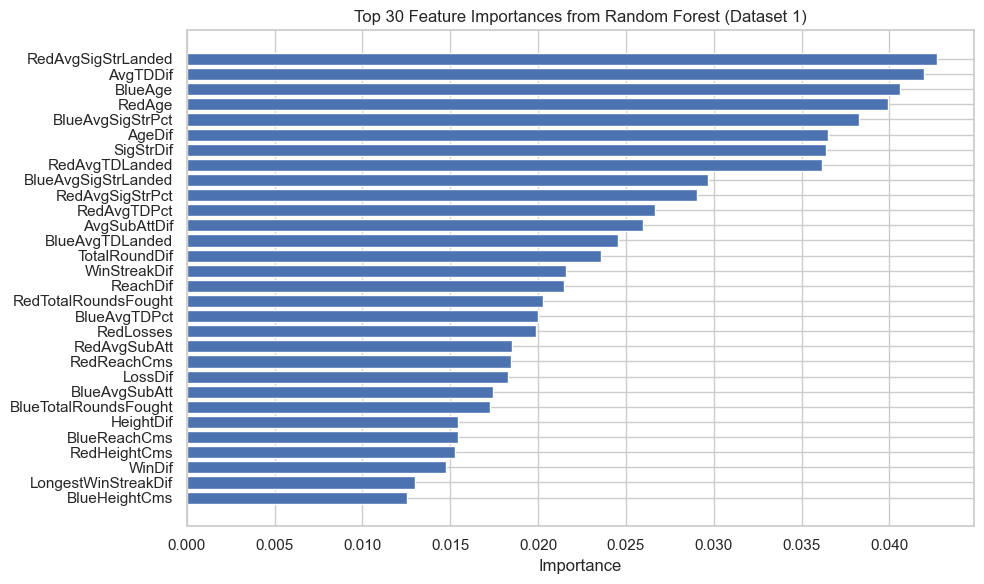

In [ ]:
# Build Pipeline (no scaler needed for tree-based models)
rf_pipe = Pipeline([
    ('rf', RandomForestClassifier(random_state=42))
])

# Define parameter distributions
rf_param_dist = {
    'rf__n_estimators': list(range(50, 301, 50)),           
    'rf__max_depth': list(range(3, 31, 3)),                  
    'rf__min_samples_split': list(range(2, 21, 3)),          
    'rf__min_samples_leaf': list(range(1, 21, 3)),          
    'rf__max_features': np.round(np.arange(0.1, 1.0, 0.2), 2).tolist()  
}

# Running the model for Dataset 1
best_rf_1, best_params_rf_1, best_rf_1_auc = run_model('Random Forest (Dataset 1)', rf_pipe, rf_param_dist, X_train1, y_train1, X_test1, y_test1)

# Extracting the model from the pipeline
best_rf_1 = best_rf_1.named_steps['rf']

# Adding the AUC-ROC score to the dict
auc_roc_scores['Random Forest (Dataset 1)'] = best_rf_1_auc

# Feature importances
plot_feature_importances('Random Forest (Dataset 1)', best_rf_1, X_train1.columns)

**Dataset 2: PCA**

Best Parameters:
 - rf__n_estimators: 150
 - rf__min_samples_split: 8
 - rf__min_samples_leaf: 16
 - rf__max_features: 0.3
 - rf__max_depth: 3

AUC-ROC Score: 0.5922

Classification Report for Test set:
              precision    recall  f1-score   support

         Red       0.70      0.55      0.61       426
        Blue       0.55      0.70      0.61       336

    accuracy                           0.61       762
   macro avg       0.62      0.62      0.61       762
weighted avg       0.63      0.61      0.61       762



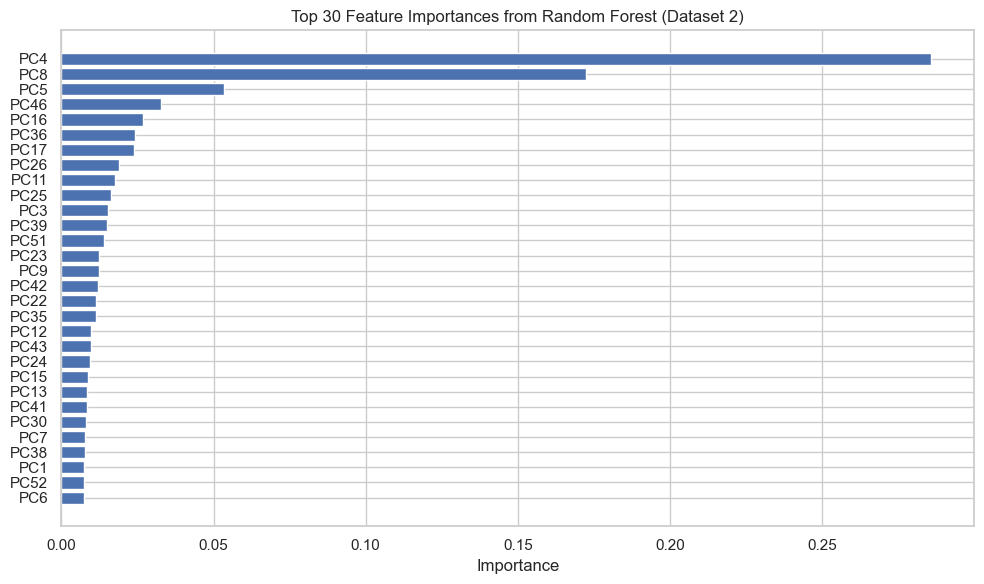

In [59]:
# Running the model for Dataset 2
best_rf_2, best_params_rf_2, best_rf_2_auc = run_model('Random Forest (Dataset 2)', rf_pipe, rf_param_dist, X_train2, y_train2, X_test2, y_test2)

# Extracting the model from the pipeline
best_rf_2 = best_rf_2.named_steps['rf']

# Adding the AUC-ROC score to the dict
auc_roc_scores['Random Forest (Dataset 2)'] = best_rf_2_auc

# Feature importances
plot_feature_importances('Random Forest (Dataset 2)', best_rf_2, X_train2.columns)


**Dataset 3: Selected Features**

Best Parameters:
 - rf__n_estimators: 150
 - rf__min_samples_split: 5
 - rf__min_samples_leaf: 16
 - rf__max_features: 0.1
 - rf__max_depth: 6

AUC-ROC Score: 0.6067

Classification Report for Test set:
              precision    recall  f1-score   support

         Red       0.72      0.63      0.67       426
        Blue       0.60      0.69      0.64       336

    accuracy                           0.66       762
   macro avg       0.66      0.66      0.66       762
weighted avg       0.67      0.66      0.66       762



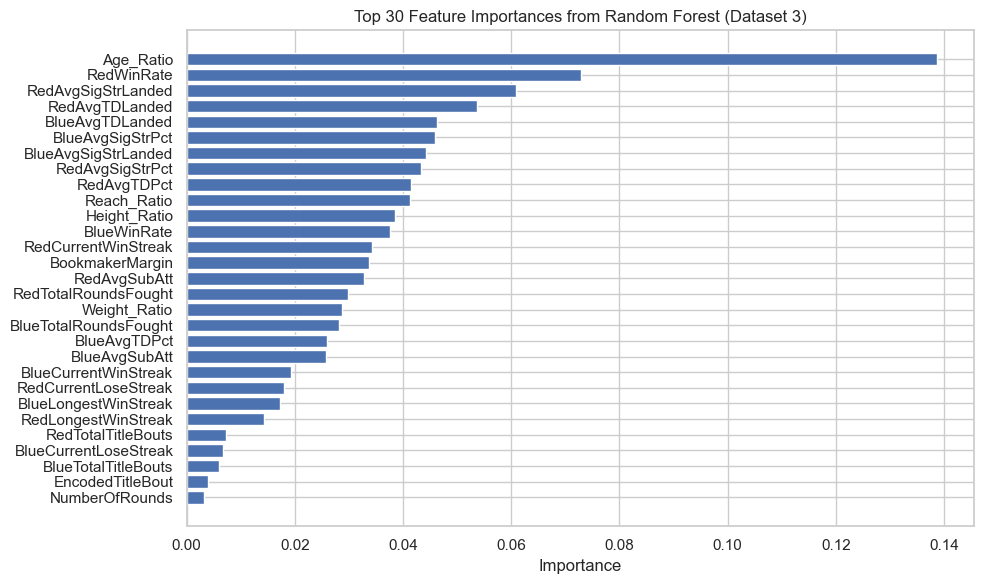

In [60]:
# Running the model for Dataset 3
best_rf_3, best_params_rf_3, best_rf_3_auc = run_model('Random Forest (Dataset 3)', rf_pipe, rf_param_dist, X_train3, y_train3, X_test3, y_test3)

# Extracting the model from the pipeline
best_rf_3 = best_rf_3.named_steps['rf']

# Adding the AUC-ROC score to the dict
auc_roc_scores['Random Forest (Dataset 3)'] = best_rf_3_auc

# Feature importances
plot_feature_importances('Random Forest (Dataset 3)', best_rf_3, X_train3.columns)

**Dataset 4: Selected Features with Odds**

Best Parameters:
 - rf__n_estimators: 100
 - rf__min_samples_split: 11
 - rf__min_samples_leaf: 10
 - rf__max_features: 0.3
 - rf__max_depth: 3

AUC-ROC Score: 0.7000

Classification Report for Test set:
              precision    recall  f1-score   support

         Red       0.76      0.54      0.64       426
        Blue       0.58      0.79      0.66       336

    accuracy                           0.65       762
   macro avg       0.67      0.67      0.65       762
weighted avg       0.68      0.65      0.65       762



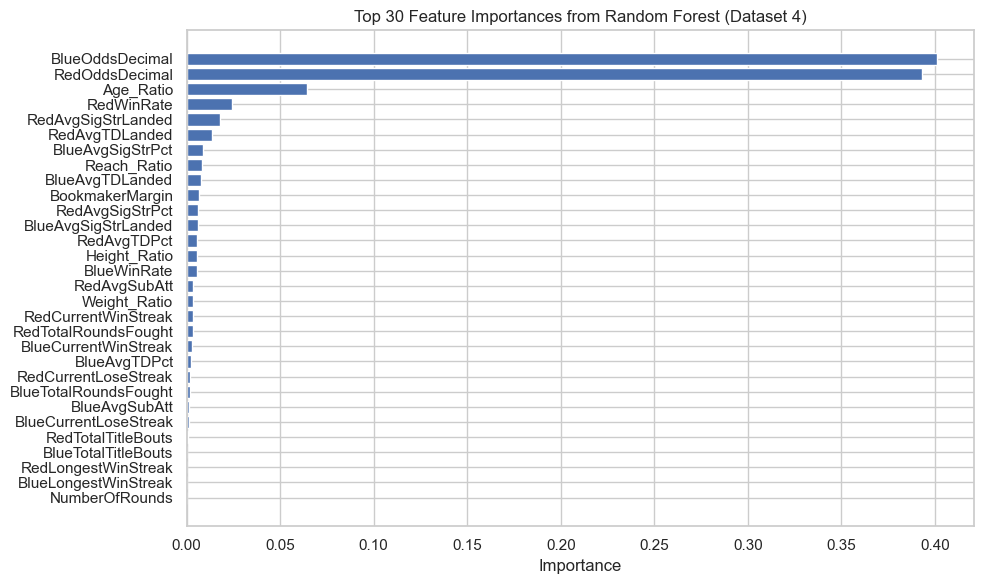

In [61]:
# Running the model for Dataset 4
best_rf_4, best_params_rf_4, best_rf_4_auc = run_model('Random Forest (Dataset 4)', rf_pipe, rf_param_dist, X_train4, y_train4, X_test4, y_test4)

# Extracting the model from the pipeline
best_rf_4 = best_rf_4.named_steps['rf']

# Adding the AUC-ROC score to the dict
auc_roc_scores['Random Forest (Dataset 4)'] = best_rf_4_auc

# Feature importances
plot_feature_importances('Random Forest (Dataset 4)', best_rf_4, X_train4.columns)

#### Results

In [62]:
# Cleaning the best parameters
cleaned_params_rf_1 = clean_best_params(best_params_rf_1, prefix='rf')
cleaned_params_rf_2 = clean_best_params(best_params_rf_2, prefix='rf')
cleaned_params_rf_3 = clean_best_params(best_params_rf_3, prefix='rf')
cleaned_params_rf_4 = clean_best_params(best_params_rf_4, prefix='rf')

# Putting them in a list
cleaned_params_rf_list = [cleaned_params_rf_1, cleaned_params_rf_2, cleaned_params_rf_3, cleaned_params_rf_4]

# Calling the function to re-run the models
rf_runtimes = evaluate_best_models(cleaned_params_rf_list, rf_pipe, 'rf', 'Random Forest')

# Display results
display(rf_runtimes)

,Model,Accuracy,ROC AUC,Runtime (s),Params
0,Best_Random Forest_1,0.6588,0.6559,1.0613,"{'n_estimators': 300, 'min_samples_split': 17, 'min_samples_leaf': 4, 'max_features': 0.1, 'max_..."
1,Best_Random Forest_2,0.6142,0.6229,1.4342,"{'n_estimators': 150, 'min_samples_split': 8, 'min_samples_leaf': 16, 'max_features': 0.3, 'max_..."
2,Best_Random Forest_3,0.6575,0.6607,0.2182,"{'n_estimators': 150, 'min_samples_split': 5, 'min_samples_leaf': 16, 'max_features': 0.1, 'max_..."
3,Best_Random Forest_4,0.6509,0.6652,0.2587,"{'n_estimators': 100, 'min_samples_split': 11, 'min_samples_leaf': 10, 'max_features': 0.3, 'max..."


### XGBoost

**Dataset 1: All Features**

/opt/anaconda3/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py:752: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


Best Parameters:
 - xgb__n_estimators: 200
 - xgb__max_depth: 3
 - xgb__learning_rate: 0.06
 - xgb__gamma: 0.8

AUC-ROC Score: 0.6013

Classification Report for Test set:
              precision    recall  f1-score   support

         Red       0.69      0.61      0.65       426
        Blue       0.57      0.66      0.61       336

    accuracy                           0.63       762
   macro avg       0.63      0.64      0.63       762
weighted avg       0.64      0.63      0.63       762



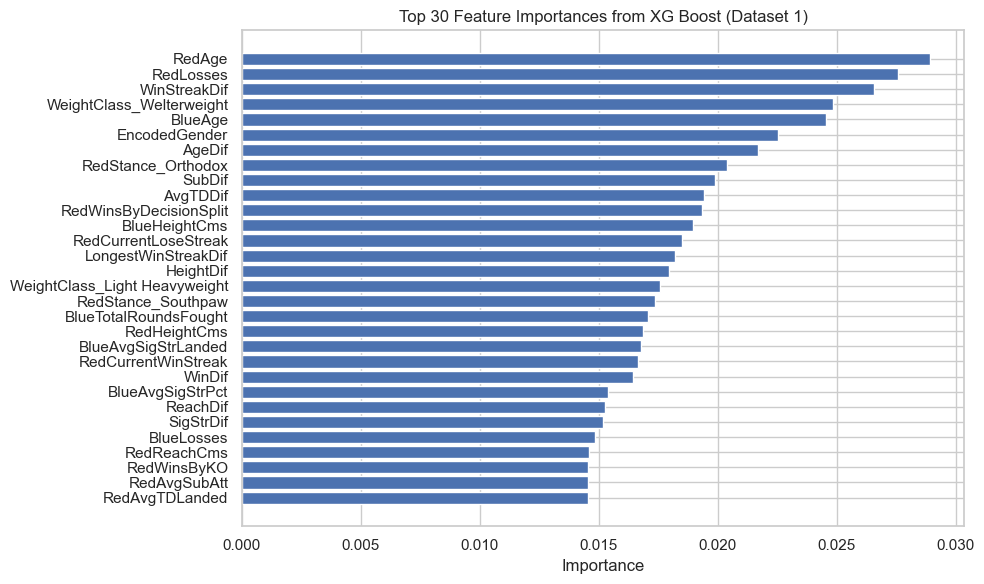

In [ ]:
# Build pipeline
xgb_pipe = Pipeline([
    ('xgb', XGBClassifier(eval_metric='logloss', random_state=42))
])

# RandomizedSearchCV
xgb_param_dist = {
    'xgb__n_estimators': list(range(50, 501, 50)),       
    'xgb__learning_rate': np.round(np.arange(0.01, 0.31, 0.05), 2).tolist(),  
    'xgb__max_depth': list(range(3, 31, 3)),              
    'xgb__gamma': np.round(np.arange(0, 1.05, 0.2), 2).tolist()  
}

# Running the model for Dataset 1
best_xgb_1, best_params_xgb_1, best_xgb_1_auc = run_model('XG Boost (Dataset 1)', xgb_pipe, xgb_param_dist, X_train1, y_train1, X_test1, y_test1)

# Extracting the model from the pipeline
best_xgb_1 = best_xgb_1.named_steps['xgb']

# Adding the AUC-ROC score to the dict
auc_roc_scores['XG Boost (Dataset 1)'] = best_xgb_1_auc

# Plot feature importances
plot_feature_importances('XG Boost (Dataset 1)', best_xgb_1, X_train1.columns)



**Dataset 2: PCA**

Best Parameters:
 - xgb__n_estimators: 150
 - xgb__max_depth: 3
 - xgb__learning_rate: 0.01
 - xgb__gamma: 0.2

AUC-ROC Score: 0.5735

Classification Report for Test set:
              precision    recall  f1-score   support

         Red       0.68      0.56      0.62       426
        Blue       0.55      0.67      0.60       336

    accuracy                           0.61       762
   macro avg       0.62      0.62      0.61       762
weighted avg       0.62      0.61      0.61       762



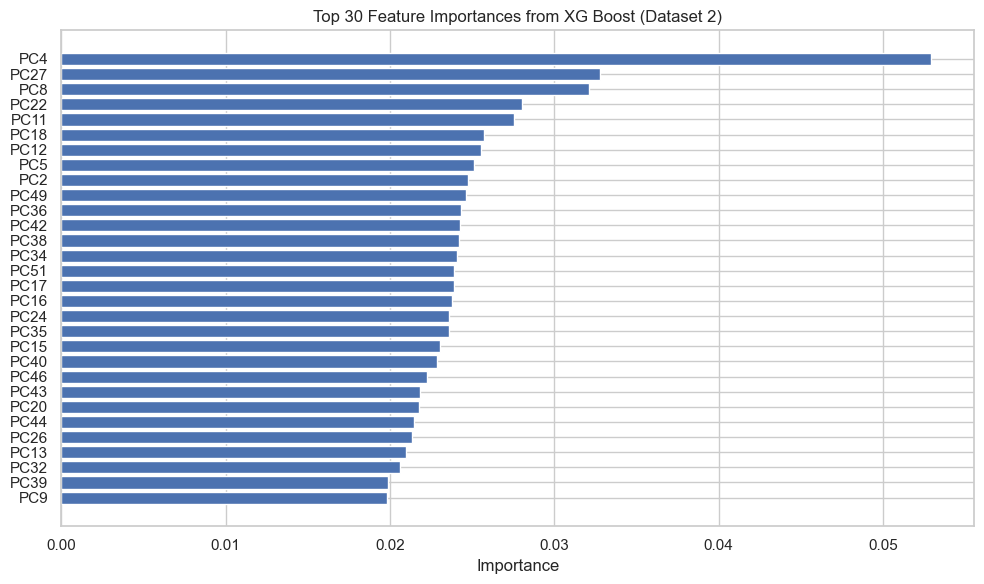

In [64]:
# Running the function for model for Dataset 2
best_xgb_2, best_params_xgb_2, best_xgb_2_auc = run_model('XG Boost (Dataset 2)', xgb_pipe, xgb_param_dist, X_train2, y_train2, X_test2, y_test2)

# Extracting the model from the pipeline
best_xgb_2 = best_xgb_2.named_steps['xgb']

# Adding the AUC-ROC score to the dict
auc_roc_scores['XG Boost (Dataset 2)'] = best_xgb_2_auc

# Plot feature importances
plot_feature_importances('XG Boost (Dataset 2)', best_xgb_2, X_train2.columns)

**Dataset 3: Selected Features**

/opt/anaconda3/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py:752: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


Best Parameters:
 - xgb__n_estimators: 300
 - xgb__max_depth: 3
 - xgb__learning_rate: 0.01
 - xgb__gamma: 0.2

AUC-ROC Score: 0.5970

Classification Report for Test set:
              precision    recall  f1-score   support

         Red       0.68      0.60      0.64       426
        Blue       0.56      0.64      0.60       336

    accuracy                           0.62       762
   macro avg       0.62      0.62      0.62       762
weighted avg       0.63      0.62      0.62       762



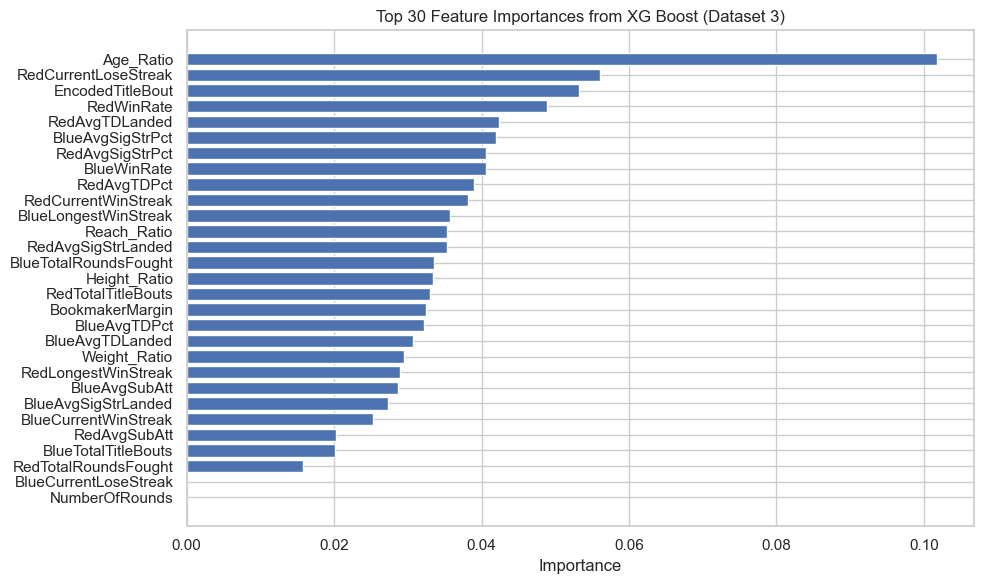

In [65]:
# Running the function for model for Dataset 3
best_xgb_3, best_params_xgb_3, best_xgb_3_auc = run_model('XG Boost (Dataset 3)', xgb_pipe, xgb_param_dist, X_train3, y_train3, X_test3, y_test3)

# Extracting the model from the pipeline
best_xgb_3 = best_xgb_3.named_steps['xgb']

# Adding the AUC-ROC score to the dict
auc_roc_scores['XG Boost (Dataset 3)'] = best_xgb_3_auc

# Plot feature importances
plot_feature_importances('XG Boost (Dataset 3)', best_xgb_3, X_train3.columns)

**Dataset 4: Selected Features with Odds**

/opt/anaconda3/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py:752: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


Best Parameters:
 - xgb__n_estimators: 150
 - xgb__max_depth: 3
 - xgb__learning_rate: 0.01
 - xgb__gamma: 0.2

AUC-ROC Score: 0.6971

Classification Report for Test set:
              precision    recall  f1-score   support

         Red       0.75      0.58      0.66       426
        Blue       0.59      0.76      0.66       336

    accuracy                           0.66       762
   macro avg       0.67      0.67      0.66       762
weighted avg       0.68      0.66      0.66       762



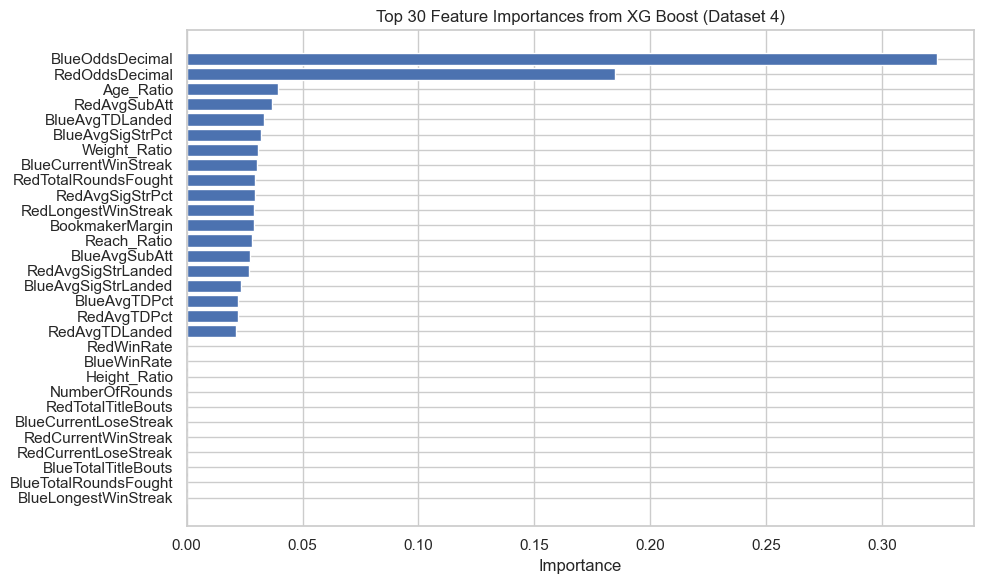

In [66]:
# Running the function for model for Dataset 4
best_xgb_4, best_params_xgb_4, best_xgb_4_auc = run_model('XG Boost (Dataset 4)', xgb_pipe, xgb_param_dist, X_train4, y_train4, X_test4, y_test4)

# Extracting the model from the pipeline
best_xgb_4 = best_xgb_4.named_steps['xgb']

# Adding the AUC-ROC score to the dict
auc_roc_scores['XG Boost (Dataset 4)'] = best_xgb_4_auc

# Plot feature importances
plot_feature_importances('XG Boost (Dataset 4)', best_xgb_4, X_train4.columns)

#### Results

In [67]:
# Cleaning the best parameters
cleaned_params_xgb_1 = clean_best_params(best_params_xgb_1, prefix='xgb')
cleaned_params_xgb_2 = clean_best_params(best_params_xgb_2, prefix='xgb')
cleaned_params_xgb_3 = clean_best_params(best_params_xgb_3, prefix='xgb')
cleaned_params_xgb_4 = clean_best_params(best_params_xgb_4, prefix='xgb')

# Putting them in a list
cleaned_params_xgb_list = [cleaned_params_xgb_1, cleaned_params_xgb_2, cleaned_params_xgb_3, cleaned_params_xgb_4]

# Calling the function to re-run the models
xgb_runtimes = evaluate_best_models(cleaned_params_xgb_list, xgb_pipe, 'xgb', 'XG Boost')

# Display results
display(xgb_runtimes)

,Model,Accuracy,ROC AUC,Runtime (s),Params
0,Best_XG Boost_1,0.6325,0.6352,0.1315,"{'n_estimators': 200, 'max_depth': 3, 'learning_rate': 0.06, 'gamma': 0.8}"
1,Best_XG Boost_2,0.6102,0.6168,0.0998,"{'n_estimators': 150, 'max_depth': 3, 'learning_rate': 0.01, 'gamma': 0.2}"
2,Best_XG Boost_3,0.6194,0.6216,0.1012,"{'n_estimators': 300, 'max_depth': 3, 'learning_rate': 0.01, 'gamma': 0.2}"
3,Best_XG Boost_4,0.6614,0.6717,0.0539,"{'n_estimators': 150, 'max_depth': 3, 'learning_rate': 0.01, 'gamma': 0.2}"


### Neural Network

#### Further Preparation (for NNs)

**Splitting the training sets into Train / Validation**

In [ ]:
# Dataset 1
scaler1 = StandardScaler()
X_train1, X_val1, y_train1, y_val1 = train_test_split(
    X_train1, y_train1,
    test_size=len(X_test1),
    random_state=42,
    shuffle=True
)
X_train1_scaled = scaler1.fit_transform(X_train1)
X_val1_scaled = scaler1.transform(X_val1)
X_test1_scaled = scaler1.transform(X_test1)

# Dataset 2
scaler2 = StandardScaler()
X_train2, X_val2, y_train2, y_val2 = train_test_split(
    X_train2, y_train2,
    test_size=len(X_test2),
    random_state=42,
    shuffle=True
)
X_train2_scaled = scaler2.fit_transform(X_train2)
X_val2_scaled = scaler2.transform(X_val2)
X_test2_scaled = scaler2.transform(X_test2)

# Dataset 3
scaler3 = StandardScaler()
X_train3, X_val3, y_train3, y_val3 = train_test_split(
    X_train3, y_train3,
    test_size=len(X_test3),
    random_state=42,
    shuffle=True
)
X_train3_scaled = scaler3.fit_transform(X_train3)
X_val3_scaled = scaler3.transform(X_val3)
X_test3_scaled = scaler3.transform(X_test3)

# Dataset 4
scaler4 = StandardScaler()
X_train4, X_val4, y_train4, y_val4 = train_test_split(
    X_train4, y_train4,
    test_size=len(X_test4),
    random_state=42,
    shuffle=True
)
X_train4_scaled = scaler4.fit_transform(X_train4)
X_val4_scaled = scaler4.transform(X_val4)
X_test4_scaled = scaler4.transform(X_test4)

#### Setup

##### Plotting ROC AUC Curve Function

In [ ]:
def plot_roc_curve(y_true, y_probs, model_name="Model"):

    fpr, tpr, thresholds = roc_curve(y_true, y_probs)
    auc = roc_auc_score(y_true, y_probs)

    # Calculate Youden's J statistic for optimal threshold
    J = tpr - fpr
    optimal_idx = J.argmax()
    optimal_threshold = thresholds[optimal_idx]

    # Plot
    plt.figure(figsize=(6, 6))
    plt.plot(fpr, tpr, color="red", label=f"ROC curve (AUC = {auc:.3f})")
    plt.plot([0, 1], [0, 1], "--", color="gray", label="Random Guess")
    plt.scatter(fpr[optimal_idx], tpr[optimal_idx], color="black", zorder=10,
                label=f"Optimal Threshold = {optimal_threshold:.2f}")

    plt.title(f"ROC Curve — {model_name}")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate (Recall)")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    print(f"AUC Score: {auc:.4f}")
    print(f"Optimal Threshold (Youden’s J): {optimal_threshold:.4f}")


##### Training Function

In [ ]:
def train_mlp_with_grid(chosen_model, X_train, y_train, X_val, y_val, learning_rates, batch_sizes, epochs):
    logs = []
    best_model = None
    best_model_time = None
    best_val_auc = -1
    input_dim = X_train.shape[1]

    #  compute class weights
    class_weights = class_weight.compute_class_weight(
        class_weight='balanced',
        classes=np.unique(y_train),
        y=y_train
    )
    class_weights = dict(enumerate(class_weights))

    for lr in learning_rates:
        for batch_size in batch_sizes:
            model = chosen_model(input_dim)
            optimizer = Adam(learning_rate=lr)
            model.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])

            # Learning Rate Scheduler
            lr_scheduler = ReduceLROnPlateau(
                monitor='val_loss',
                factor=0.5,
                patience=5,
                min_lr=1e-6,
                verbose=0
            )

            # Start training timer
            start_time = time.time()

            history = model.fit(
                X_train, y_train,
                validation_data=(X_val, y_val),
                epochs=epochs,
                batch_size=batch_size,
                verbose=0,
                callbacks=[EarlyStopping(patience=20, restore_best_weights=True), lr_scheduler],
                class_weight=class_weights
            )

            # End training timer
            end_time = time.time()

            # Log per-epoch training + validation loss
            for epoch in range(len(history.history['loss'])):
                logs.append({
                    ('Hyperparameters', 'Learning Rate'): lr,
                    ('Hyperparameters', 'Batch Size'): batch_size,
                    ('Metrics', 'Epoch'): epoch + 1,
                    ('Metrics', 'Training Loss'): history.history['loss'][epoch],
                    ('Metrics', 'Validation Loss'): history.history['val_loss'][epoch],
                })

            # Update best model
            val_probs = model.predict(X_val).flatten()
            val_auc = roc_auc_score(y_val, val_probs)

            if val_auc > best_val_auc:
                best_val_auc = val_auc
                best_model = model
                best_model_time = end_time - start_time
                best_param = {
                    'learning_rate': lr,
                    'batch_size': batch_size,
                    'val_auc': val_auc,
                    'epoch': epoch
                }

            print(f"LR={lr}, Batch={batch_size}, AUC={val_auc:.4f}")

    # Convert logs to a MultiIndex DataFrame
    df_logs = pd.DataFrame(logs)
    df_logs.columns = pd.MultiIndex.from_tuples(df_logs.columns)

    return df_logs, best_model, best_param, best_model_time

##### Evaluation Function

In [ ]:
def evaluate_model(model, runtime, X_val, y_val, use_optimal_threshold=True, plot_roc=False, model_name="Model"):
    # Get predicted probabilities from the model
    probs = model.predict(X_val).flatten()

    if use_optimal_threshold:
        # Calculate ROC curve values
        fpr, tpr, thresholds = roc_curve(y_val, probs)
        # Calculate Youden's J statistic
        J = tpr - fpr
        # Find index of best threshold
        optimal_idx = J.argmax()
        # Get the optimal threshold
        optimal_threshold = thresholds[optimal_idx]
    else:
        # Use default threshold of 0.5
        optimal_threshold = 0.5

    # Convert probabilities to class predictions using the chosen threshold
    preds = (probs > optimal_threshold).astype(int)
    
    # Calculate AUC score, classification report, confusion matrix
    auc = roc_auc_score(y_val, probs)
    report = classification_report(y_val, preds, output_dict=True)
    matrix = confusion_matrix(y_val, preds)

    # Print
    print("Confusion Matrix:\n", matrix)
    print("Classification Report:")
    print(classification_report(y_val, preds))
    print(f"AUC: {auc:.4f}")
    print(f"Runtime: {runtime:.2f} seconds")
    print(f"Threshold used: {optimal_threshold:.4f} ({'Optimal' if use_optimal_threshold else 'Default'})")
    

    if plot_roc:
        plot_roc_curve(y_val, probs, model_name=model_name)

    return probs, preds, auc, optimal_threshold

##### Plotting Training and Validation Loss Function

In [ ]:
def plot_train_val_loss(df, plot_text_size=10, zoom=None):
    
    # Get unique learning rates and batch sizes
    learning_rates = df[('Hyperparameters', 'Learning Rate')].unique()
    batch_sizes = df[('Hyperparameters', 'Batch Size')].unique()

    # Calculate number of subplots needed and create
    num_plots = len(learning_rates) * len(batch_sizes)
    fig, axs = plt.subplots(num_plots, 1, figsize=(10, 4 * num_plots), squeeze=False)
    plt.style.use('seaborn-v0_8-whitegrid')

    axs = axs.flatten()
    plot_idx = 0

    # Loop over each combination of learning rate and batch size
    for lr in learning_rates:
        for bs in batch_sizes:
            # Filter the DataFrame for current hyperparameters
            filtered_df = df[
                (df[('Hyperparameters', 'Learning Rate')] == lr) &
                (df[('Hyperparameters', 'Batch Size')] == bs)
            ]

            # Get epoch, training loss, and validation loss
            epochs = filtered_df[('Metrics', 'Epoch')]
            training_loss = filtered_df[('Metrics', 'Training Loss')]
            validation_loss = filtered_df[('Metrics', 'Validation Loss')]

            # Plot training and validation loss
            axs[plot_idx].plot(epochs, training_loss, label="Training Loss", marker='o', color='black')
            axs[plot_idx].plot(epochs, validation_loss, label="Validation Loss", marker='x', linestyle='--', color='black')

             # Set titles and labels
            axs[plot_idx].set_title(f"LR: {lr}, Batch Size: {bs}", fontsize=plot_text_size)
            axs[plot_idx].set_xlabel("Epoch", fontsize=plot_text_size)
            axs[plot_idx].set_ylabel("Loss", fontsize=plot_text_size)

            if zoom:
                axs[plot_idx].set_ylim(zoom)

            axs[plot_idx].legend(fontsize=plot_text_size)
            axs[plot_idx].grid(True, linestyle='dotted', linewidth=0.5)

            plot_idx += 1

    plt.tight_layout()
    plt.show()


##### Training Pipeline

In [ ]:
def train_model_pipeline(
    model_dict,
    X_train=None, y_train=None,
    X_val=None, y_val=None,
    X_test=None, y_test=None,
    learning_rates=[0.001, 0.005, 0.01, 0.05],
    batch_sizes=[16, 32, 64, 128, 256],
    num_epochs=200,
    zoom=None,
    use_pca=False,
    n_components=10
):
    # Use default global datasets if not provided
    if X_train is None or y_train is None:
        try:
            from warnings import warn
            warn("Using global defaults for data splits.")
            X_train = globals()["X_train_scaled"]
            y_train = globals()["y_train"]
            X_val = globals()["X_val_scaled"]
            y_val = globals()["y_val"]
            X_test = globals()["X_test_scaled"]
            y_test = globals()["y_test"]
        except KeyError as e:
            raise ValueError(f"Missing default dataset: {e}. You must pass data explicitly.")

    pca = None
    if use_pca:
        # Apply PCA for dimensionality reduction
        from sklearn.decomposition import PCA
        pca = PCA(n_components=n_components)
        X_train = pca.fit_transform(X_train)
        X_val = pca.transform(X_val)
        X_test = pca.transform(X_test)

    results = {}

    # Loop over all models in the dictionary
    for name, builder in model_dict.items():
        print(f"\n--- Training {name} ---")

        # Train model using grid search
        df_logs, best_model, best_params, best_model_time = train_mlp_with_grid(
            builder, X_train, y_train, X_val, y_val,
            learning_rates, batch_sizes, num_epochs
        )
        
        # Evaluate the best model
        probs, preds, auc, threshold = evaluate_model(
            best_model, best_model_time, 
            X_val, y_val,
            use_optimal_threshold=True,
            plot_roc=True,
            model_name=name
        )

        # Filter logs for best hyperparameters
        best_lr = best_params['learning_rate']
        best_bs = best_params['batch_size']
        best_logs = df_logs[
            (df_logs[('Hyperparameters', 'Learning Rate')] == best_lr) &
            (df_logs[('Hyperparameters', 'Batch Size')] == best_bs)
        ]

        # Plot training vs validation loss
        print(f"Plotting loss for {name}")
        plot_train_val_loss(best_logs, zoom=zoom)

        # Save results
        results[name] = {
            'model': best_model,
            'logs': df_logs,
            'best_params': best_params,
            'auc': auc,
            'threshold': threshold,
            'model_time': best_model_time
        }

    return results, pca


##### Ranking Models by AUC Function

In [ ]:
def rank_models_by_auc(results_dict, X_test, y_test, label="Model", use_optimal_threshold=True):
    
    # Sort models by AUC in descending order
    sorted_models = sorted(
        [(name, data['auc'], data['model'], data['best_params'], data['model_time'], data.get('threshold', 0.5))
         for name, data in results_dict.items()],
        key=lambda x: x[1],
        reverse=True
    )

    # Print model rankings
    print(f"\n{label} models ranked by AUC:")
    for name, auc, _, params, model_time, _ in sorted_models:
        print(f"{name}: AUC = {auc:.4f}, Params = {params}, Runtime = {model_time:.2f}s")

    # Select the best model
    best_name, best_auc, best_model, best_params, best_model_time, best_threshold = sorted_models[0]
    
    # Get predicted probabilities on test set
    y_probs = best_model.predict(X_test).flatten()
    
    # Convert probabilities to class predictions using best threshold and generate classification report
    preds = (y_probs > best_threshold).astype(int)
    report = classification_report(y_test, preds, output_dict=True)

    # Print evaluation
    print(f"\nBest {label} Model: {best_name}")
    print(f"AUC: {best_auc:.4f}")
    print(f"Best Hyperparameters: {best_params}")
    print(f"Model Training Time: {best_model_time:.4f} seconds")
    print(f"Threshold used: {best_threshold:.4f}")
    print(f"\nAUC on Test Set: {roc_auc_score(y_test, y_probs):.4f}")
    print("Classification Report:")
    print(classification_report(y_test, preds))

    return sorted_models, (best_name, best_auc, best_model, best_params, best_threshold, report)


#### ReLU Activation

##### Architecture

In [ ]:
def model_normal_1(input_dim):
    model = Sequential([
        Input(shape=(input_dim,)),
        Dense(16, activation='relu'),
        Dense(1, activation='sigmoid')
    ])
    return model

def model_normal_2(input_dim):
    model = Sequential([
        Input(shape=(input_dim,)),
        Dense(32, activation='relu'),
        Dense(16, activation='relu'),
        Dense(1, activation='sigmoid')
    ])
    return model

def model_normal_3(input_dim):
    model = Sequential([
        Input(shape=(input_dim,)),
        Dense(64, activation='relu'),
        Dense(32, activation='relu'),
        Dense(16, activation='relu'),
        Dense(1, activation='sigmoid')
    ])
    return model

def model_normal_4(input_dim):
    model = Sequential([
        Input(shape=(input_dim,)),
        Dense(128, activation='relu'),
        Dense(64, activation='relu'),
        Dense(32, activation='relu'),
        Dense(16, activation='relu'),
        Dense(1, activation='sigmoid')
    ])
    return model

def model_dropout_1(input_dim):
    model = Sequential([
        Input(shape=(input_dim,)),
        Dense(16, activation='relu'),
        Dropout(0.3),
        Dense(1, activation='sigmoid')
    ])
    return model

def model_dropout_2(input_dim):
    model = Sequential([
        Input(shape=(input_dim,)),
        Dense(32, activation='relu'),
        Dropout(0.3),
        Dense(16, activation='relu'),
        Dropout(0.3),
        Dense(1, activation='sigmoid')
    ])
    return model

def model_dropout_3(input_dim):
    model = Sequential([
        Input(shape=(input_dim,)),
        Dense(64, activation='relu'),
        Dropout(0.3),
        Dense(32, activation='relu'),
        Dropout(0.3),
        Dense(16, activation='relu'),
        Dropout(0.3),
        Dense(1, activation='sigmoid')
    ])
    return model

def model_dropout_4(input_dim):
    model = Sequential([
        Input(shape=(input_dim,)),
        Dense(128, activation='relu'),
        Dropout(0.3),
        Dense(64, activation='relu'),
        Dropout(0.3),
        Dense(32, activation='relu'),
        Dropout(0.3),
        Dense(16, activation='relu'),
        Dropout(0.3),
        Dense(1, activation='sigmoid')
    ])
    return model


In [76]:
# Store all normal models in a dictionary
normal_model_dict = {
    "Normal_1": model_normal_1,
    "Normal_2": model_normal_2,
    "Normal_3": model_normal_3,
    "Normal_4": model_normal_4
}

dropout_model_dict = {
    "Dropout_1": model_dropout_1,
    "Dropout_2": model_dropout_2,
    "Dropout_3": model_dropout_3,
    "Dropout_4": model_dropout_4
}

##### Dataset 1

**Splitting and Scaling** MOVE

In [ ]:

seed_value = 42
np.random.seed(seed_value)
tf.random.set_seed(seed_value)
random.seed(seed_value)

device_name = tf.test.gpu_device_name()
device = 'GPU' if device_name else 'CPU'
print(f"Using device: {device}")

Using device: CPU


**Training**


--- Training Normal_1 ---
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 757us/step
LR=0.001, Batch=16, AUC=0.5780
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 900us/step
LR=0.001, Batch=32, AUC=0.6099
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 754us/step
LR=0.001, Batch=64, AUC=0.6183
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 914us/step
LR=0.001, Batch=128, AUC=0.5727
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 759us/step
LR=0.001, Batch=256, AUC=0.5835
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 884us/step
LR=0.005, Batch=16, AUC=0.5952
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 745us/step
LR=0.005, Batch=32, AUC=0.5917
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 926us/step
LR=0.005, Batch=64, AUC=0.5989
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 749us/step
LR=0.005, Batch=128, AUC=0.6142
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 728us/step
LR=0.005, Batch=256, AUC=0.5973
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 786us/step
LR=0.01, Batch=16, AUC=0.5984
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 771us/step
LR=0.01, Batch=32, AUC=0.6117
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, Batch=64, AUC=0.6174
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/ste

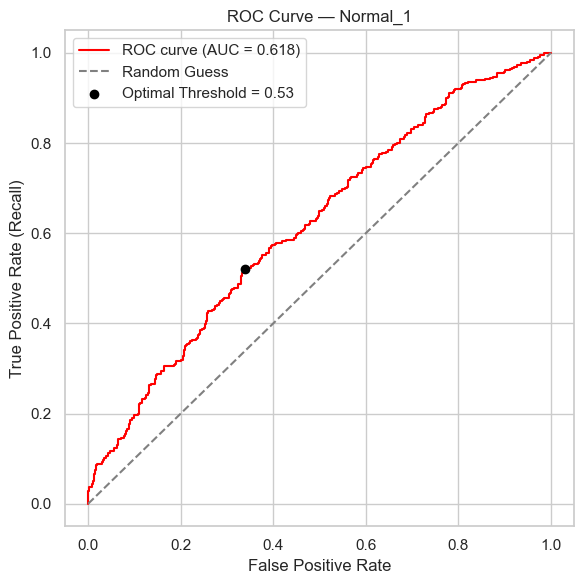

AUC Score: 0.6183
Optimal Threshold (Youden’s J): 0.5332
Plotting loss for Normal_1


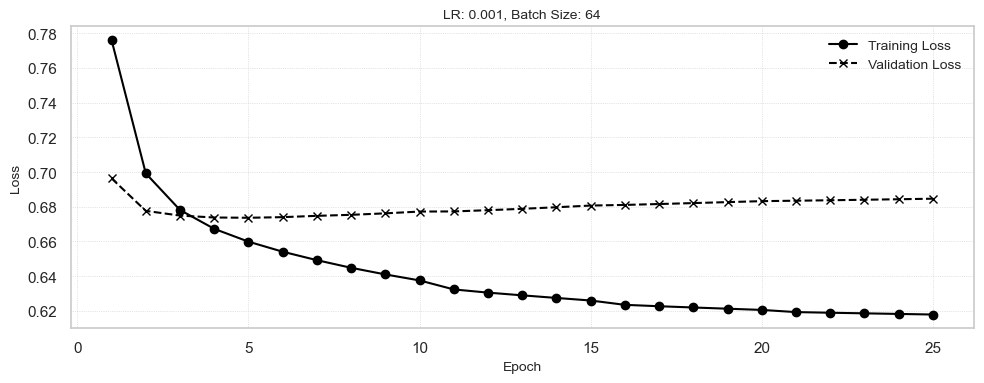


--- Training Normal_2 ---
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=16, AUC=0.5809
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step
LR=0.001, Batch=32, AUC=0.5831
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=64, AUC=0.6022
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=128, AUC=0.5577
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=256, AUC=0.5657
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=16, AUC=0.6001
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=32, AUC=0.6074
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=64, AUC=0.5695
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=128, AUC=0.5715
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 970us/step
LR=0.005, Batch=256, AUC=0.5893
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, Batch=16, AUC=0.5857
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step
LR=0.01, Batch=32, AUC=0.5829
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, Batch=64, AUC=0.6068
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 944us/step
LR=0.

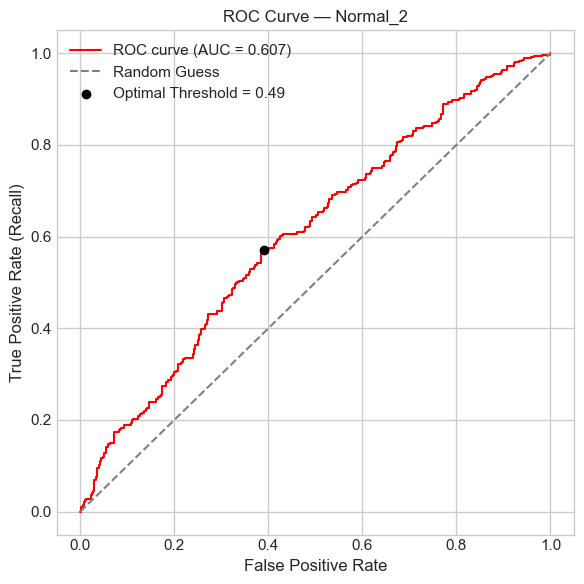

AUC Score: 0.6074
Optimal Threshold (Youden’s J): 0.4936
Plotting loss for Normal_2


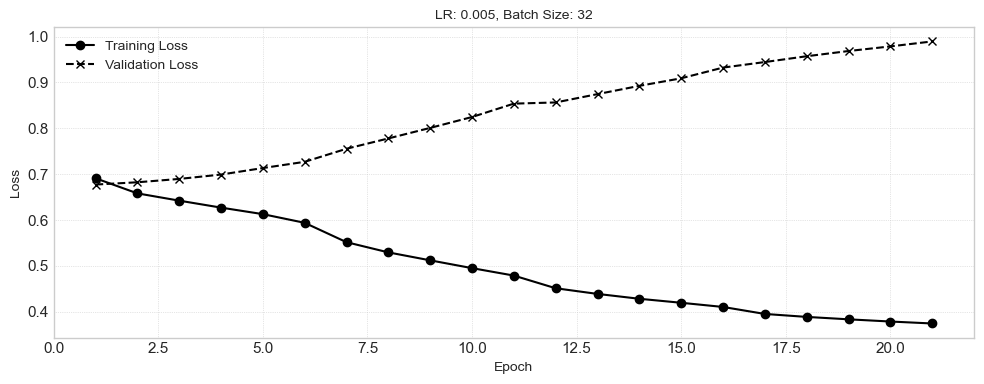


--- Training Normal_3 ---
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=16, AUC=0.5641
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=32, AUC=0.5663
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=64, AUC=0.5540
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=128, AUC=0.6049
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=256, AUC=0.5872
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=16, AUC=0.6160
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=32, AUC=0.5965
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=64, AUC=0.5805
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=128, AUC=0.5476
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=256, AUC=0.5738
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, Batch=16, AUC=0.5927
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, Batch=32, AUC=0.6097
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, Batch=64, AUC=0.5909
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, 

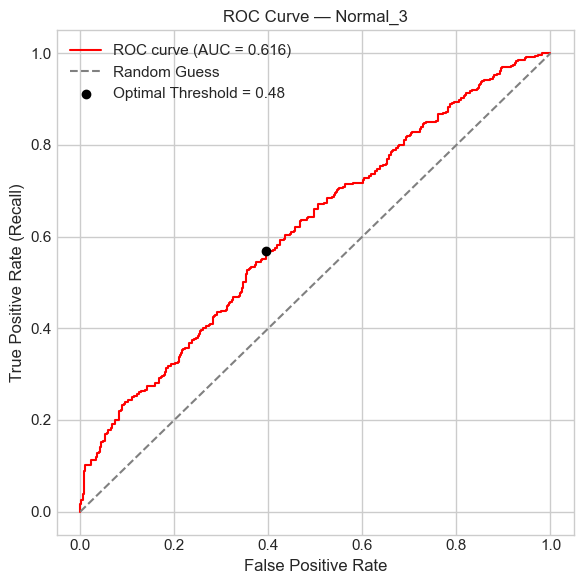

AUC Score: 0.6160
Optimal Threshold (Youden’s J): 0.4815
Plotting loss for Normal_3


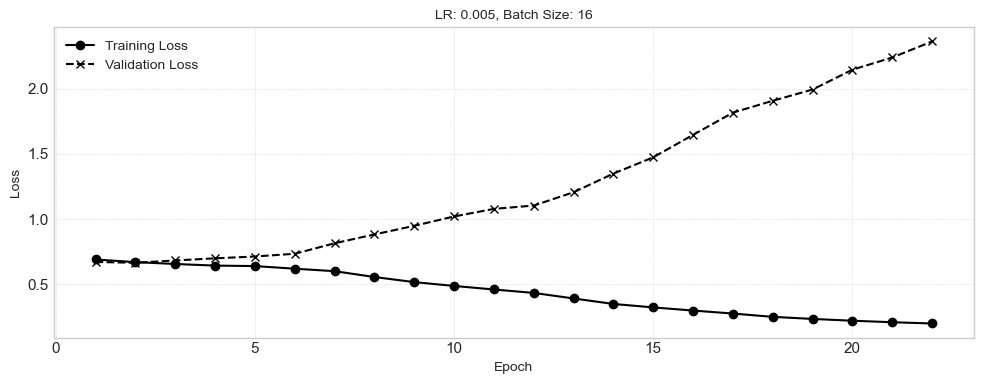


--- Training Normal_4 ---
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=16, AUC=0.5911
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=32, AUC=0.6026
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=64, AUC=0.5753
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=128, AUC=0.5987
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=256, AUC=0.6060
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=16, AUC=0.5973
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=32, AUC=0.5993
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=64, AUC=0.6063
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=128, AUC=0.5937
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=256, AUC=0.5938
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, Batch=16, AUC=0.6043
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, Batch=32, AUC=0.6014
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, Batch=64, AUC=0.5916
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, 

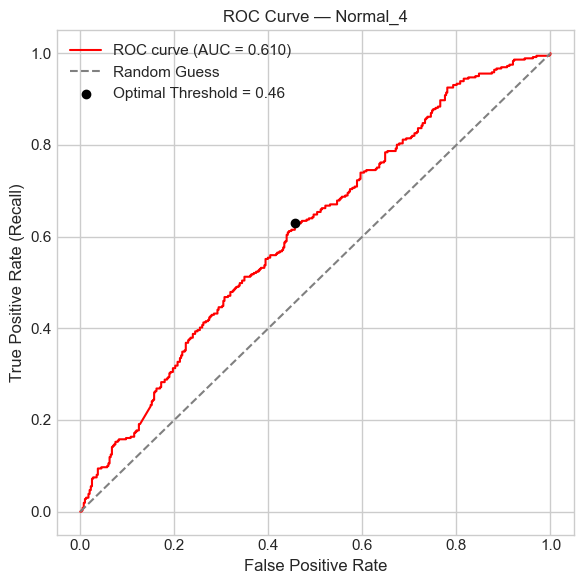

AUC Score: 0.6097
Optimal Threshold (Youden’s J): 0.4627
Plotting loss for Normal_4


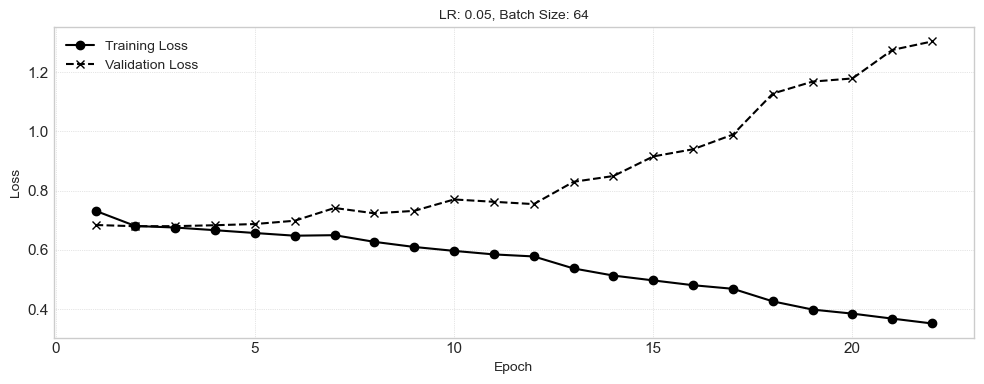


--- Training Dropout_1 ---
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 976us/step
LR=0.001, Batch=16, AUC=0.5996
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 968us/step
LR=0.001, Batch=32, AUC=0.6043
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=64, AUC=0.5915
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=128, AUC=0.5972
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 969us/step
LR=0.001, Batch=256, AUC=0.6052
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 952us/step
LR=0.005, Batch=16, AUC=0.6049
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 949us/step
LR=0.005, Batch=32, AUC=0.6085
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 956us/step
LR=0.005, Batch=64, AUC=0.6041
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 963us/step
LR=0.005, Batch=128, AUC=0.6086
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 784us/step
LR=0.005, Batch=256, AUC=0.6027
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 997us/step
LR=0.01, Batch=16, AUC=0.6020
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, Batch=32, AUC=0.6172
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, Batch=64, AUC=0.6219
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 

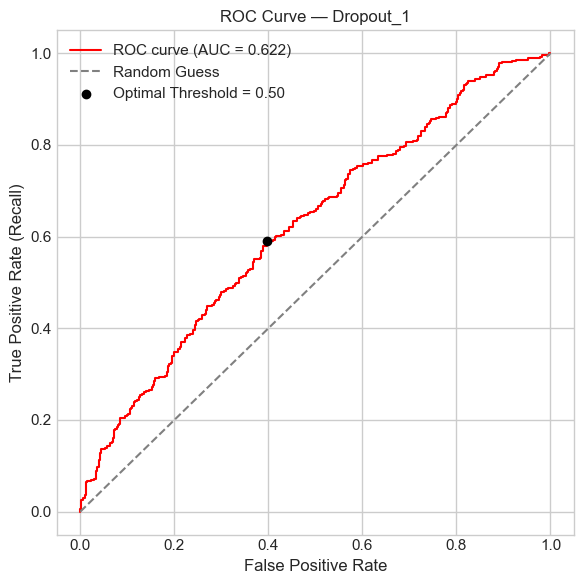

AUC Score: 0.6219
Optimal Threshold (Youden’s J): 0.4978
Plotting loss for Dropout_1


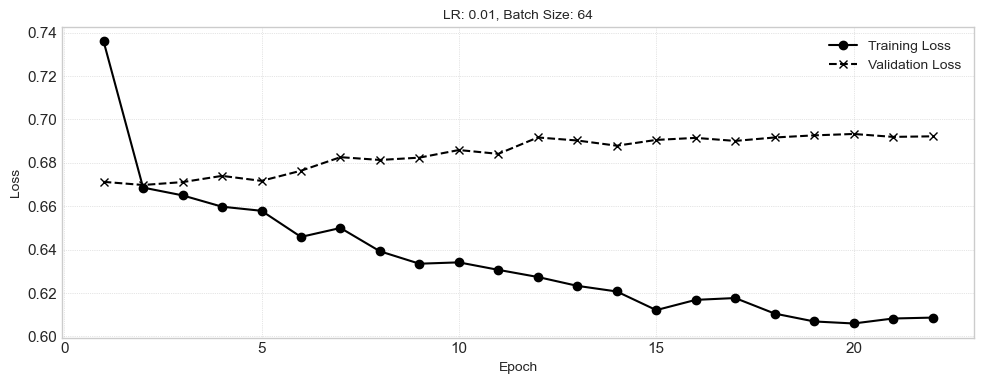


--- Training Dropout_2 ---
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=16, AUC=0.6119
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=32, AUC=0.5951
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=64, AUC=0.6078
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=128, AUC=0.5983
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=256, AUC=0.5971
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=16, AUC=0.6092
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=32, AUC=0.6118
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=64, AUC=0.5997
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=128, AUC=0.5992
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=256, AUC=0.5903
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 903us/step
LR=0.01, Batch=16, AUC=0.5828
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, Batch=32, AUC=0.5933
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, Batch=64, AUC=0.5961
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01

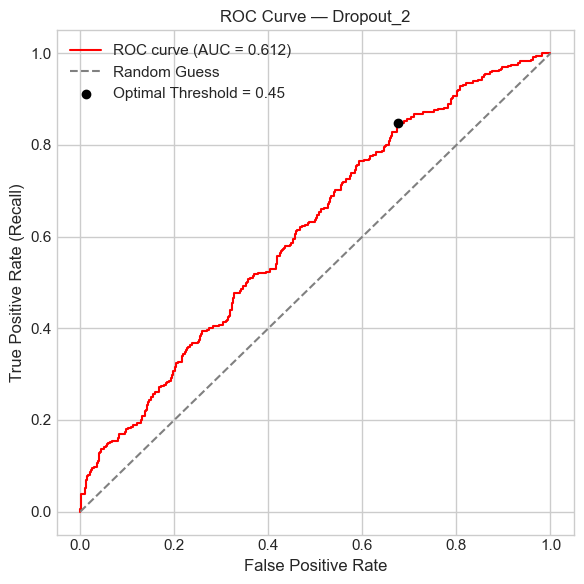

AUC Score: 0.6119
Optimal Threshold (Youden’s J): 0.4508
Plotting loss for Dropout_2


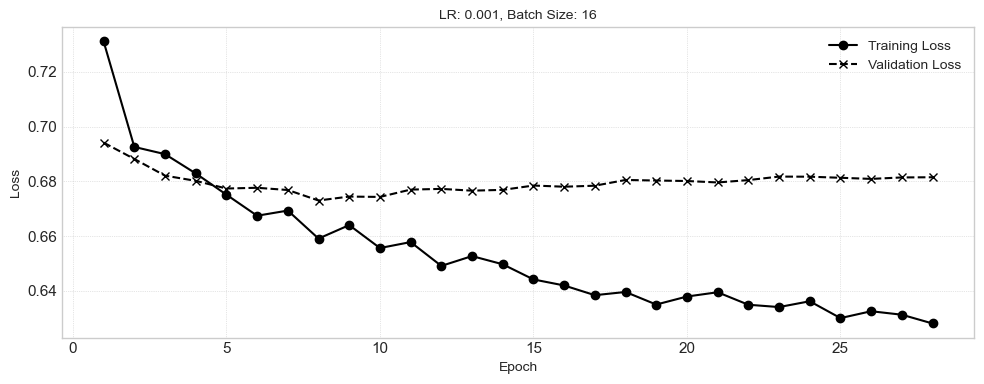


--- Training Dropout_3 ---
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=16, AUC=0.6048
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=32, AUC=0.5976
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=64, AUC=0.6087
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=128, AUC=0.5926
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=256, AUC=0.6101
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=16, AUC=0.6155
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=32, AUC=0.6129
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=64, AUC=0.6210
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=128, AUC=0.6145
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=256, AUC=0.5971
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, Batch=16, AUC=0.5960
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, Batch=32, AUC=0.6132
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, Batch=64, AUC=0.6128
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01,

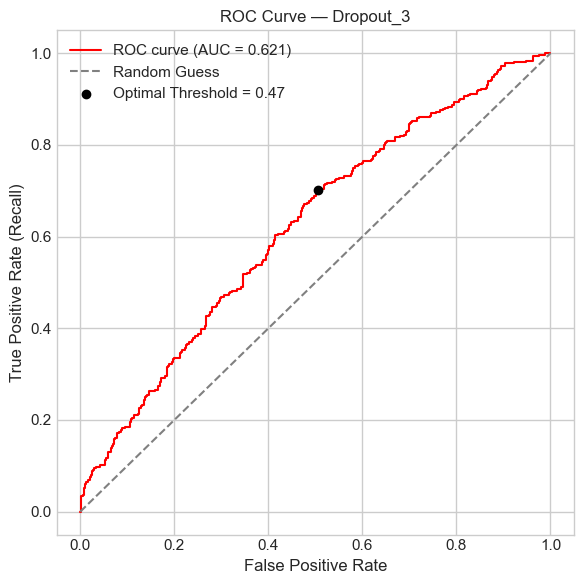

AUC Score: 0.6210
Optimal Threshold (Youden’s J): 0.4651
Plotting loss for Dropout_3


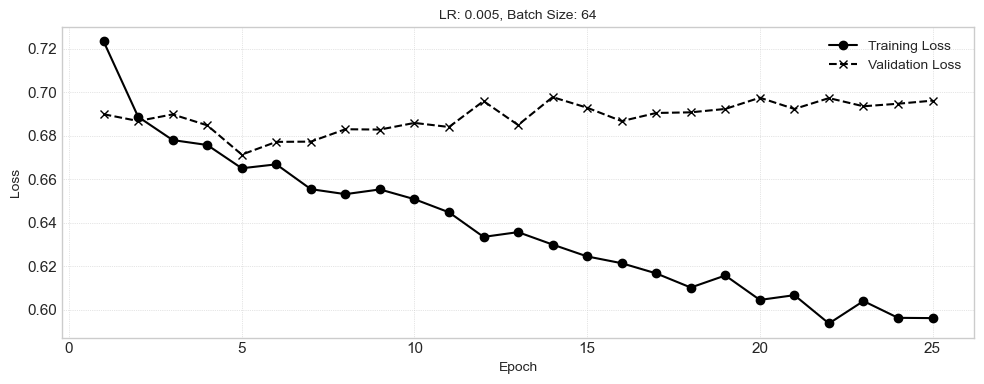


--- Training Dropout_4 ---
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=16, AUC=0.6076
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=32, AUC=0.5948
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=64, AUC=0.5993
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=128, AUC=0.6000
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=256, AUC=0.6002
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=16, AUC=0.6113
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=32, AUC=0.6031
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=64, AUC=0.5837
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=128, AUC=0.5973
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=256, AUC=0.5955
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, Batch=16, AUC=0.4972
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, Batch=32, AUC=0.6004
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, Batch=64, AUC=0.6106
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01,

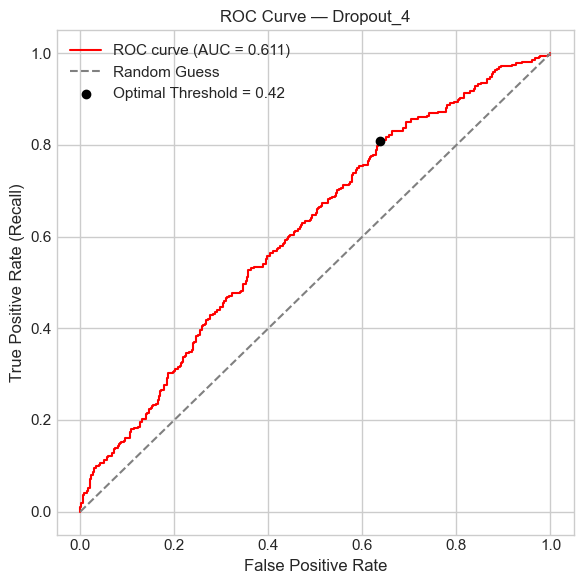

AUC Score: 0.6113
Optimal Threshold (Youden’s J): 0.4241
Plotting loss for Dropout_4


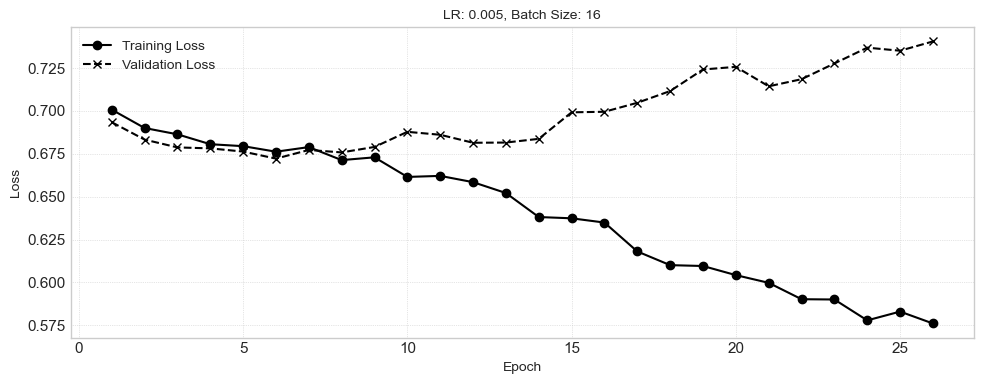

In [78]:
# Normal models
results_normal_ds1, _ = train_model_pipeline(
    model_dict=normal_model_dict,
    X_train=X_train1_scaled,
    y_train=y_train1,
    X_val=X_val1_scaled,
    y_val=y_val1,
    X_test=X_test1_scaled,
    y_test=y_test1
)

# Dropout models
results_dropout_ds1, _ = train_model_pipeline(
    model_dict=dropout_model_dict,
    X_train=X_train1_scaled,
    y_train=y_train1,
    X_val=X_val1_scaled,
    y_val=y_val1,
    X_test=X_test1_scaled,
    y_test=y_test1
)


**Evaluation**

In [79]:
# Collecting results from the normal models
sorted_normal_models_ds1, best_normal_ds1 = rank_models_by_auc(results_normal_ds1, X_test1_scaled, y_test1, label="Normal")

# Collecting results from the dropout models
sorted_dropout_models_ds1, best_dropout_ds1 = rank_models_by_auc(results_dropout_ds1, X_test1_scaled, y_test1, label="Dropout")


Normal models ranked by AUC:
Normal_1: AUC = 0.6183, Params = {'learning_rate': 0.001, 'batch_size': 64, 'val_auc': 0.6183295224542522, 'epoch': 24}, Runtime = 1.64s
Normal_3: AUC = 0.6160, Params = {'learning_rate': 0.005, 'batch_size': 16, 'val_auc': 0.6160015473780922, 'epoch': 21}, Runtime = 3.06s
Normal_4: AUC = 0.6097, Params = {'learning_rate': 0.05, 'batch_size': 64, 'val_auc': 0.6097429556303148, 'epoch': 21}, Runtime = 1.81s
Normal_2: AUC = 0.6074, Params = {'learning_rate': 0.005, 'batch_size': 32, 'val_auc': 0.6074080726162433, 'epoch': 20}, Runtime = 1.93s
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 518us/step

Best Normal Model: Normal_1
AUC: 0.6183
Best Hyperparameters: {'learning_rate': 0.001, 'batch_size': 64, 'val_auc': 0.6183295224542522, 'epoch': 24}
Model Training Time: 1.6374 seconds
Threshold used: 0.5332

AUC on Test Set: 0.6648
Classification Report:
              precision    recall  f1-score   support

           0       0.65      0.69      0.67       426
           1    

##### Dataset 2

In [ ]:
seed_value = 42
np.random.seed(seed_value)
tf.random.set_seed(seed_value)
random.seed(seed_value)

device_name = tf.test.gpu_device_name()
device = 'GPU' if device_name else 'CPU'
print(f"Using device: {device}")


Using device: CPU


**Training**


--- Training Normal_1 ---
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=16, AUC=0.6087
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step
LR=0.001, Batch=32, AUC=0.6042
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=64, AUC=0.5790
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step
LR=0.001, Batch=128, AUC=0.6051
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 948us/step
LR=0.001, Batch=256, AUC=0.6041
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step
LR=0.005, Batch=16, AUC=0.5912
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 971us/step
LR=0.005, Batch=32, AUC=0.5957
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 783us/step
LR=0.005, Batch=64, AUC=0.5906
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 780us/step
LR=0.005, Batch=128, AUC=0.5939
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=256, AUC=0.5839
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 912us/step
LR=0.01, Batch=16, AUC=0.6039
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 901us/step
LR=0.01, Batch=32, AUC=0.5852
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 894us/step
LR=0.01, Batch=64, AUC=0.5994
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 776us/ste

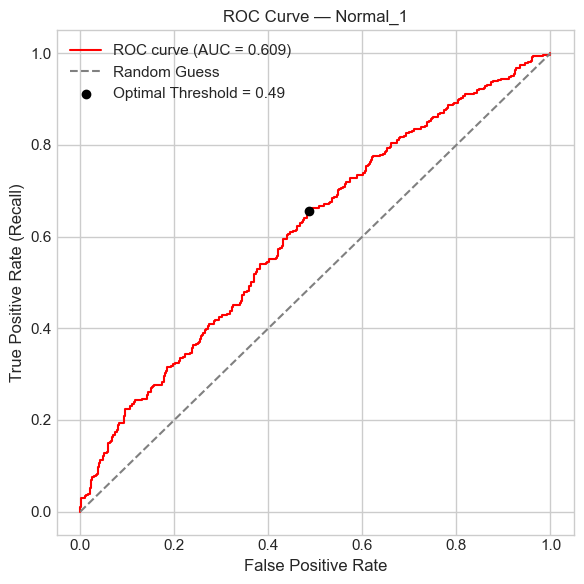

AUC Score: 0.6087
Optimal Threshold (Youden’s J): 0.4889
Plotting loss for Normal_1


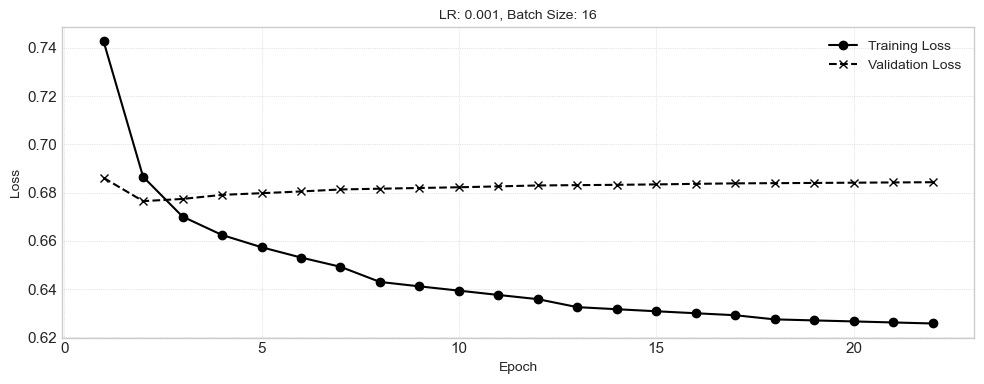


--- Training Normal_2 ---
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=16, AUC=0.5773
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=32, AUC=0.5748
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=64, AUC=0.5782
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=128, AUC=0.5966
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=256, AUC=0.5820
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=16, AUC=0.5828
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=32, AUC=0.6074
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 909us/step
LR=0.005, Batch=64, AUC=0.5807
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=128, AUC=0.5815
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 989us/step
LR=0.005, Batch=256, AUC=0.5659
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, Batch=16, AUC=0.5838
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, Batch=32, AUC=0.6015
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, Batch=64, AUC=0.6014
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 914us/step
LR=0.0

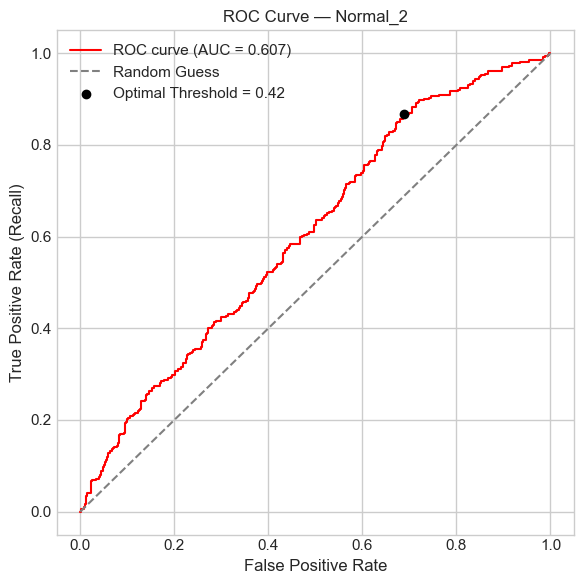

AUC Score: 0.6074
Optimal Threshold (Youden’s J): 0.4227
Plotting loss for Normal_2


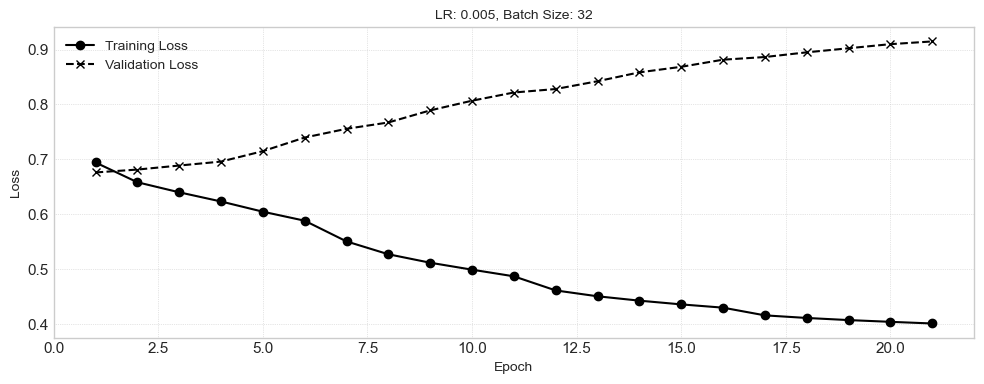


--- Training Normal_3 ---
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=16, AUC=0.5921
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=32, AUC=0.5677
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=64, AUC=0.5832
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=128, AUC=0.5860
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=256, AUC=0.5921
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=16, AUC=0.5916
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=32, AUC=0.5789
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=64, AUC=0.5949
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=128, AUC=0.5998
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=256, AUC=0.5832
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 953us/step
LR=0.01, Batch=16, AUC=0.5995
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, Batch=32, AUC=0.5905
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, Batch=64, AUC=0.6005
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01,

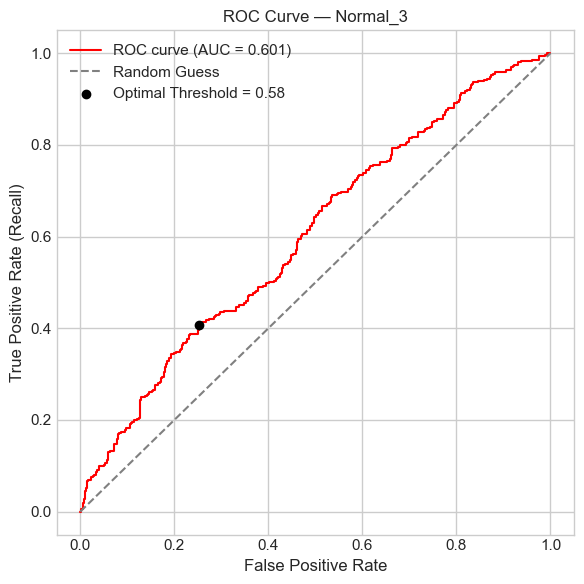

AUC Score: 0.6014
Optimal Threshold (Youden’s J): 0.5766
Plotting loss for Normal_3


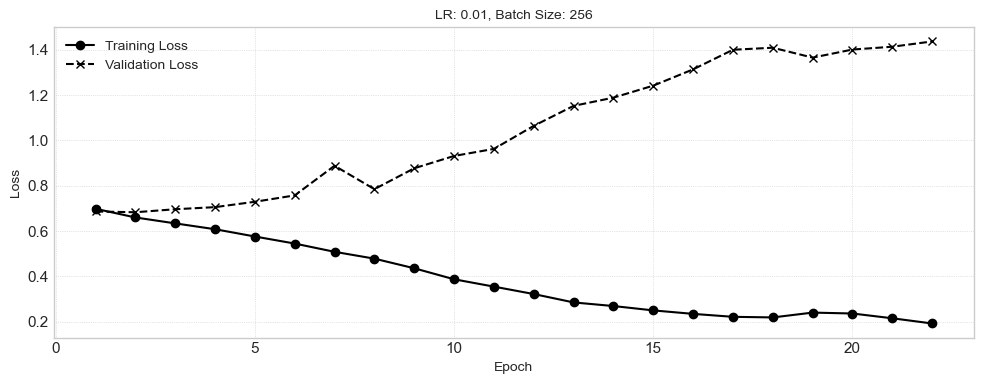


--- Training Normal_4 ---
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=16, AUC=0.5807
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=32, AUC=0.5945
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=64, AUC=0.6104
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=128, AUC=0.5997
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=256, AUC=0.5903
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=16, AUC=0.5889
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=32, AUC=0.6053
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=64, AUC=0.5932
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=128, AUC=0.5889
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=256, AUC=0.5873
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, Batch=16, AUC=0.5743
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, Batch=32, AUC=0.5797
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, Batch=64, AUC=0.5762
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, 

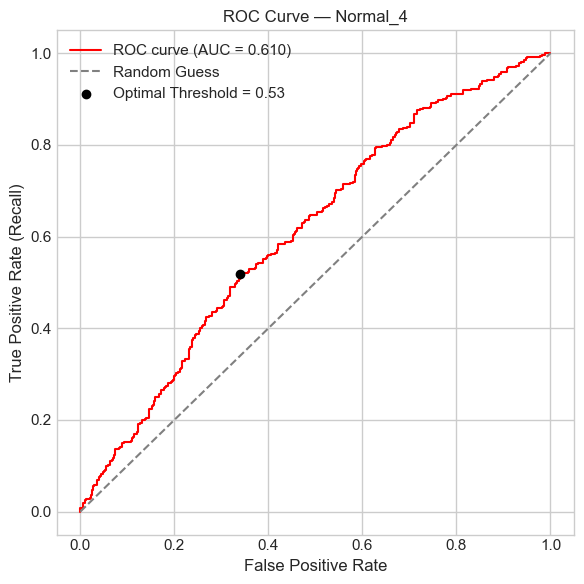

AUC Score: 0.6104
Optimal Threshold (Youden’s J): 0.5321
Plotting loss for Normal_4


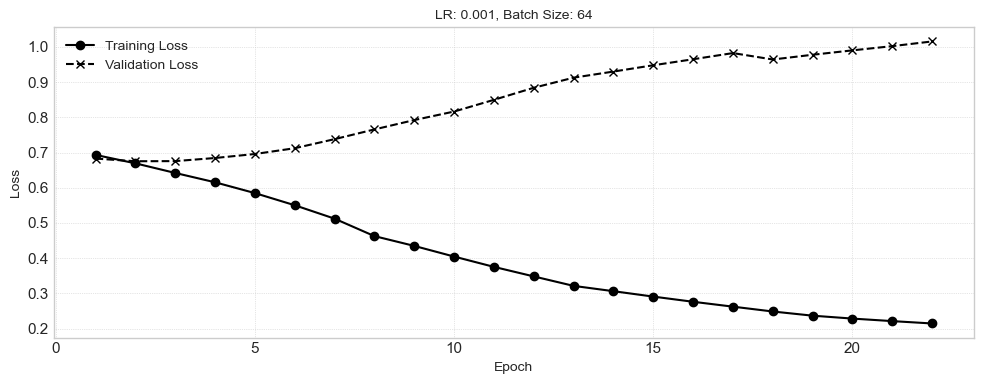


--- Training Dropout_1 ---
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 913us/step
LR=0.001, Batch=16, AUC=0.5940
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 965us/step
LR=0.001, Batch=32, AUC=0.5841
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 897us/step
LR=0.001, Batch=64, AUC=0.6063
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 983us/step
LR=0.001, Batch=128, AUC=0.6017
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 885us/step
LR=0.001, Batch=256, AUC=0.5937
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 915us/step
LR=0.005, Batch=16, AUC=0.5814
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 901us/step
LR=0.005, Batch=32, AUC=0.5947
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 908us/step
LR=0.005, Batch=64, AUC=0.6099
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 902us/step
LR=0.005, Batch=128, AUC=0.6037
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 892us/step
LR=0.005, Batch=256, AUC=0.5949
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 902us/step
LR=0.01, Batch=16, AUC=0.5920
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 904us/step
LR=0.01, Batch=32, AUC=0.5866
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 891us/step
LR=0.01, Batch=64, AUC=0.5916
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/s

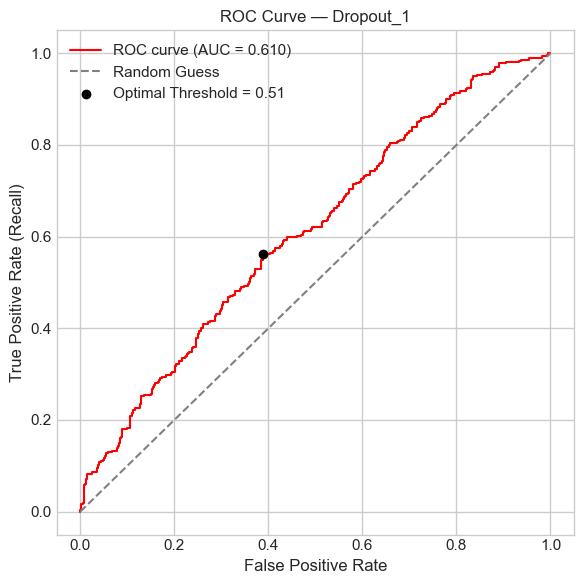

AUC Score: 0.6099
Optimal Threshold (Youden’s J): 0.5094
Plotting loss for Dropout_1


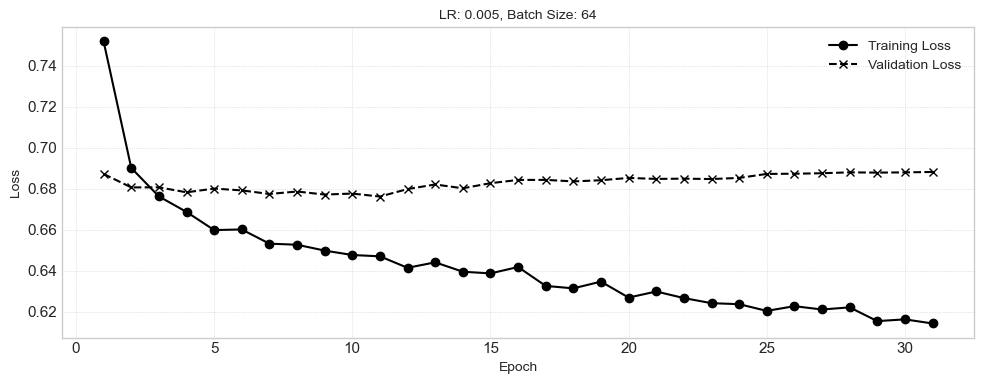


--- Training Dropout_2 ---
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=16, AUC=0.5901
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 979us/step
LR=0.001, Batch=32, AUC=0.5967
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 993us/step
LR=0.001, Batch=64, AUC=0.6023
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=128, AUC=0.5843
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=256, AUC=0.6085
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 866us/step
LR=0.005, Batch=16, AUC=0.6006
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=32, AUC=0.6004
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=64, AUC=0.5933
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=128, AUC=0.5976
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=256, AUC=0.5853
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, Batch=16, AUC=0.6044
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, Batch=32, AUC=0.6056
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, Batch=64, AUC=0.5942
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.

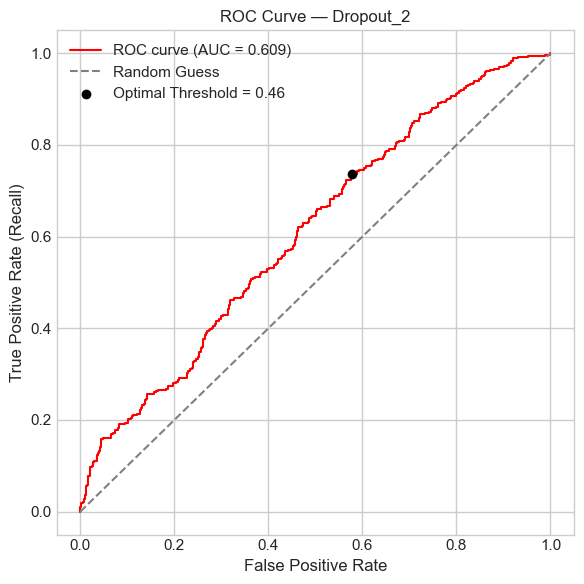

AUC Score: 0.6085
Optimal Threshold (Youden’s J): 0.4589
Plotting loss for Dropout_2


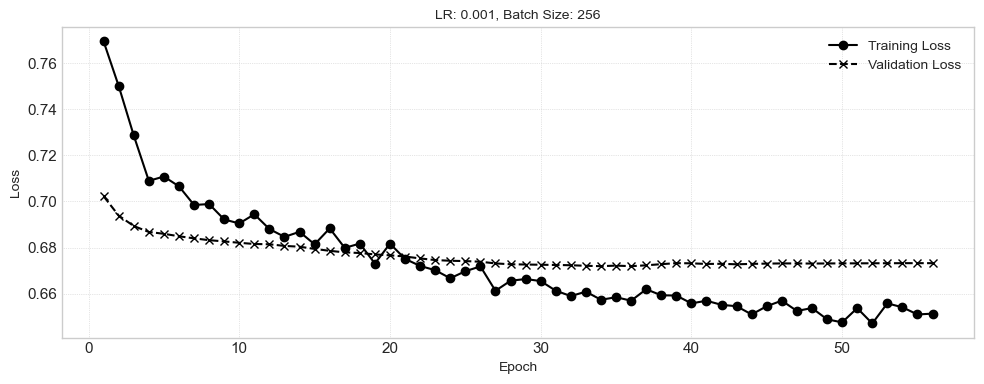


--- Training Dropout_3 ---
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=16, AUC=0.5922
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=32, AUC=0.6145
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=64, AUC=0.5869
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=128, AUC=0.5975
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=256, AUC=0.6057
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=16, AUC=0.6155
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=32, AUC=0.6012
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=64, AUC=0.6210
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=128, AUC=0.5903
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=256, AUC=0.5866
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, Batch=16, AUC=0.5963
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, Batch=32, AUC=0.5942
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, Batch=64, AUC=0.6053
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01,

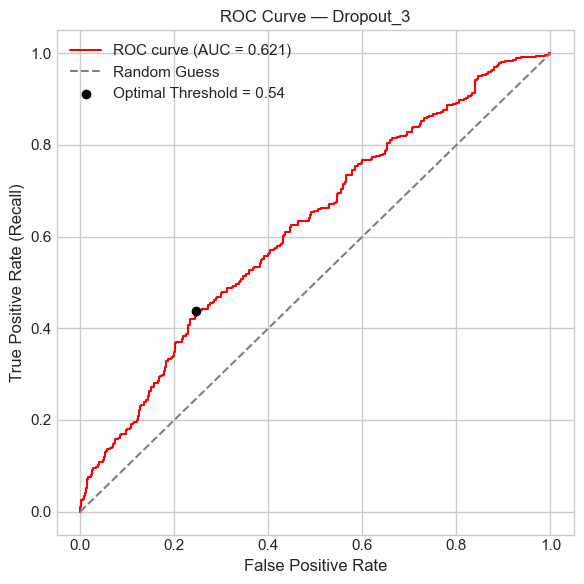

AUC Score: 0.6210
Optimal Threshold (Youden’s J): 0.5391
Plotting loss for Dropout_3


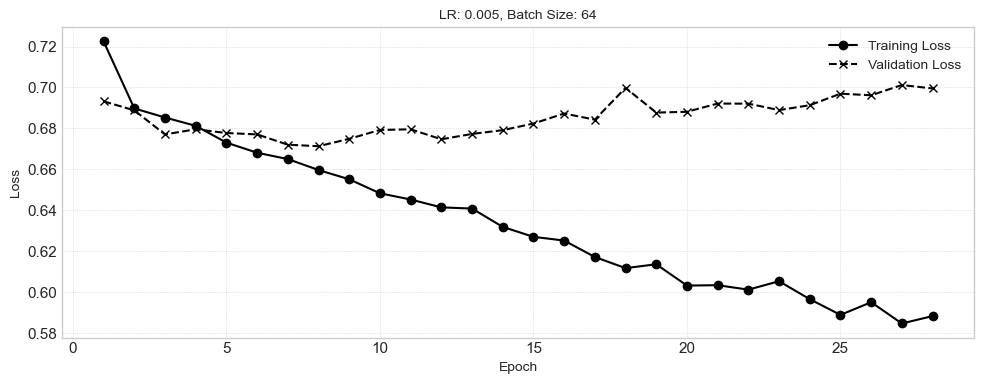


--- Training Dropout_4 ---
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=16, AUC=0.6076
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=32, AUC=0.5984
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=64, AUC=0.6104
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=128, AUC=0.5961
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=256, AUC=0.6135
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=16, AUC=0.6075
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=32, AUC=0.5827
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=64, AUC=0.6071
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=128, AUC=0.5968
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=256, AUC=0.5956
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, Batch=16, AUC=0.5422
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, Batch=32, AUC=0.5692
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, Batch=64, AUC=0.5951
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01,

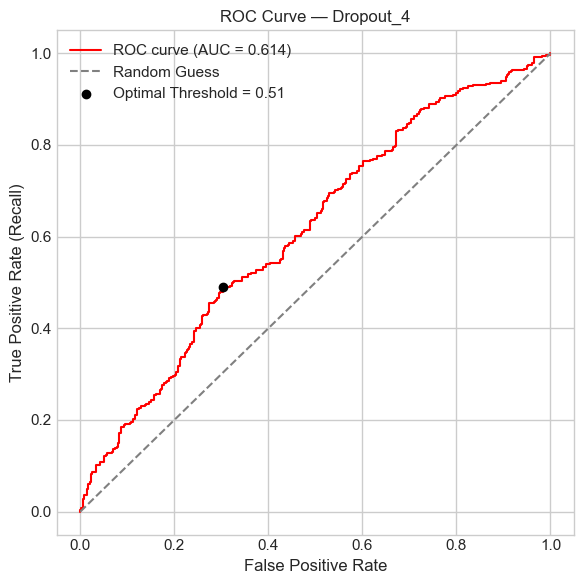

AUC Score: 0.6135
Optimal Threshold (Youden’s J): 0.5134
Plotting loss for Dropout_4


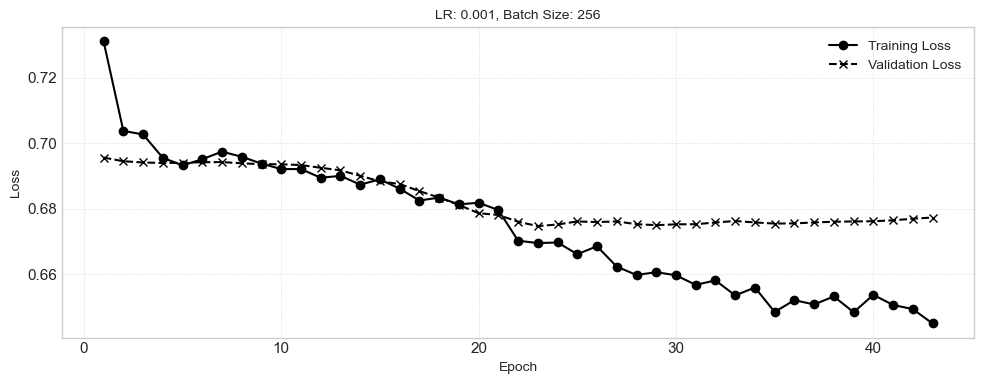

In [81]:
# Normal models
results_normal_ds2, _ = train_model_pipeline(
    model_dict=normal_model_dict,
    X_train=X_train2_scaled,
    y_train=y_train2,
    X_val=X_val2_scaled,
    y_val=y_val2,
    X_test=X_test2_scaled,
    y_test=y_test2
)

# Dropout models
results_dropout_ds2, _ = train_model_pipeline(
    model_dict=dropout_model_dict,
    X_train=X_train2_scaled,
    y_train=y_train2,
    X_val=X_val2_scaled,
    y_val=y_val2,
    X_test=X_test2_scaled,
    y_test=y_test2
)


**Evaluation**

In [82]:
# Collecting results for the normal models
sorted_normal_models_ds2, best_normal_ds2 = rank_models_by_auc(results_normal_ds2, X_test2_scaled, y_test2, label="Normal")

# Collecting results for the dropout models
sorted_dropout_models_ds2, best_dropout_ds2 = rank_models_by_auc(results_dropout_ds2, X_test2_scaled, y_test2, label="Dropout")


Normal models ranked by AUC:
Normal_4: AUC = 0.6104, Params = {'learning_rate': 0.001, 'batch_size': 64, 'val_auc': 0.6104475652972831, 'epoch': 21}, Runtime = 2.82s
Normal_1: AUC = 0.6087, Params = {'learning_rate': 0.001, 'batch_size': 16, 'val_auc': 0.6087067649435967, 'epoch': 21}, Runtime = 2.94s
Normal_2: AUC = 0.6074, Params = {'learning_rate': 0.005, 'batch_size': 32, 'val_auc': 0.6073804408645975, 'epoch': 20}, Runtime = 2.05s
Normal_3: AUC = 0.6014, Params = {'learning_rate': 0.01, 'batch_size': 256, 'val_auc': 0.6013705348816325, 'epoch': 21}, Runtime = 1.18s
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 594us/step

Best Normal Model: Normal_4
AUC: 0.6104
Best Hyperparameters: {'learning_rate': 0.001, 'batch_size': 64, 'val_auc': 0.6104475652972831, 'epoch': 21}
Model Training Time: 2.8227 seconds
Threshold used: 0.5321

AUC on Test Set: 0.6299
Classification Report:
              precision    recall  f1-score   support

           0       0.63      0.68      0.65       426
           1   

##### Dataset 3

In [83]:
import tensorflow as tf
import numpy as np
import random
import os

seed_value = 42
np.random.seed(seed_value)
tf.random.set_seed(seed_value)
random.seed(seed_value)

device_name = tf.test.gpu_device_name()
device = 'GPU' if device_name else 'CPU'
print(f"Using device: {device}")


Using device: CPU


**Training**


--- Training Normal_1 ---
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=16, AUC=0.6099
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=32, AUC=0.6102
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 861us/step
LR=0.001, Batch=64, AUC=0.6143
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 992us/step
LR=0.001, Batch=128, AUC=0.5963
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 966us/step
LR=0.001, Batch=256, AUC=0.6187
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 808us/step
LR=0.005, Batch=16, AUC=0.5996
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 955us/step
LR=0.005, Batch=32, AUC=0.5995
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 784us/step
LR=0.005, Batch=64, AUC=0.6104
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 954us/step
LR=0.005, Batch=128, AUC=0.6071
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 747us/step
LR=0.005, Batch=256, AUC=0.6135
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 965us/step
LR=0.01, Batch=16, AUC=0.6183
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 934us/step
LR=0.01, Batch=32, AUC=0.5963
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 781us/step
LR=0.01, Batch=64, AUC=0.6068
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 799us/st

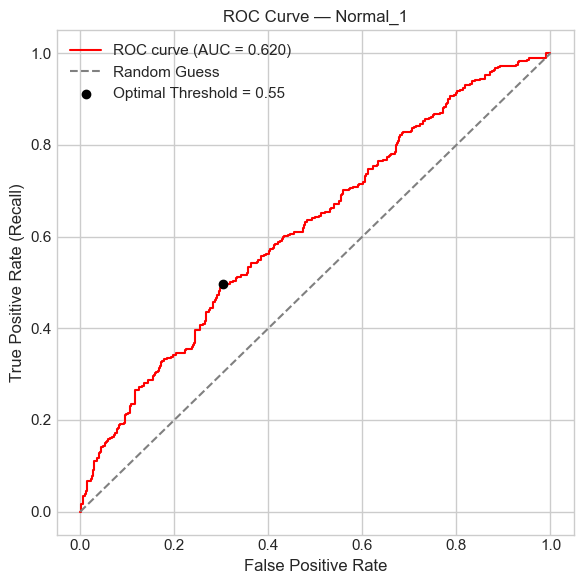

AUC Score: 0.6195
Optimal Threshold (Youden’s J): 0.5516
Plotting loss for Normal_1


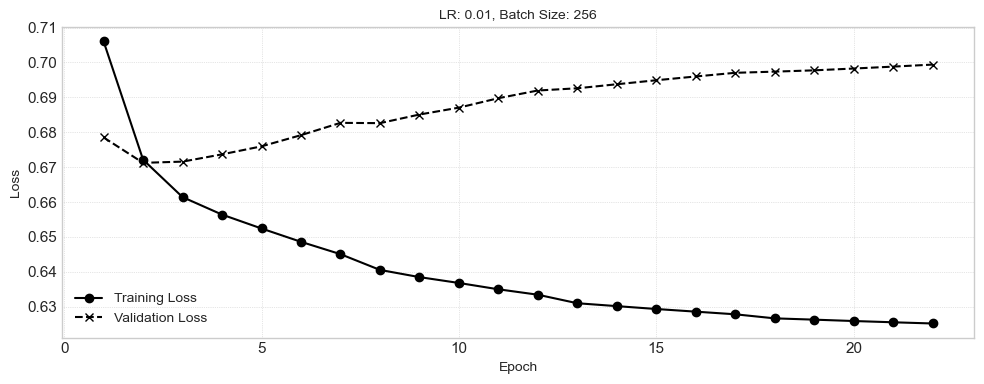


--- Training Normal_2 ---
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=16, AUC=0.6092
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=32, AUC=0.5923
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=64, AUC=0.6159
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=128, AUC=0.6030
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=256, AUC=0.6145
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
LR=0.005, Batch=16, AUC=0.5971
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 895us/step
LR=0.005, Batch=32, AUC=0.5881
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=64, AUC=0.6059
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=128, AUC=0.5776
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=256, AUC=0.6069
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 907us/step
LR=0.01, Batch=16, AUC=0.6043
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, Batch=32, AUC=0.6005
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, Batch=64, AUC=0.5914
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01,

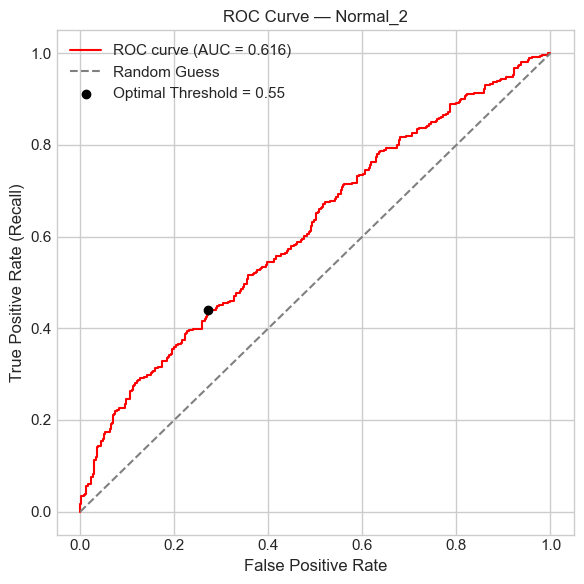

AUC Score: 0.6159
Optimal Threshold (Youden’s J): 0.5514
Plotting loss for Normal_2


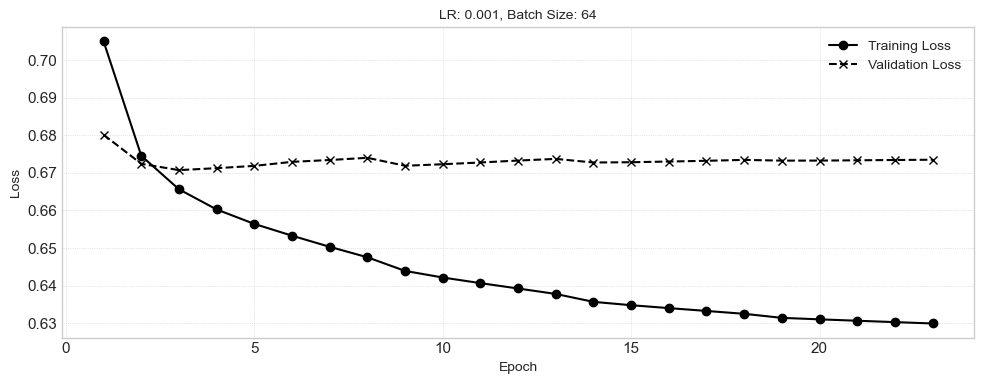


--- Training Normal_3 ---
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=16, AUC=0.5927
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=32, AUC=0.5898
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=64, AUC=0.5811
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=128, AUC=0.5883
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=256, AUC=0.5990
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=16, AUC=0.6089
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=32, AUC=0.5990
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=64, AUC=0.5975
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=128, AUC=0.6051
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=256, AUC=0.5951
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, Batch=16, AUC=0.6105
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, Batch=32, AUC=0.6051
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, Batch=64, AUC=0.6023
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, 

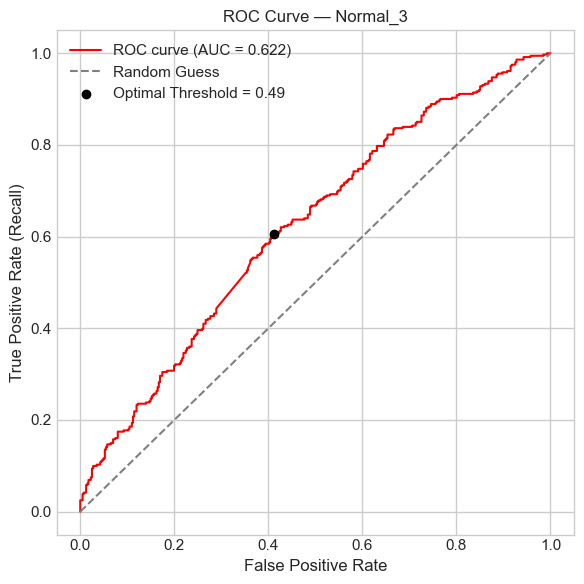

AUC Score: 0.6217
Optimal Threshold (Youden’s J): 0.4940
Plotting loss for Normal_3


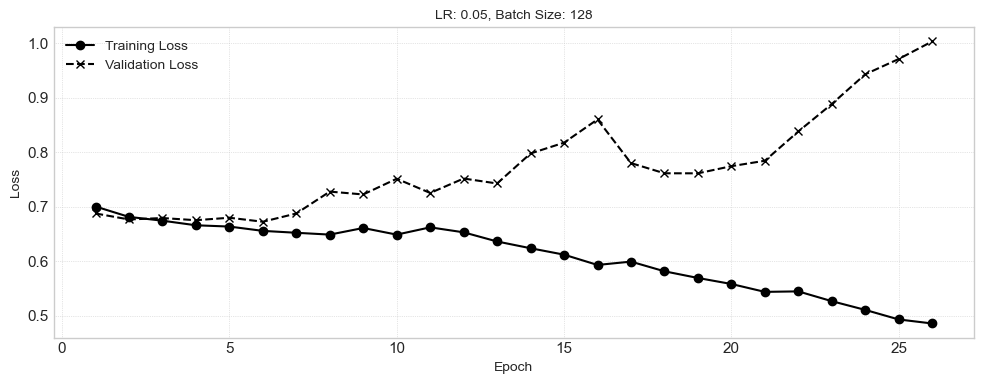


--- Training Normal_4 ---
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=16, AUC=0.6097
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=32, AUC=0.6012
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=64, AUC=0.6046
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=128, AUC=0.6026
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=256, AUC=0.5907
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=16, AUC=0.6121
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=32, AUC=0.6055
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=64, AUC=0.6083
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=128, AUC=0.6061
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=256, AUC=0.6000
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, Batch=16, AUC=0.6087
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, Batch=32, AUC=0.6075
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, Batch=64, AUC=0.6035
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, 

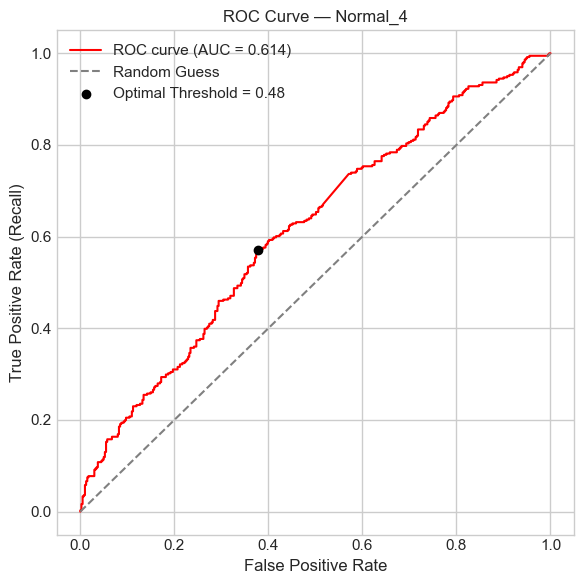

AUC Score: 0.6141
Optimal Threshold (Youden’s J): 0.4835
Plotting loss for Normal_4


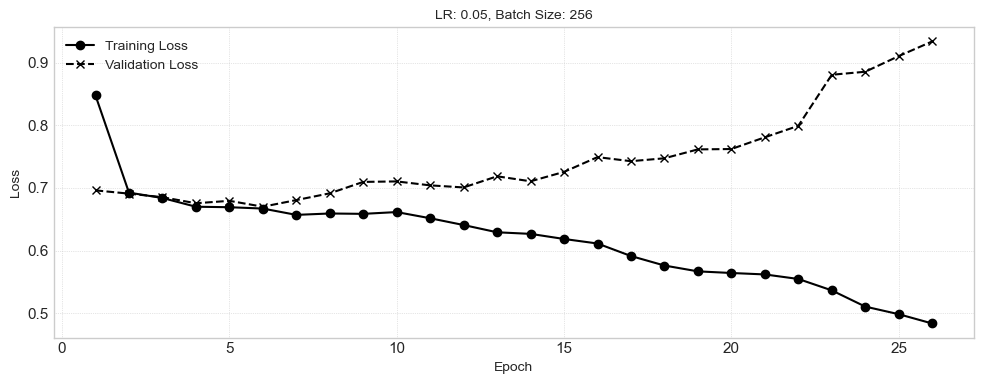


--- Training Dropout_1 ---
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 943us/step
LR=0.001, Batch=16, AUC=0.6189
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 982us/step
LR=0.001, Batch=32, AUC=0.6170
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=64, AUC=0.6085
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 969us/step
LR=0.001, Batch=128, AUC=0.5995
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=256, AUC=0.6109
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 929us/step
LR=0.005, Batch=16, AUC=0.6176
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 950us/step
LR=0.005, Batch=32, AUC=0.6078
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=64, AUC=0.6111
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=128, AUC=0.6204
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 948us/step
LR=0.005, Batch=256, AUC=0.6156
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 986us/step
LR=0.01, Batch=16, AUC=0.6167
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 935us/step
LR=0.01, Batch=32, AUC=0.6052
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, Batch=64, AUC=0.6052
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 913us/step

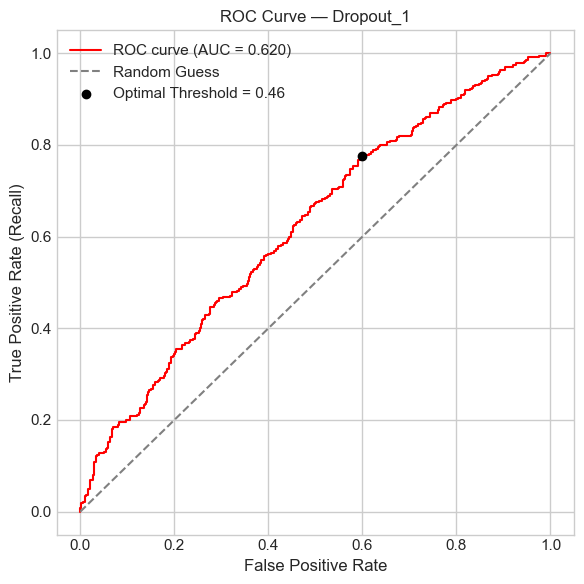

AUC Score: 0.6204
Optimal Threshold (Youden’s J): 0.4605
Plotting loss for Dropout_1


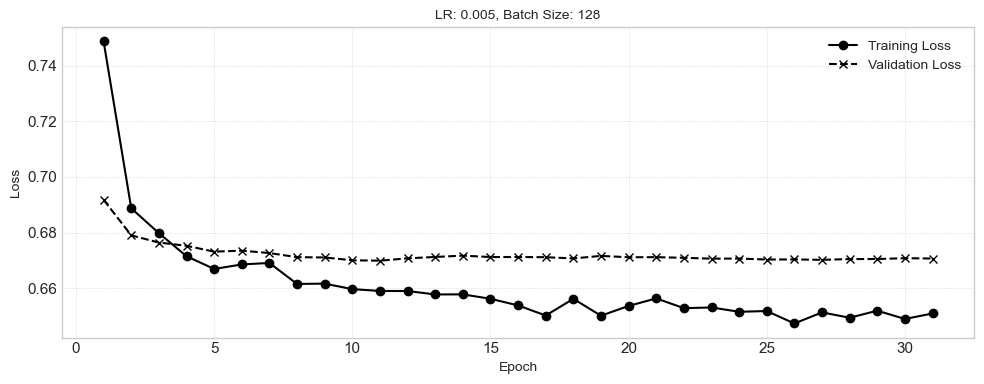


--- Training Dropout_2 ---
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=16, AUC=0.6185
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=32, AUC=0.6245
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=64, AUC=0.6209
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=128, AUC=0.6013
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=256, AUC=0.6002
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=16, AUC=0.6035
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=32, AUC=0.6196
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=64, AUC=0.6038
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=128, AUC=0.6025
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=256, AUC=0.6125
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, Batch=16, AUC=0.6147
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, Batch=32, AUC=0.6125
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, Batch=64, AUC=0.6128
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01,

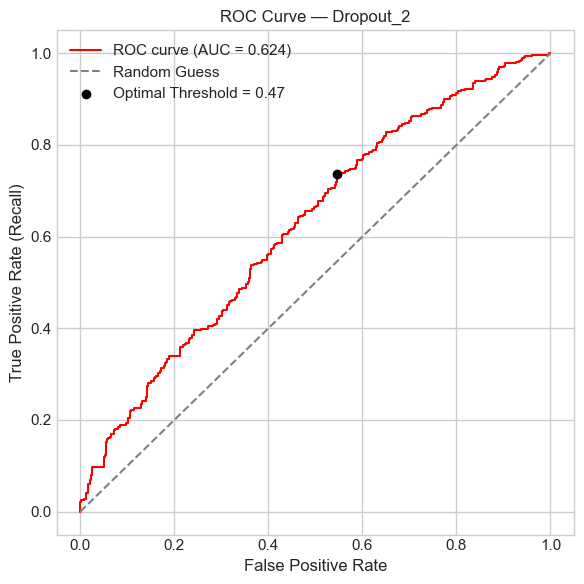

AUC Score: 0.6245
Optimal Threshold (Youden’s J): 0.4666
Plotting loss for Dropout_2


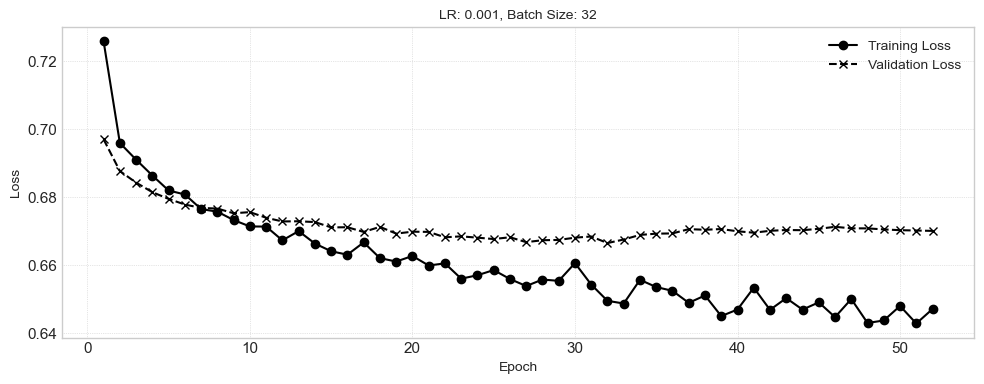


--- Training Dropout_3 ---
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=16, AUC=0.6251
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=32, AUC=0.6122
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=64, AUC=0.6128
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=128, AUC=0.6021
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=256, AUC=0.6167
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=16, AUC=0.6127
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=32, AUC=0.6102
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=64, AUC=0.6046
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=128, AUC=0.5970
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=256, AUC=0.6087
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, Batch=16, AUC=0.6085
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, Batch=32, AUC=0.6082
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, Batch=64, AUC=0.6092
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.01,

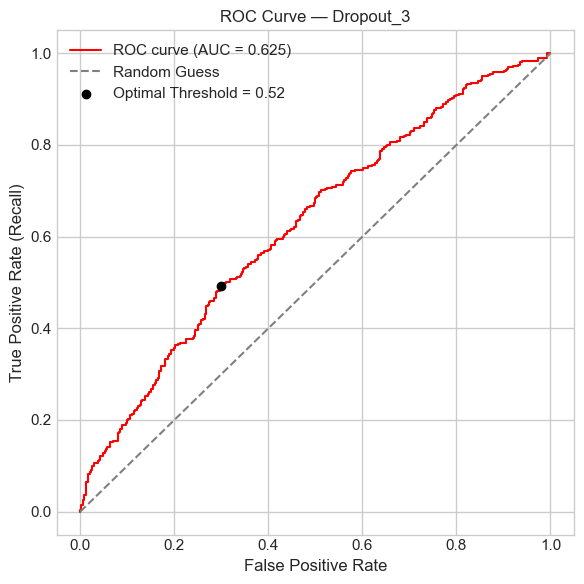

AUC Score: 0.6251
Optimal Threshold (Youden’s J): 0.5234
Plotting loss for Dropout_3


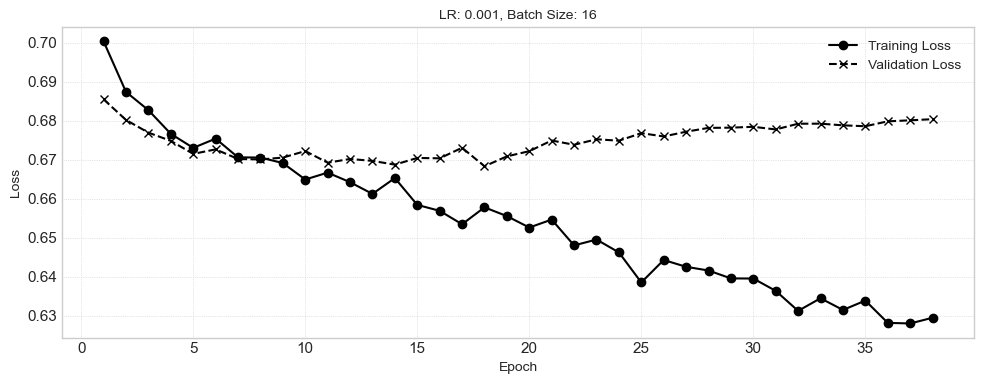


--- Training Dropout_4 ---
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=16, AUC=0.6145
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=32, AUC=0.6249
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=64, AUC=0.6099
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=128, AUC=0.6038
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=256, AUC=0.6058
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=16, AUC=0.6161
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=32, AUC=0.6107
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=64, AUC=0.6087
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=128, AUC=0.6107
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=256, AUC=0.6205
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, Batch=16, AUC=0.6184
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, Batch=32, AUC=0.6106
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, Batch=64, AUC=0.6141
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01,

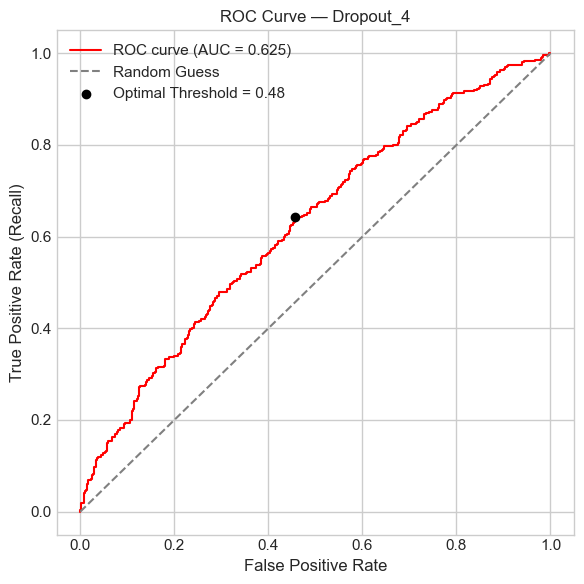

AUC Score: 0.6249
Optimal Threshold (Youden’s J): 0.4813
Plotting loss for Dropout_4


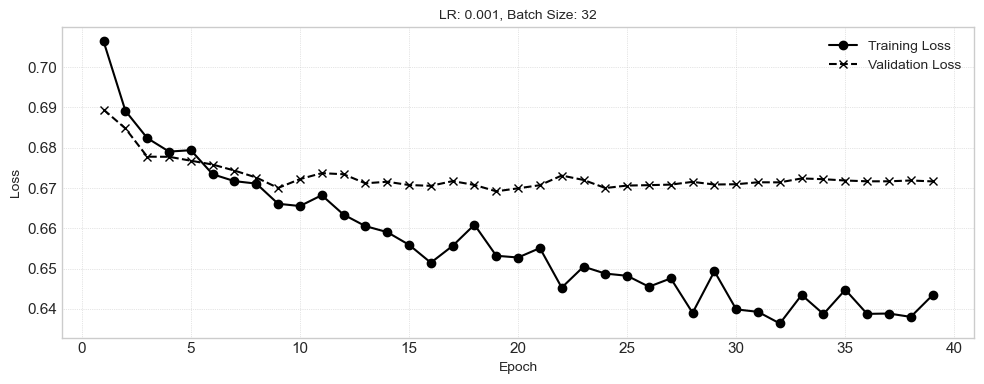

In [84]:
# Normal models
results_normal_ds3, _ = train_model_pipeline(
    model_dict=normal_model_dict,
    X_train=X_train3_scaled,
    y_train=y_train3,
    X_val=X_val3_scaled,
    y_val=y_val3,
    X_test=X_test3_scaled,
    y_test=y_test3
)

# Dropout models
results_dropout_ds3, _ = train_model_pipeline(
    model_dict=dropout_model_dict,
    X_train=X_train3_scaled,
    y_train=y_train3,
    X_val=X_val3_scaled,
    y_val=y_val3,
    X_test=X_test3_scaled,
    y_test=y_test3
)


**Evaluation**

In [85]:
# Collecting results for the normal models
sorted_normal_models_ds3, best_normal_ds3 = rank_models_by_auc(results_normal_ds3, X_test3_scaled, y_test3, label="Normal")

# Collecting results for the dropout models
sorted_dropout_models_ds3, best_dropout_ds3 = rank_models_by_auc(results_dropout_ds3, X_test3_scaled, y_test3, label="Dropout")


Normal models ranked by AUC:
Normal_3: AUC = 0.6217, Params = {'learning_rate': 0.05, 'batch_size': 128, 'val_auc': 0.6217282279066876, 'epoch': 25}, Runtime = 1.53s
Normal_1: AUC = 0.6195, Params = {'learning_rate': 0.01, 'batch_size': 256, 'val_auc': 0.6195038718991994, 'epoch': 21}, Runtime = 1.03s
Normal_2: AUC = 0.6159, Params = {'learning_rate': 0.001, 'batch_size': 64, 'val_auc': 0.6158564806819516, 'epoch': 22}, Runtime = 1.64s
Normal_4: AUC = 0.6141, Params = {'learning_rate': 0.05, 'batch_size': 256, 'val_auc': 0.6141294962040881, 'epoch': 25}, Runtime = 1.53s
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 540us/step

Best Normal Model: Normal_3
AUC: 0.6217
Best Hyperparameters: {'learning_rate': 0.05, 'batch_size': 128, 'val_auc': 0.6217282279066876, 'epoch': 25}
Model Training Time: 1.5323 seconds
Threshold used: 0.4940

AUC on Test Set: 0.7092
Classification Report:
              precision    recall  f1-score   support

           0       0.72      0.60      0.66       426
           1   

##### Dataset 4

In [ ]:
seed_value = 42
np.random.seed(seed_value)
tf.random.set_seed(seed_value)
random.seed(seed_value)

device_name = tf.test.gpu_device_name()
device = 'GPU' if device_name else 'CPU'
print(f"Using device: {device}")

Using device: CPU


**Training**


--- Training Normal_1 ---
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=16, AUC=0.7115
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=32, AUC=0.7047
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step
LR=0.001, Batch=64, AUC=0.7131
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=128, AUC=0.7034
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 979us/step
LR=0.001, Batch=256, AUC=0.7276
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=16, AUC=0.7072
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 990us/step
LR=0.005, Batch=32, AUC=0.7048
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step
LR=0.005, Batch=64, AUC=0.7253
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 986us/step
LR=0.005, Batch=128, AUC=0.7085
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 911us/step
LR=0.005, Batch=256, AUC=0.7120
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 811us/step
LR=0.01, Batch=16, AUC=0.7060
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 958us/step
LR=0.01, Batch=32, AUC=0.7016
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 930us/step
LR=0.01, Batch=64, AUC=0.7138
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step

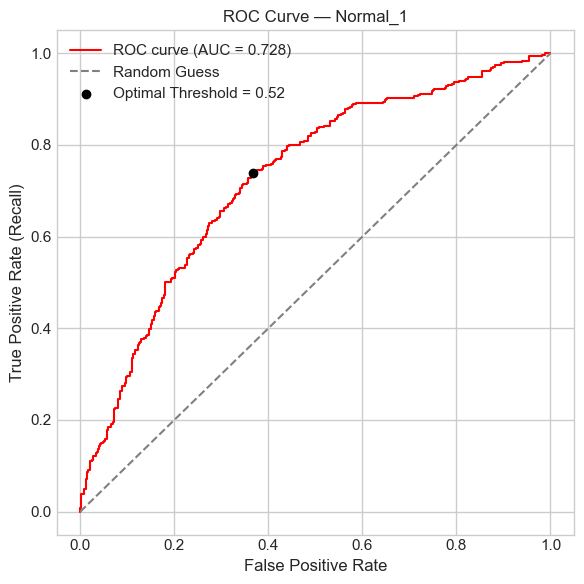

AUC Score: 0.7280
Optimal Threshold (Youden’s J): 0.5156
Plotting loss for Normal_1


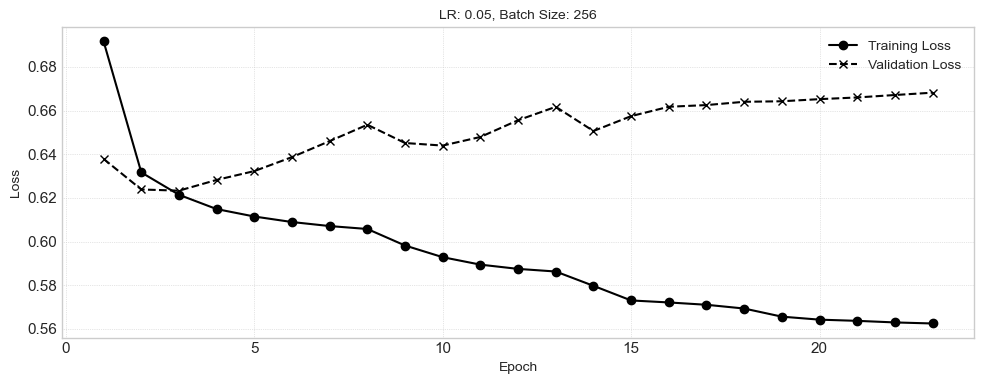


--- Training Normal_2 ---
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=16, AUC=0.7153
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step
LR=0.001, Batch=32, AUC=0.7119
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=64, AUC=0.7003
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=128, AUC=0.7028
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=256, AUC=0.7178
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=16, AUC=0.7030
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=32, AUC=0.7081
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=64, AUC=0.7114
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=128, AUC=0.7011
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 851us/step
LR=0.005, Batch=256, AUC=0.7162
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, Batch=16, AUC=0.7064
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, Batch=32, AUC=0.6958
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, Batch=64, AUC=0.6994
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 936us/step
LR=0.0

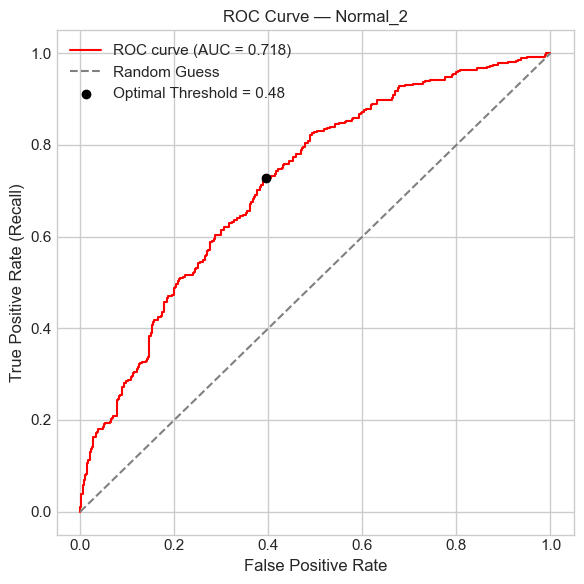

AUC Score: 0.7178
Optimal Threshold (Youden’s J): 0.4814
Plotting loss for Normal_2


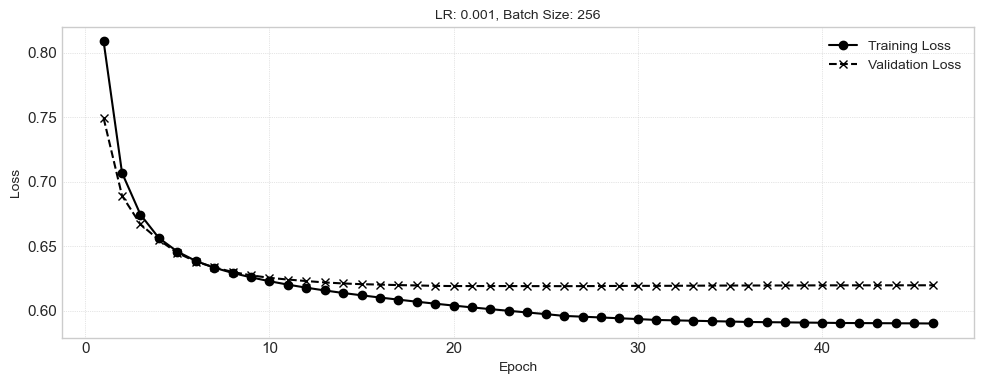


--- Training Normal_3 ---
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=16, AUC=0.7043
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=32, AUC=0.7022
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=64, AUC=0.6954
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=128, AUC=0.7141
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=256, AUC=0.7109
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=16, AUC=0.7033
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=32, AUC=0.7083
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=64, AUC=0.7082
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=128, AUC=0.7049
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=256, AUC=0.7141
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 986us/step
LR=0.01, Batch=16, AUC=0.7097
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, Batch=32, AUC=0.7025
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, Batch=64, AUC=0.6952
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01,

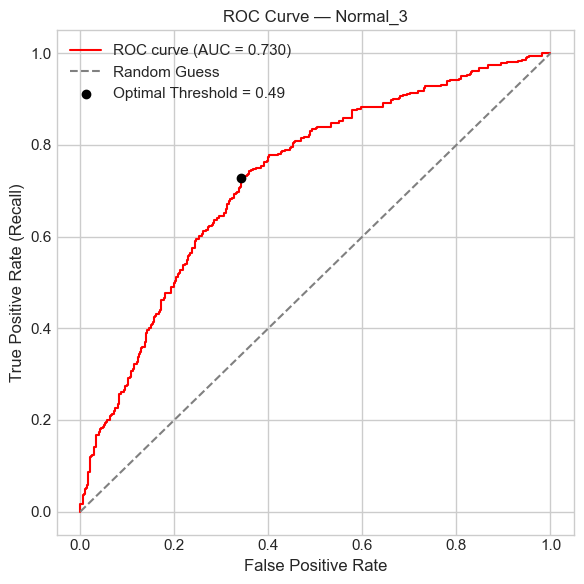

AUC Score: 0.7295
Optimal Threshold (Youden’s J): 0.4925
Plotting loss for Normal_3


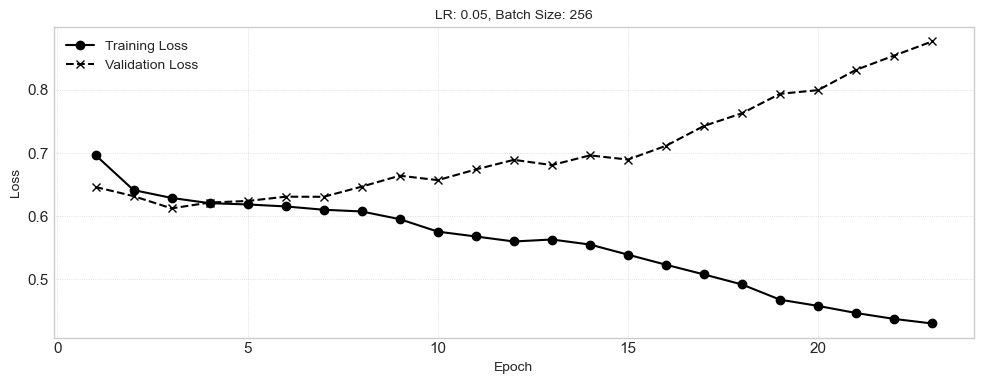


--- Training Normal_4 ---
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=16, AUC=0.7098
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=32, AUC=0.7091
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=64, AUC=0.7082
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=128, AUC=0.7139
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=256, AUC=0.7130
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=16, AUC=0.6993
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=32, AUC=0.7049
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=64, AUC=0.7065
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=128, AUC=0.7090
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=256, AUC=0.7149
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, Batch=16, AUC=0.7065
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, Batch=32, AUC=0.7026
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, Batch=64, AUC=0.7057
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, 

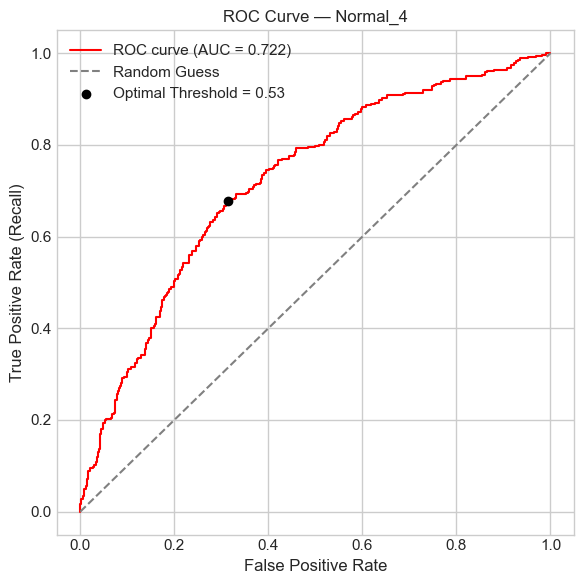

AUC Score: 0.7224
Optimal Threshold (Youden’s J): 0.5348
Plotting loss for Normal_4


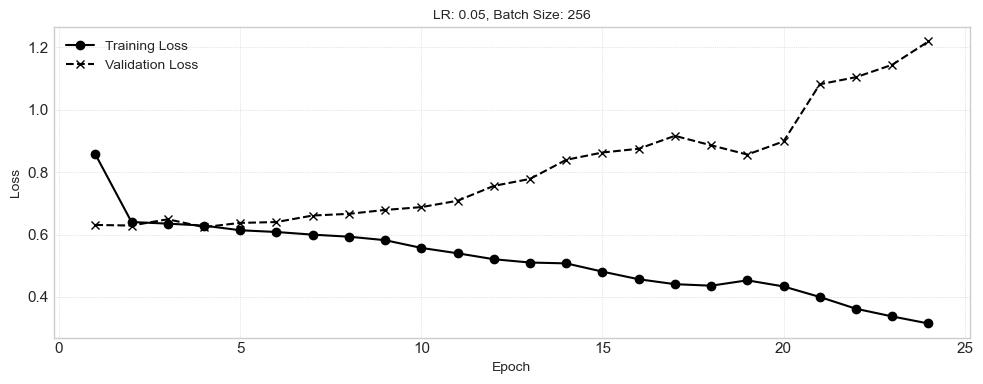


--- Training Dropout_1 ---
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 909us/step
LR=0.001, Batch=16, AUC=0.7217
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 924us/step
LR=0.001, Batch=32, AUC=0.7211
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 920us/step
LR=0.001, Batch=64, AUC=0.7140
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 962us/step
LR=0.001, Batch=128, AUC=0.7178
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 908us/step
LR=0.001, Batch=256, AUC=0.7112
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 931us/step
LR=0.005, Batch=16, AUC=0.7227
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 944us/step
LR=0.005, Batch=32, AUC=0.7160
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 937us/step
LR=0.005, Batch=64, AUC=0.7238
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 945us/step
LR=0.005, Batch=128, AUC=0.7172
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 913us/step
LR=0.005, Batch=256, AUC=0.7196
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 937us/step
LR=0.01, Batch=16, AUC=0.7106
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 918us/step
LR=0.01, Batch=32, AUC=0.7178
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 947us/step
LR=0.01, Batch=64, AUC=0.7101
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 948us

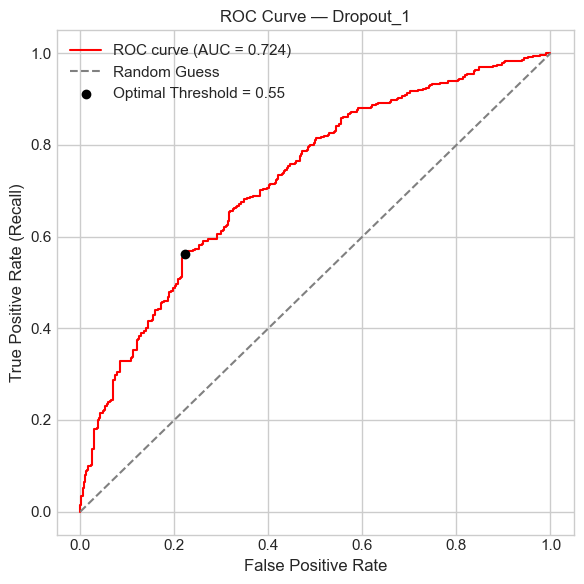

AUC Score: 0.7238
Optimal Threshold (Youden’s J): 0.5533
Plotting loss for Dropout_1


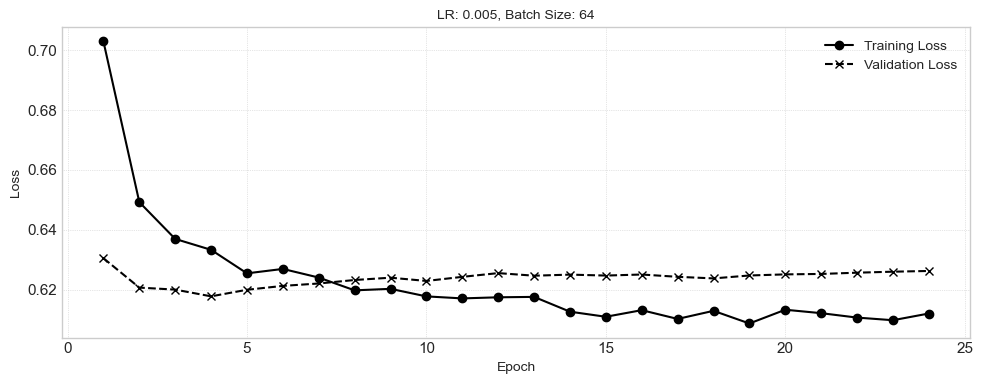


--- Training Dropout_2 ---
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=16, AUC=0.7262
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=32, AUC=0.7187
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=64, AUC=0.7249
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=128, AUC=0.7148
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step
LR=0.001, Batch=256, AUC=0.7128
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=16, AUC=0.7218
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=32, AUC=0.7218
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=64, AUC=0.7164
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=128, AUC=0.7191
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1000us/step
LR=0.005, Batch=256, AUC=0.7109
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, Batch=16, AUC=0.7134
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, Batch=32, AUC=0.7142
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, Batch=64, AUC=0.7166
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.

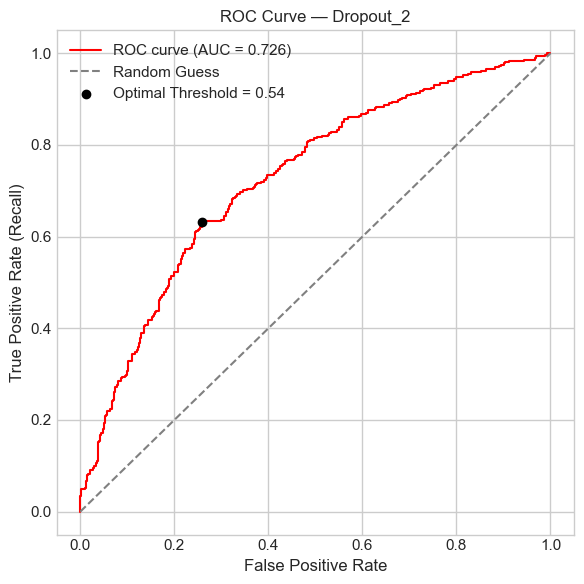

AUC Score: 0.7262
Optimal Threshold (Youden’s J): 0.5356
Plotting loss for Dropout_2


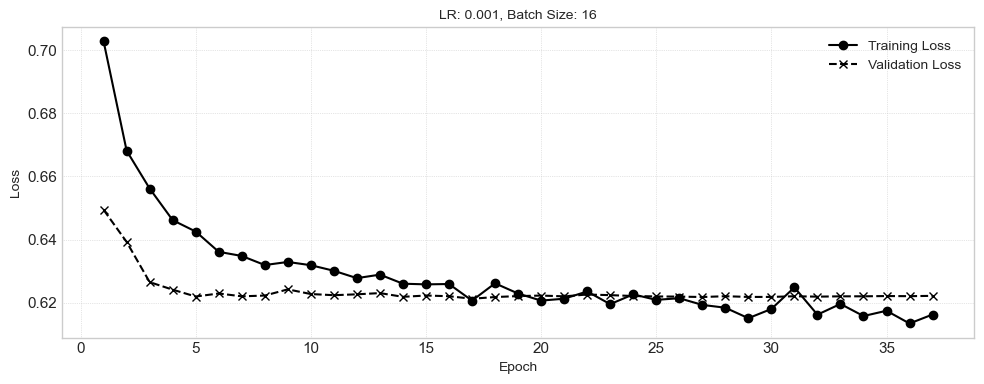


--- Training Dropout_3 ---
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=16, AUC=0.7269
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=32, AUC=0.7080
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=64, AUC=0.7097
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=128, AUC=0.7115
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=256, AUC=0.7142
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=16, AUC=0.7179
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=32, AUC=0.7181
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=64, AUC=0.7121
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=128, AUC=0.7159
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=256, AUC=0.7183
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, Batch=16, AUC=0.7133
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, Batch=32, AUC=0.7224
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, Batch=64, AUC=0.7210
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01,

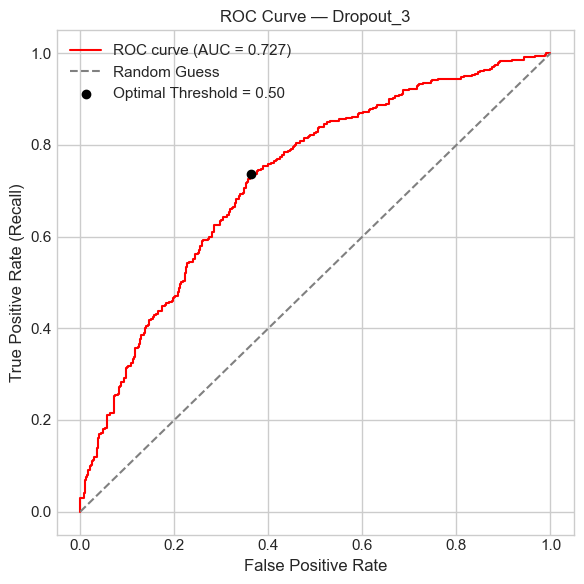

AUC Score: 0.7269
Optimal Threshold (Youden’s J): 0.5045
Plotting loss for Dropout_3


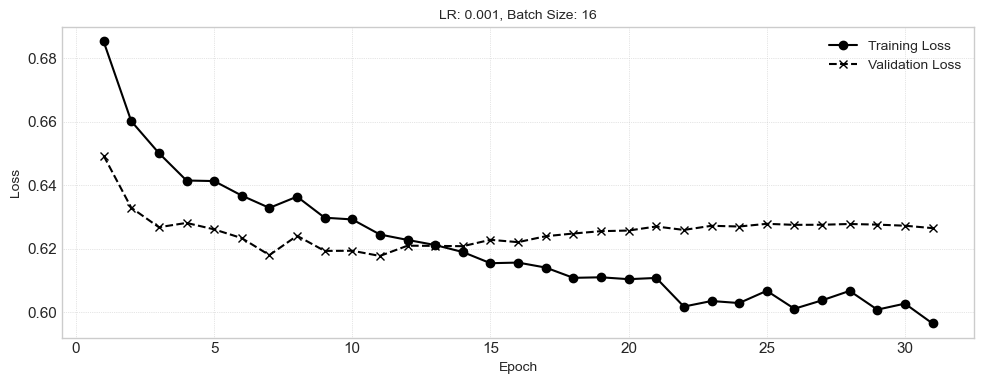


--- Training Dropout_4 ---
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=16, AUC=0.7192
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=32, AUC=0.7163
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=64, AUC=0.7140
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=128, AUC=0.7173
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=256, AUC=0.7125
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=16, AUC=0.7222
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=32, AUC=0.7162
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=64, AUC=0.7091
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=128, AUC=0.7189
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=256, AUC=0.7114
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.01, Batch=16, AUC=0.7061
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, Batch=32, AUC=0.7132
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, Batch=64, AUC=0.7266
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01,

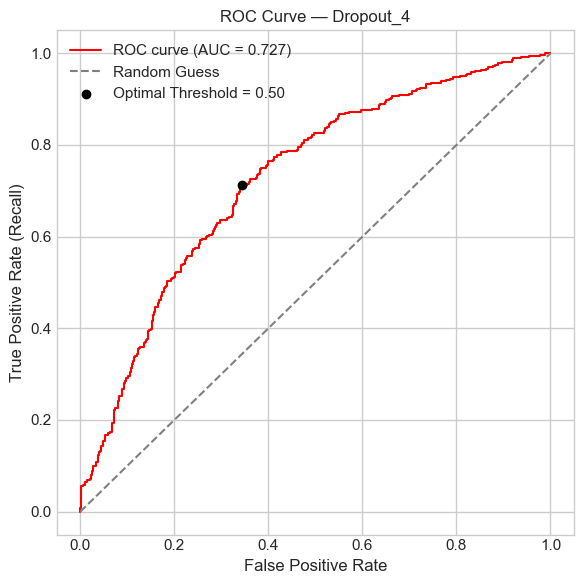

AUC Score: 0.7266
Optimal Threshold (Youden’s J): 0.5033
Plotting loss for Dropout_4


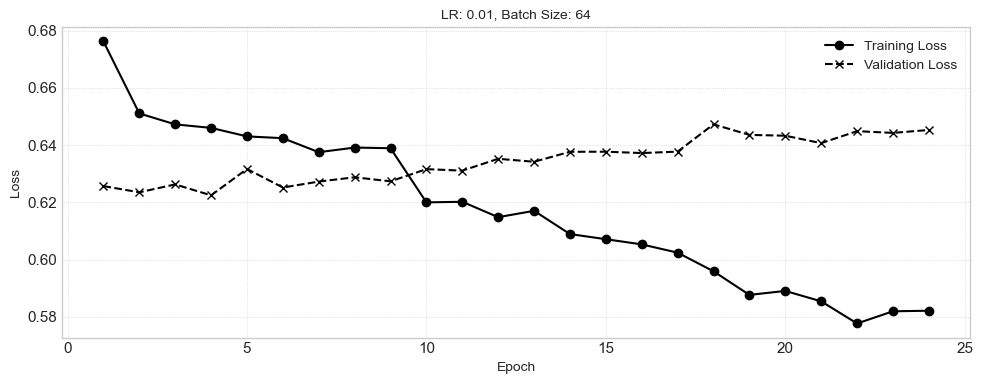

In [87]:
# Normal models
results_normal_ds4, _ = train_model_pipeline(
    model_dict=normal_model_dict,
    X_train=X_train4_scaled,
    y_train=y_train4,
    X_val=X_val4_scaled,
    y_val=y_val4,
    X_test=X_test4_scaled,
    y_test=y_test4
)

# Dropout models
results_dropout_ds4, _ = train_model_pipeline(
    model_dict=dropout_model_dict,
    X_train=X_train4_scaled,
    y_train=y_train4,
    X_val=X_val4_scaled,
    y_val=y_val4,
    X_test=X_test4_scaled,
    y_test=y_test4
)


**Evaluation**

In [88]:
# Collecting results for the normal models
sorted_normal_models_ds4, best_normal_ds4 = rank_models_by_auc(results_normal_ds4, X_test4_scaled, y_test4, label="Normal")

# Collecting results for the dropout models
sorted_dropout_models_ds4, best_dropout_ds4 = rank_models_by_auc(results_dropout_ds4, X_test4_scaled, y_test4, label="Dropout")


Normal models ranked by AUC:
Normal_3: AUC = 0.7295, Params = {'learning_rate': 0.05, 'batch_size': 256, 'val_auc': 0.7295058752011937, 'epoch': 22}, Runtime = 1.41s
Normal_1: AUC = 0.7280, Params = {'learning_rate': 0.05, 'batch_size': 256, 'val_auc': 0.7279792209227623, 'epoch': 22}, Runtime = 1.07s
Normal_4: AUC = 0.7224, Params = {'learning_rate': 0.05, 'batch_size': 256, 'val_auc': 0.7224252388419533, 'epoch': 23}, Runtime = 1.45s
Normal_2: AUC = 0.7178, Params = {'learning_rate': 0.001, 'batch_size': 256, 'val_auc': 0.7178314601308363, 'epoch': 45}, Runtime = 1.92s
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 546us/step

Best Normal Model: Normal_3
AUC: 0.7295
Best Hyperparameters: {'learning_rate': 0.05, 'batch_size': 256, 'val_auc': 0.7295058752011937, 'epoch': 22}
Model Training Time: 1.4124 seconds
Threshold used: 0.4925

AUC on Test Set: 0.7594
Classification Report:
              precision    recall  f1-score   support

           0       0.74      0.70      0.72       426
           1  

#### LeakyReLu Activation

##### Architecture

In [89]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Input, LeakyReLU, BatchNormalization
from tensorflow.keras.regularizers import l2

def model_normal_1_leaky(input_dim):
    model = Sequential([
        Input(shape=(input_dim,)),
        Dense(16, kernel_regularizer=l2(0.0001)),
        BatchNormalization(),
        LeakyReLU(negative_slope=0.1),
        Dense(1, activation='sigmoid')
    ])
    return model

def model_normal_2_leaky(input_dim):
    model = Sequential([
        Input(shape=(input_dim,)),
        Dense(32, kernel_regularizer=l2(0.0001)),
        BatchNormalization(),
        LeakyReLU(negative_slope=0.1),
        Dense(16, kernel_regularizer=l2(0.0001)),
        BatchNormalization(),
        LeakyReLU(negative_slope=0.1),
        Dense(1, activation='sigmoid')
    ])
    return model

def model_normal_3_leaky(input_dim):
    model = Sequential([
        Input(shape=(input_dim,)),
        Dense(64, kernel_regularizer=l2(0.0001)),
        BatchNormalization(),
        LeakyReLU(negative_slope=0.1),
        Dense(32, kernel_regularizer=l2(0.0001)),
        BatchNormalization(),
        LeakyReLU(negative_slope=0.1),
        Dense(16, kernel_regularizer=l2(0.0001)),
        BatchNormalization(),
        LeakyReLU(negative_slope=0.1),
        Dense(1, activation='sigmoid')
    ])
    return model

def model_normal_4_leaky(input_dim):
    model = Sequential([
        Input(shape=(input_dim,)),
        Dense(128, kernel_regularizer=l2(0.0001)),
        BatchNormalization(),
        LeakyReLU(negative_slope=0.1),
        Dense(64, kernel_regularizer=l2(0.0001)),
        BatchNormalization(),
        LeakyReLU(negative_slope=0.1),
        Dense(32, kernel_regularizer=l2(0.0001)),
        BatchNormalization(),
        LeakyReLU(negative_slope=0.1),
        Dense(16, kernel_regularizer=l2(0.0001)),
        BatchNormalization(),
        LeakyReLU(negative_slope=0.1),
        Dense(1, activation='sigmoid')
    ])
    return model

def model_dropout_1_leaky(input_dim):
    model = Sequential([
        Input(shape=(input_dim,)),
        Dense(16, kernel_regularizer=l2(0.0001)),
        BatchNormalization(),
        LeakyReLU(negative_slope=0.1),
        Dropout(0.3),
        Dense(1, activation='sigmoid')
    ])
    return model

def model_dropout_2_leaky(input_dim):
    model = Sequential([
        Input(shape=(input_dim,)),
        Dense(32, kernel_regularizer=l2(0.0001)),
        BatchNormalization(),
        LeakyReLU(negative_slope=0.1),
        Dropout(0.3),
        Dense(16, kernel_regularizer=l2(0.0001)),
        BatchNormalization(),
        LeakyReLU(negative_slope=0.1),
        Dropout(0.3),
        Dense(1, activation='sigmoid')
    ])
    return model

def model_dropout_3_leaky(input_dim):
    model = Sequential([
        Input(shape=(input_dim,)),
        Dense(64, kernel_regularizer=l2(0.0001)),
        BatchNormalization(),
        LeakyReLU(negative_slope=0.1),
        Dropout(0.3),
        Dense(32, kernel_regularizer=l2(0.0001)),
        BatchNormalization(),
        LeakyReLU(negative_slope=0.1),
        Dropout(0.3),
        Dense(16, kernel_regularizer=l2(0.0001)),
        BatchNormalization(),
        LeakyReLU(negative_slope=0.1),
        Dropout(0.3),
        Dense(1, activation='sigmoid')
    ])
    return model

def model_dropout_4_leaky(input_dim):
    model = Sequential([
        Input(shape=(input_dim,)),
        Dense(128, kernel_regularizer=l2(0.0001)),
        BatchNormalization(),
        LeakyReLU(negative_slope=0.1),
        Dropout(0.3),
        Dense(64, kernel_regularizer=l2(0.0001)),
        BatchNormalization(),
        LeakyReLU(negative_slope=0.1),
        Dropout(0.3),
        Dense(32, kernel_regularizer=l2(0.0001)),
        BatchNormalization(),
        LeakyReLU(negative_slope=0.1),
        Dropout(0.3),
        Dense(16, kernel_regularizer=l2(0.0001)),
        BatchNormalization(),
        LeakyReLU(negative_slope=0.1),
        Dropout(0.3),
        Dense(1, activation='sigmoid')
    ])
    return model


In [90]:
# Store all normal models in a dictionary
leaky_normal_model_dict = {
    "Normal_1_leaky": model_normal_1_leaky,
    "Normal_2_leaky": model_normal_2_leaky,
    "Normal_3_leaky": model_normal_3_leaky,
    "Normal_4_leaky": model_normal_4_leaky
}

leaky_dropout_model_dict = {
    "Dropout_1_leaky": model_dropout_1_leaky,
    "Dropout_2_leaky": model_dropout_2_leaky,
    "Dropout_3_leaky": model_dropout_3_leaky,
    "Dropout_4_leaky": model_dropout_4_leaky
}

In [ ]:
seed_value = 42
np.random.seed(seed_value)
tf.random.set_seed(seed_value)
random.seed(seed_value)

device_name = tf.test.gpu_device_name()
device = 'GPU' if device_name else 'CPU'
print(f"Using device: {device}")

Using device: CPU


##### Dataset 1

In [ ]:
seed_value = 42
np.random.seed(seed_value)
tf.random.set_seed(seed_value)
random.seed(seed_value)

device_name = tf.test.gpu_device_name()
device = 'GPU' if device_name else 'CPU'
print(f"Using device: {device}")


Using device: CPU


**Training**


--- Training Normal_1_leaky ---
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=16, AUC=0.5835
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=32, AUC=0.6055
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=64, AUC=0.6216
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=128, AUC=0.5846
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=256, AUC=0.5964
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=16, AUC=0.6010
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=32, AUC=0.6017
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=64, AUC=0.6013
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=128, AUC=0.6109
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=256, AUC=0.6034
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, Batch=16, AUC=0.6144
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, Batch=32, AUC=0.6162
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, Batch=64, AUC=0.5993
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=

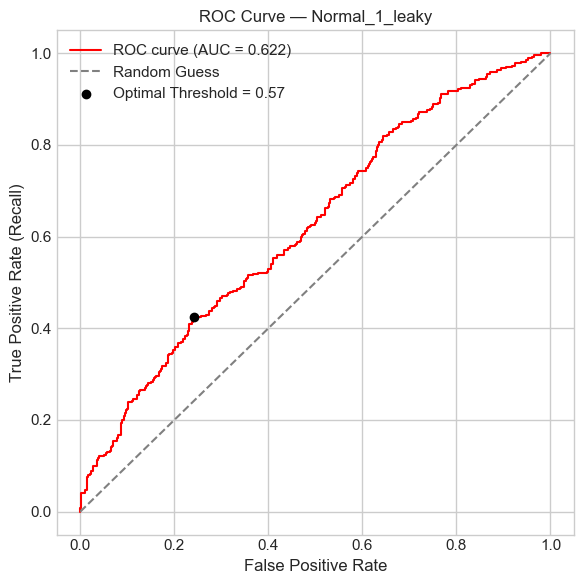

AUC Score: 0.6216
Optimal Threshold (Youden’s J): 0.5702
Plotting loss for Normal_1_leaky


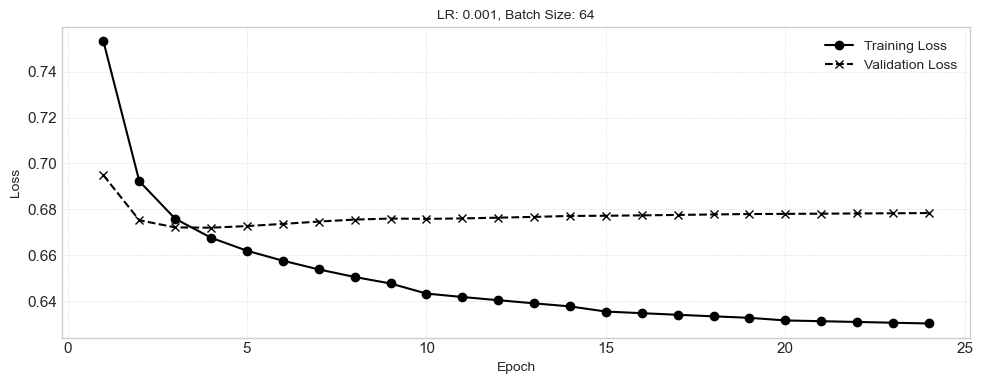


--- Training Normal_2_leaky ---
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=16, AUC=0.5855
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=32, AUC=0.5880
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=64, AUC=0.5948
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=128, AUC=0.5484
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=256, AUC=0.5854
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=16, AUC=0.6102
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=32, AUC=0.6046
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=64, AUC=0.5935
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=128, AUC=0.5793
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=256, AUC=0.5948
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.01, Batch=16, AUC=0.6027
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.01, Batch=32, AUC=0.6109
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, Batch=64, AUC=0.6034
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=

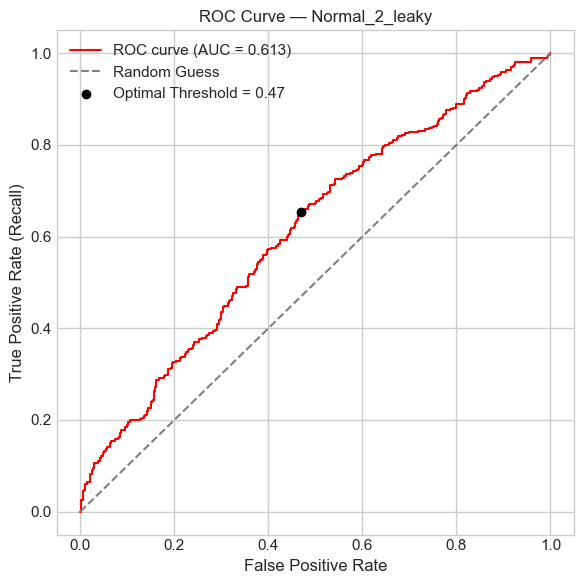

AUC Score: 0.6127
Optimal Threshold (Youden’s J): 0.4705
Plotting loss for Normal_2_leaky


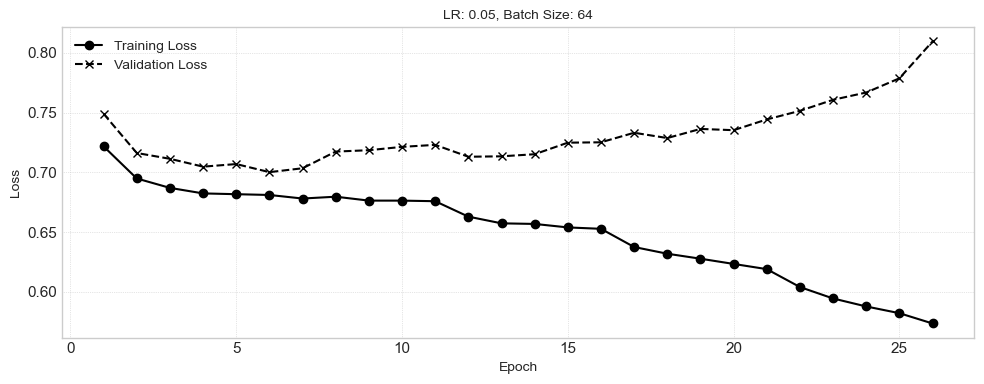


--- Training Normal_3_leaky ---
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=16, AUC=0.5679
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=32, AUC=0.5696
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=64, AUC=0.5923
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=128, AUC=0.6041
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=256, AUC=0.5908
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=16, AUC=0.5910
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=32, AUC=0.5838
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=64, AUC=0.5815
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=128, AUC=0.6102
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=256, AUC=0.5621
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.01, Batch=16, AUC=0.5897
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.01, Batch=32, AUC=0.5971
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.01, Batch=64, AUC=0.5839
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=

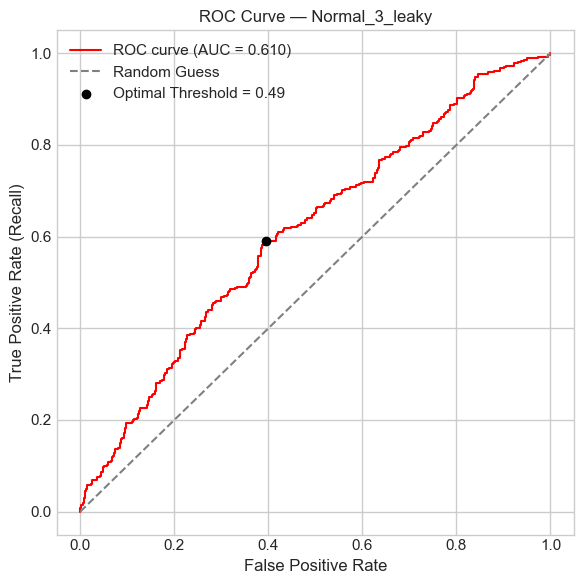

AUC Score: 0.6102
Optimal Threshold (Youden’s J): 0.4923
Plotting loss for Normal_3_leaky


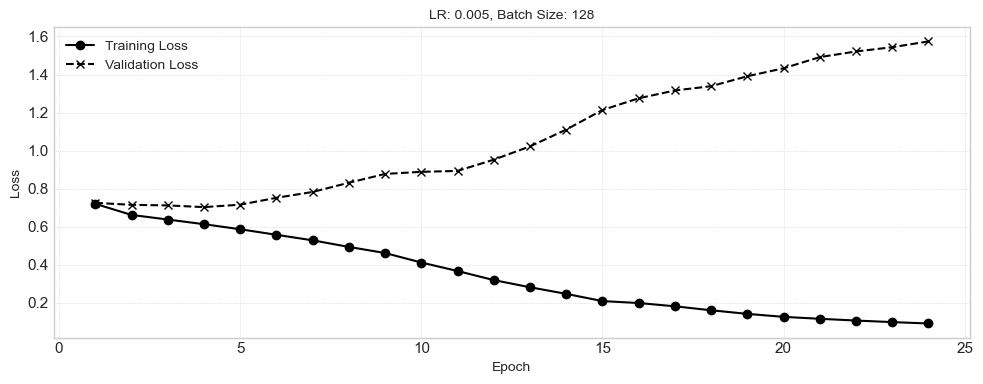


--- Training Normal_4_leaky ---
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=16, AUC=0.5648
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=32, AUC=0.5961
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=64, AUC=0.5812
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=128, AUC=0.5937
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=256, AUC=0.5921
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=16, AUC=0.6041
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
LR=0.005, Batch=32, AUC=0.6024
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
LR=0.005, Batch=64, AUC=0.5950
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=128, AUC=0.5770
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=256, AUC=0.5921
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.01, Batch=16, AUC=0.6032
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.01, Batch=32, AUC=0.6095
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.01, Batch=64, AUC=0.5822
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.

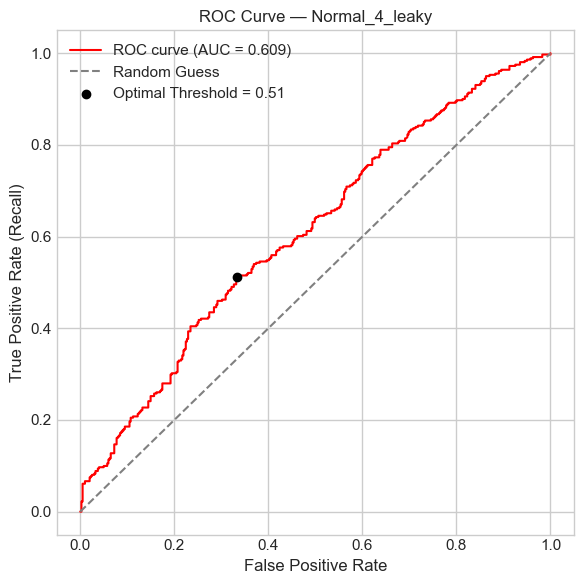

AUC Score: 0.6095
Optimal Threshold (Youden’s J): 0.5122
Plotting loss for Normal_4_leaky


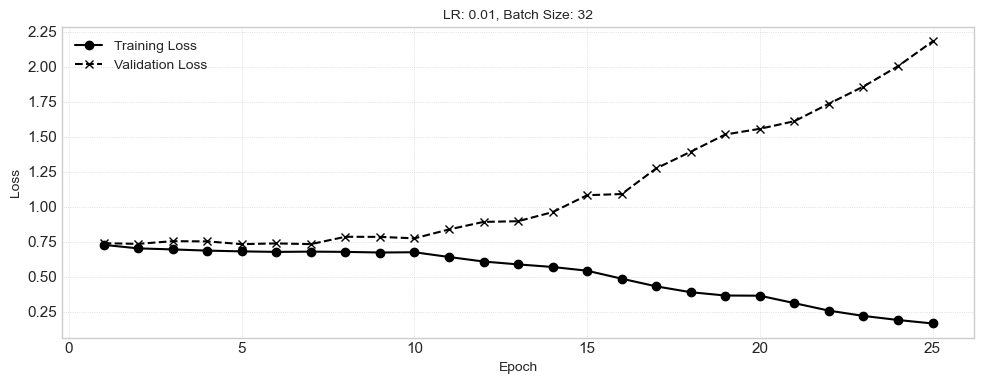


--- Training Dropout_1_leaky ---
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=16, AUC=0.6119
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=32, AUC=0.6110
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=64, AUC=0.6010
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=128, AUC=0.6045
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=256, AUC=0.6080
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=16, AUC=0.6094
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=32, AUC=0.6100
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=64, AUC=0.6073
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=128, AUC=0.6057
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=256, AUC=0.6070
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, Batch=16, AUC=0.6064
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, Batch=32, AUC=0.6132
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, Batch=64, AUC=0.6178
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR

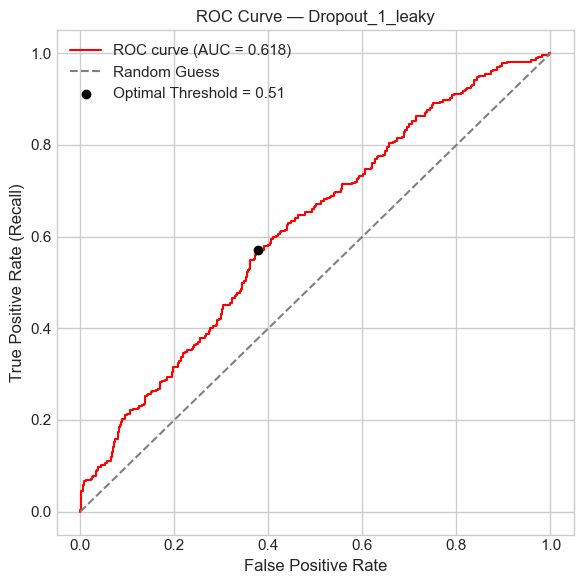

AUC Score: 0.6178
Optimal Threshold (Youden’s J): 0.5131
Plotting loss for Dropout_1_leaky


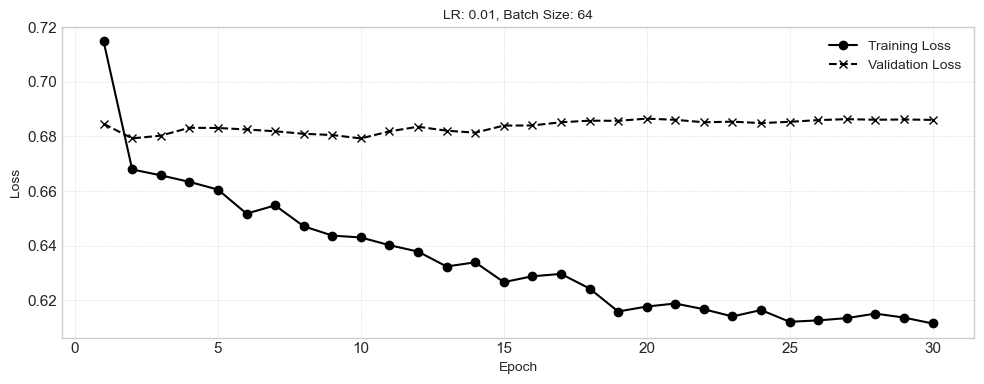


--- Training Dropout_2_leaky ---
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=16, AUC=0.6011
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=32, AUC=0.6168
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=64, AUC=0.6071
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=128, AUC=0.6076
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=256, AUC=0.5986
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=16, AUC=0.6112
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=32, AUC=0.6155
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=64, AUC=0.5930
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=128, AUC=0.6118
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=256, AUC=0.5846
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.01, Batch=16, AUC=0.6041
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.01, Batch=32, AUC=0.6083
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.01, Batch=64, AUC=0.6110
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR

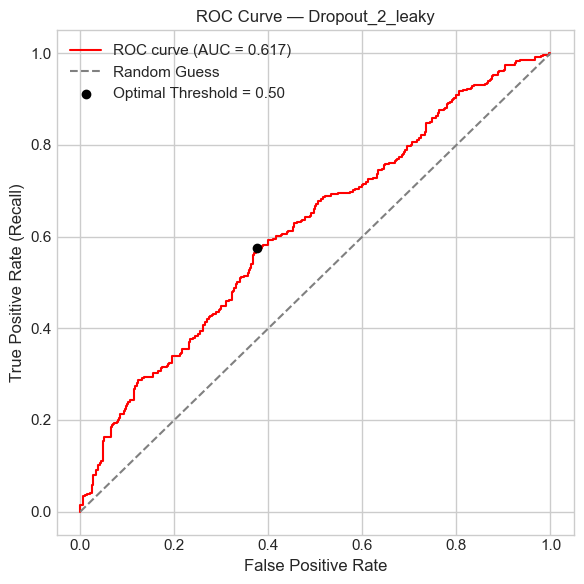

AUC Score: 0.6168
Optimal Threshold (Youden’s J): 0.5043
Plotting loss for Dropout_2_leaky


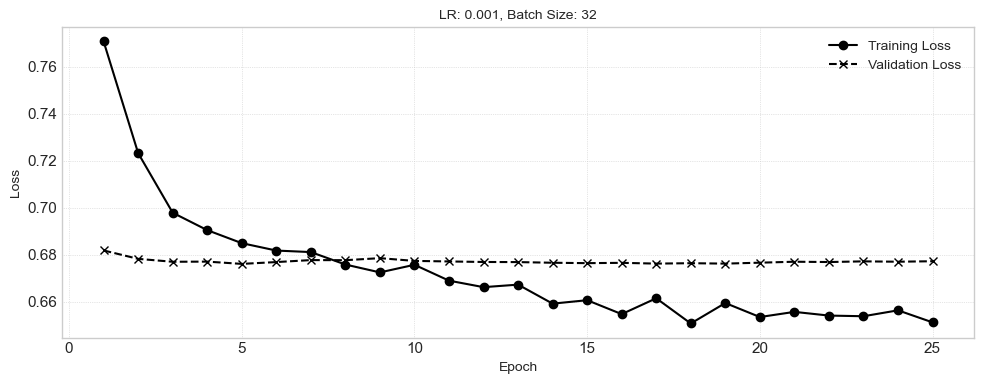


--- Training Dropout_3_leaky ---
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=16, AUC=0.6180
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=32, AUC=0.6039
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=64, AUC=0.6139
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=128, AUC=0.6036
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=256, AUC=0.5979
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=16, AUC=0.6018
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=32, AUC=0.5980
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=64, AUC=0.6019
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=128, AUC=0.5995
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=256, AUC=0.6105
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.01, Batch=16, AUC=0.6119
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.01, Batch=32, AUC=0.6047
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.01, Batch=64, AUC=0.6083
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR

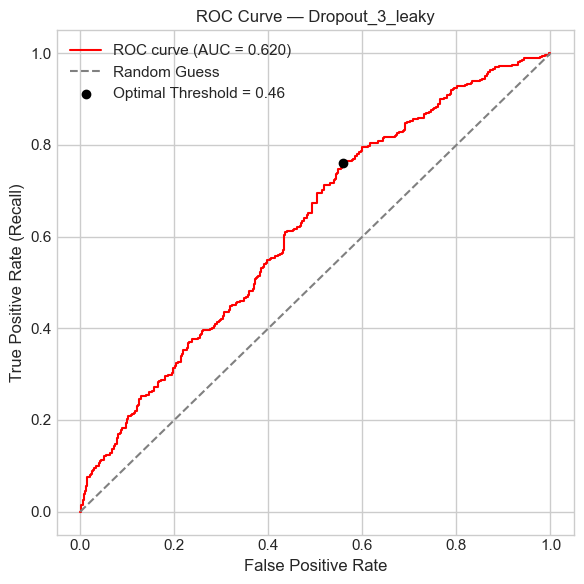

AUC Score: 0.6201
Optimal Threshold (Youden’s J): 0.4610
Plotting loss for Dropout_3_leaky


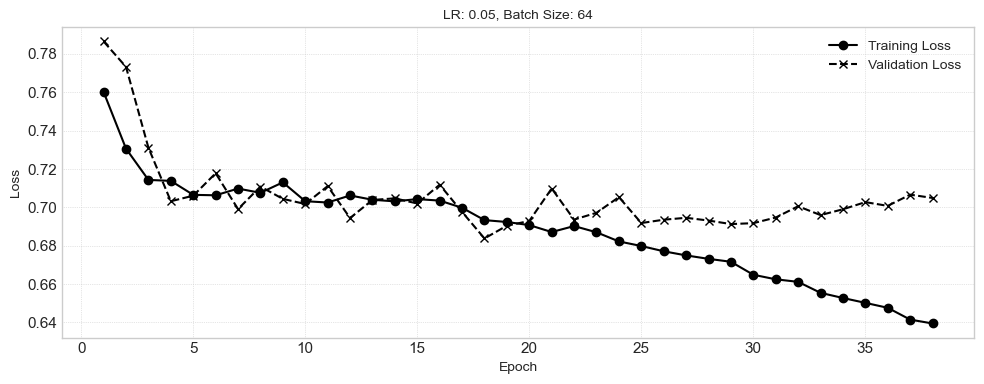


--- Training Dropout_4_leaky ---
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=16, AUC=0.6186
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=32, AUC=0.5953
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=64, AUC=0.5944
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=128, AUC=0.6131
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=256, AUC=0.5990
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=16, AUC=0.6058
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
LR=0.005, Batch=32, AUC=0.6069
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
LR=0.005, Batch=64, AUC=0.5937
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=128, AUC=0.6208
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=256, AUC=0.5987
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.01, Batch=16, AUC=0.6028
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.01, Batch=32, AUC=0.6040
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.01, Batch=64, AUC=0.6134
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0

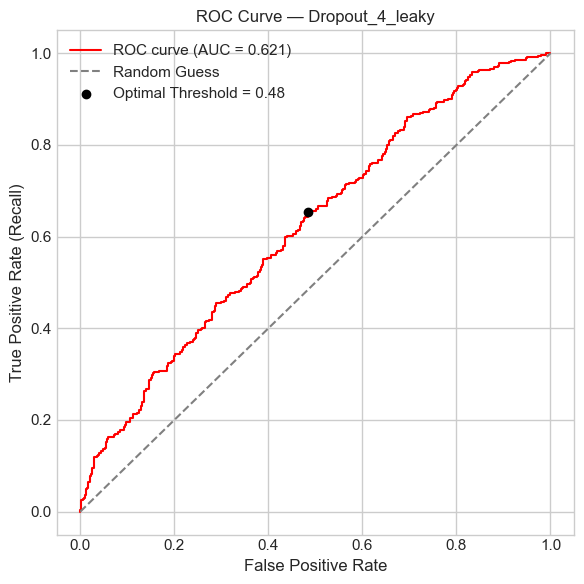

AUC Score: 0.6208
Optimal Threshold (Youden’s J): 0.4767
Plotting loss for Dropout_4_leaky


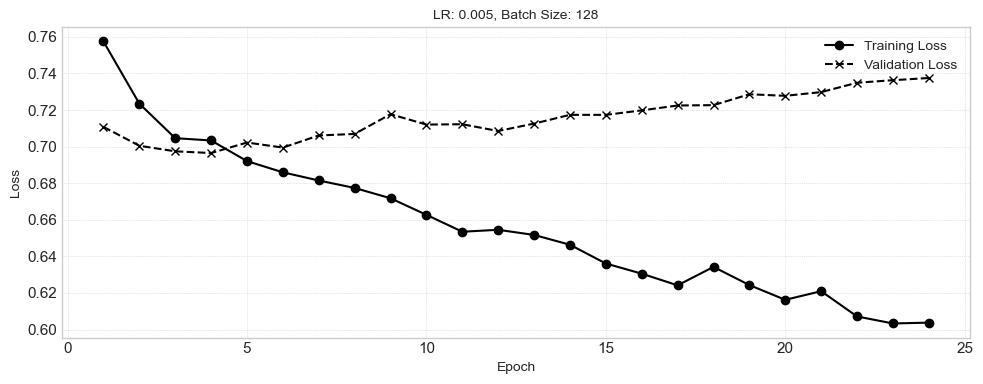

In [93]:
# Normal models
results_normal_leaky_ds1, _ = train_model_pipeline(
    model_dict=leaky_normal_model_dict,
    X_train=X_train1_scaled,
    y_train=y_train1,
    X_val=X_val1_scaled,
    y_val=y_val1,
    X_test=X_test1_scaled,
    y_test=y_test1
)

# Dropout models
results_dropout_leaky_ds1, _ = train_model_pipeline(
    model_dict=leaky_dropout_model_dict,
    X_train=X_train1_scaled,
    y_train=y_train1,
    X_val=X_val1_scaled,
    y_val=y_val1,
    X_test=X_test1_scaled,
    y_test=y_test1
)


**Evaluation**

In [94]:
# Collecting results for the normal models
sorted_normal_models_leaky_ds1, best_normal_leaky_ds1 = rank_models_by_auc(results_normal_leaky_ds1, X_test1_scaled, y_test1, label="Normal (LeakyReLu)")

# Collecting results for the dropout models
sorted_dropout_models_leaky_ds1, best_dropout_leaky_ds1 = rank_models_by_auc(results_dropout_leaky_ds1, X_test1_scaled, y_test1, label="Dropout (LeakyReLu)")


Normal (LeakyReLu) models ranked by AUC:
Normal_1_leaky: AUC = 0.6216, Params = {'learning_rate': 0.001, 'batch_size': 64, 'val_auc': 0.6215624373968127, 'epoch': 23}, Runtime = 1.81s
Normal_2_leaky: AUC = 0.6127, Params = {'learning_rate': 0.05, 'batch_size': 64, 'val_auc': 0.6126511974910369, 'epoch': 25}, Runtime = 2.08s
Normal_3_leaky: AUC = 0.6102, Params = {'learning_rate': 0.005, 'batch_size': 128, 'val_auc': 0.6101919715945593, 'epoch': 23}, Runtime = 1.99s
Normal_4_leaky: AUC = 0.6095, Params = {'learning_rate': 0.01, 'batch_size': 32, 'val_auc': 0.6094700920828124, 'epoch': 24}, Runtime = 3.72s
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 598us/step

Best Normal (LeakyReLu) Model: Normal_1_leaky
AUC: 0.6216
Best Hyperparameters: {'learning_rate': 0.001, 'batch_size': 64, 'val_auc': 0.6215624373968127, 'epoch': 23}
Model Training Time: 1.8134 seconds
Threshold used: 0.5702

AUC on Test Set: 0.6701
Classification Report:
              precision    recall  f1-score   support

           0    

##### Dataset 2

In [ ]:
seed_value = 42
np.random.seed(seed_value)
tf.random.set_seed(seed_value)
random.seed(seed_value)

device_name = tf.test.gpu_device_name()
device = 'GPU' if device_name else 'CPU'
print(f"Using device: {device}")


Using device: CPU


**Training**


--- Training Normal_1_leaky ---
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=16, AUC=0.6093
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=32, AUC=0.6035
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=64, AUC=0.5805
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=128, AUC=0.6011
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=256, AUC=0.6099
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=16, AUC=0.5950
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=32, AUC=0.6059
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=64, AUC=0.6032
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=128, AUC=0.6010
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=256, AUC=0.5921
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, Batch=16, AUC=0.6045
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, Batch=32, AUC=0.5898
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, Batch=64, AUC=0.6003
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=

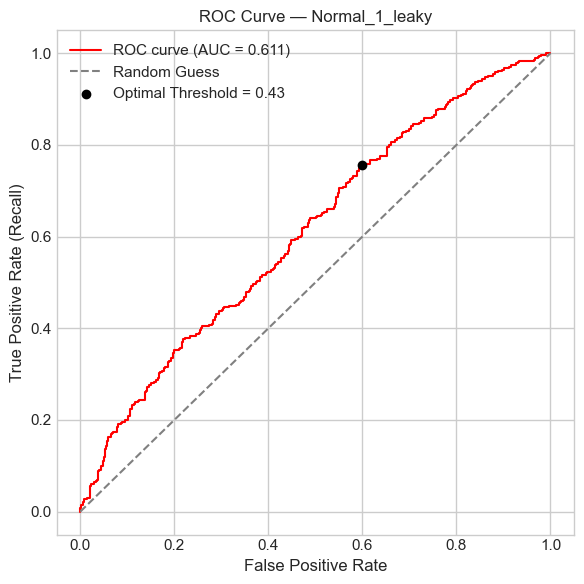

AUC Score: 0.6108
Optimal Threshold (Youden’s J): 0.4330
Plotting loss for Normal_1_leaky


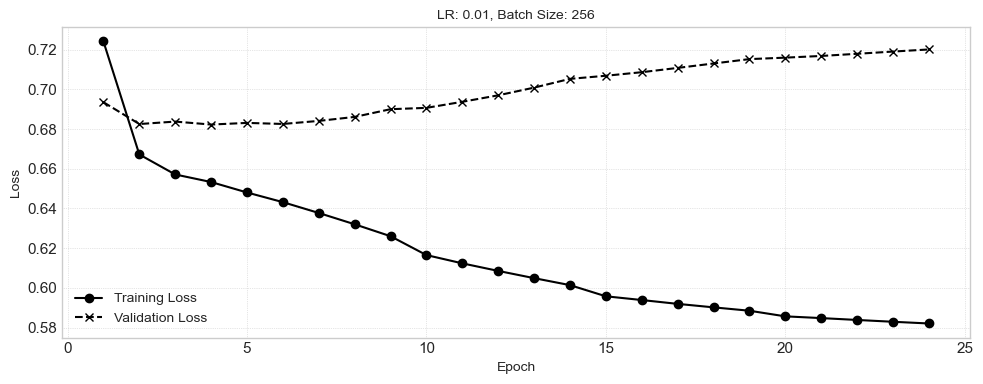


--- Training Normal_2_leaky ---
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=16, AUC=0.5684
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=32, AUC=0.5808
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=64, AUC=0.5795
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=128, AUC=0.6163
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=256, AUC=0.5921
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=16, AUC=0.5747
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=32, AUC=0.5849
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=64, AUC=0.6044
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=128, AUC=0.5947
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=256, AUC=0.5594
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.01, Batch=16, AUC=0.5848
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.01, Batch=32, AUC=0.5882
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.01, Batch=64, AUC=0.6118
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=

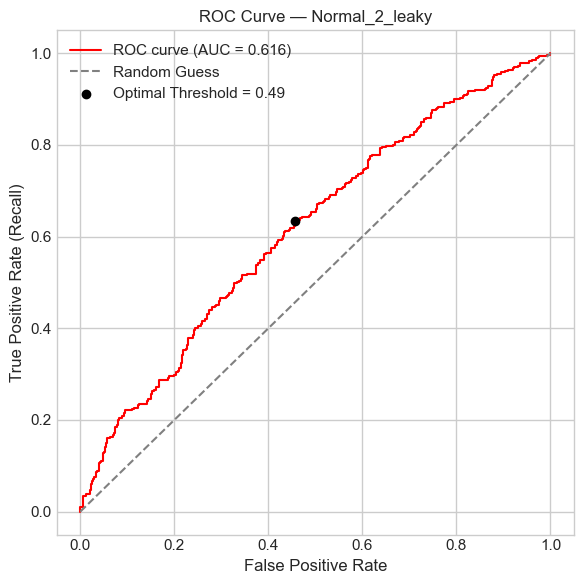

AUC Score: 0.6163
Optimal Threshold (Youden’s J): 0.4853
Plotting loss for Normal_2_leaky


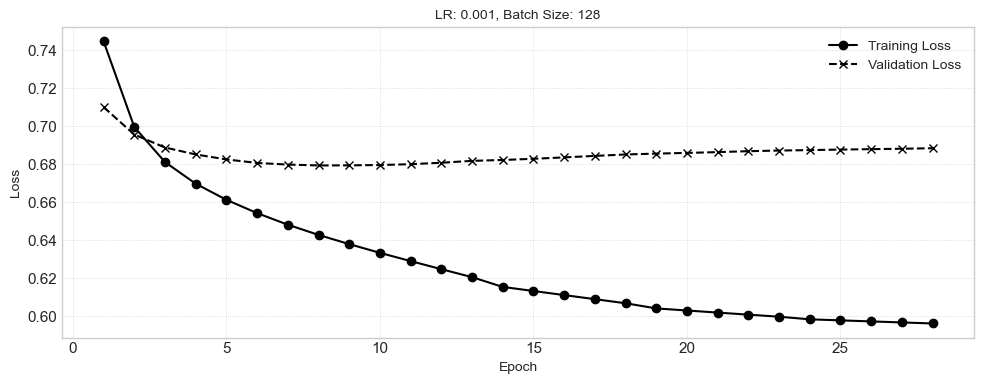


--- Training Normal_3_leaky ---
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=16, AUC=0.5144
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=32, AUC=0.5535
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=64, AUC=0.5934
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=128, AUC=0.5681
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=256, AUC=0.6033
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=16, AUC=0.5952
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=32, AUC=0.5479
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=64, AUC=0.5609
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=128, AUC=0.5771
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=256, AUC=0.5715
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.01, Batch=16, AUC=0.5637
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.01, Batch=32, AUC=0.5684
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.01, Batch=64, AUC=0.5967
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=

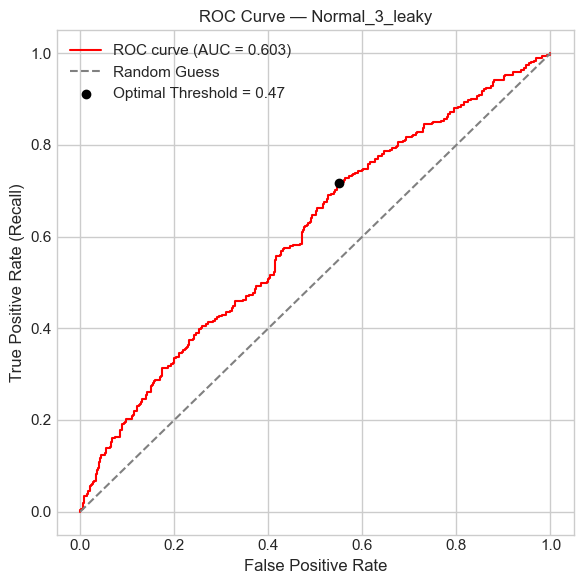

AUC Score: 0.6033
Optimal Threshold (Youden’s J): 0.4658
Plotting loss for Normal_3_leaky


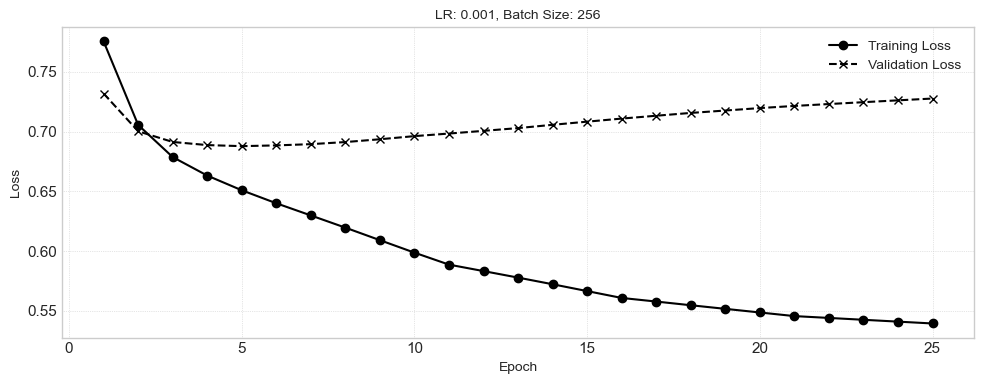


--- Training Normal_4_leaky ---
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=16, AUC=0.5409
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=32, AUC=0.5908
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=64, AUC=0.5657
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=128, AUC=0.6001
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=256, AUC=0.5784
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=16, AUC=0.6101
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=32, AUC=0.5873
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=64, AUC=0.5626
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=128, AUC=0.5875
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=256, AUC=0.5605
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.01, Batch=16, AUC=0.5809
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.01, Batch=32, AUC=0.5724
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.01, Batch=64, AUC=0.5766
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=

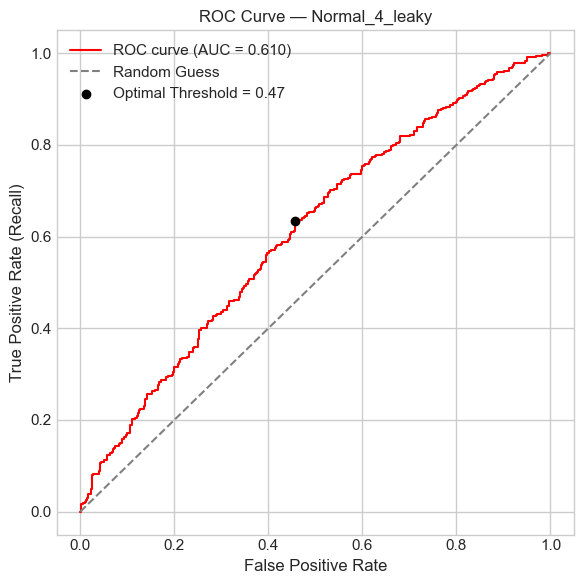

AUC Score: 0.6101
Optimal Threshold (Youden’s J): 0.4704
Plotting loss for Normal_4_leaky


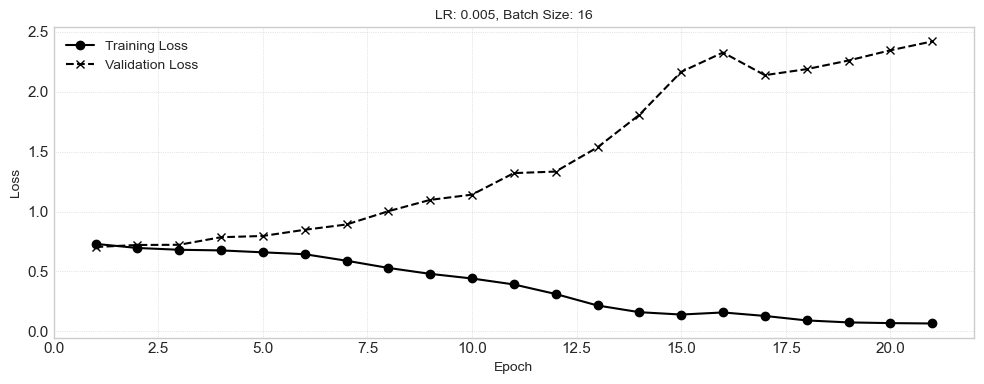


--- Training Dropout_1_leaky ---
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=16, AUC=0.5837
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=32, AUC=0.5954
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=64, AUC=0.6005
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=128, AUC=0.6056
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=256, AUC=0.5966
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=16, AUC=0.5877
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=32, AUC=0.6037
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=64, AUC=0.6065
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=128, AUC=0.6083
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=256, AUC=0.5886
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, Batch=16, AUC=0.5874
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, Batch=32, AUC=0.5979
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, Batch=64, AUC=0.6044
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR

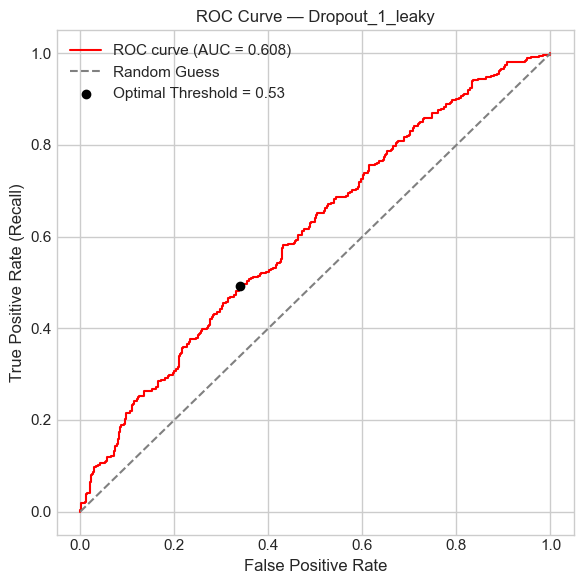

AUC Score: 0.6083
Optimal Threshold (Youden’s J): 0.5285
Plotting loss for Dropout_1_leaky


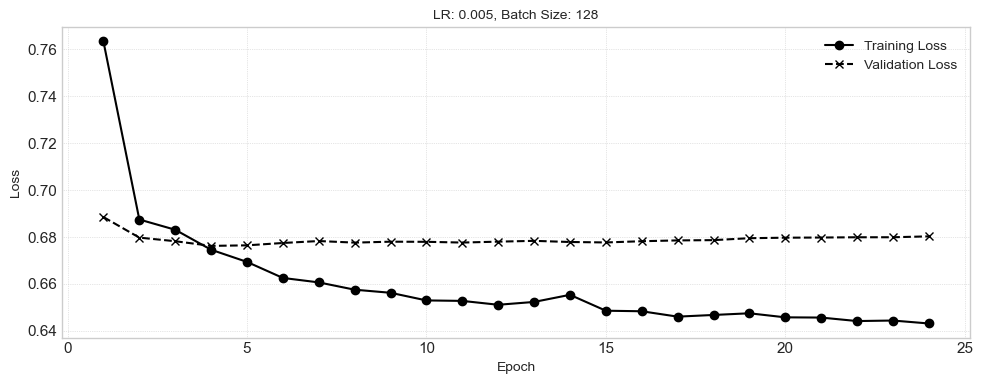


--- Training Dropout_2_leaky ---
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=16, AUC=0.5875
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=32, AUC=0.6125
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=64, AUC=0.6009
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=128, AUC=0.5891
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=256, AUC=0.5988
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=16, AUC=0.5998
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=32, AUC=0.5928
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=64, AUC=0.5838
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=128, AUC=0.5987
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=256, AUC=0.6061
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.01, Batch=16, AUC=0.5987
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.01, Batch=32, AUC=0.5926
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.01, Batch=64, AUC=0.6044
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR

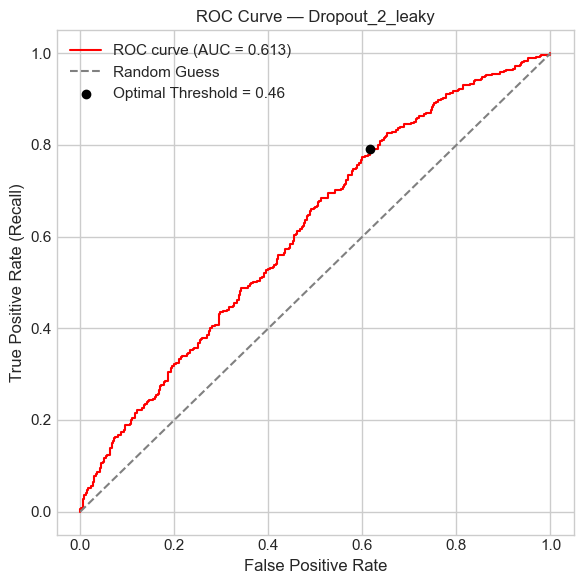

AUC Score: 0.6125
Optimal Threshold (Youden’s J): 0.4629
Plotting loss for Dropout_2_leaky


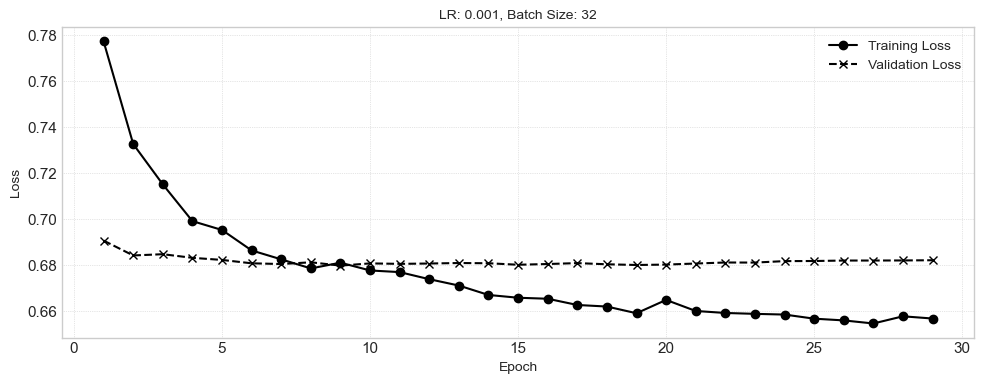


--- Training Dropout_3_leaky ---
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=16, AUC=0.5974
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=32, AUC=0.6136
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=64, AUC=0.6003
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=128, AUC=0.6019
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=256, AUC=0.5934
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=16, AUC=0.5721
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=32, AUC=0.5935
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=64, AUC=0.6016
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=128, AUC=0.5888
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=256, AUC=0.5858
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.01, Batch=16, AUC=0.6128
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.01, Batch=32, AUC=0.6064
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.01, Batch=64, AUC=0.6070
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR

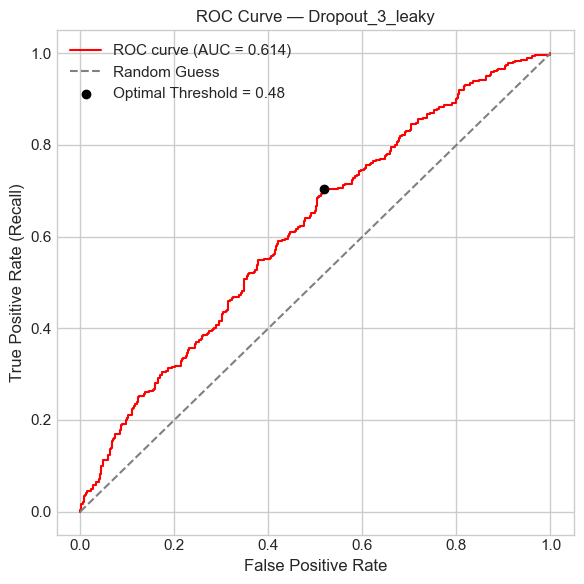

AUC Score: 0.6136
Optimal Threshold (Youden’s J): 0.4841
Plotting loss for Dropout_3_leaky


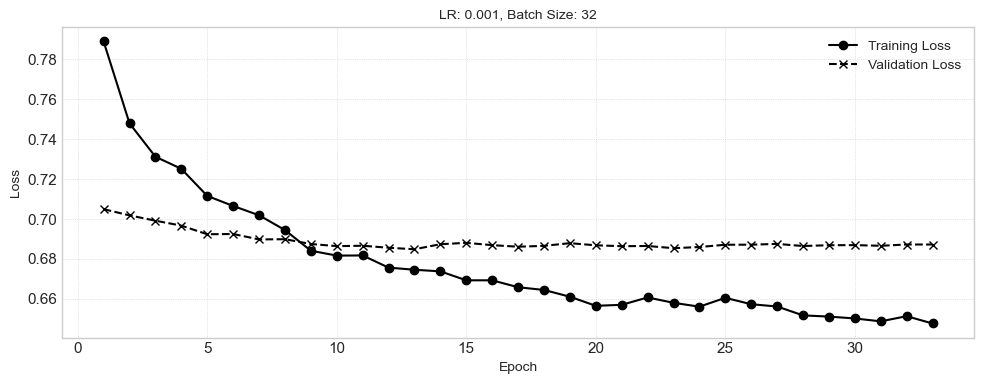


--- Training Dropout_4_leaky ---
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=16, AUC=0.5963
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=32, AUC=0.5967
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=64, AUC=0.6168
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=128, AUC=0.5992
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=256, AUC=0.6005
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=16, AUC=0.5909
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=32, AUC=0.5957
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=64, AUC=0.6040
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=128, AUC=0.5891
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=256, AUC=0.5911
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.01, Batch=16, AUC=0.5809
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.01, Batch=32, AUC=0.6031
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.01, Batch=64, AUC=0.5863
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR

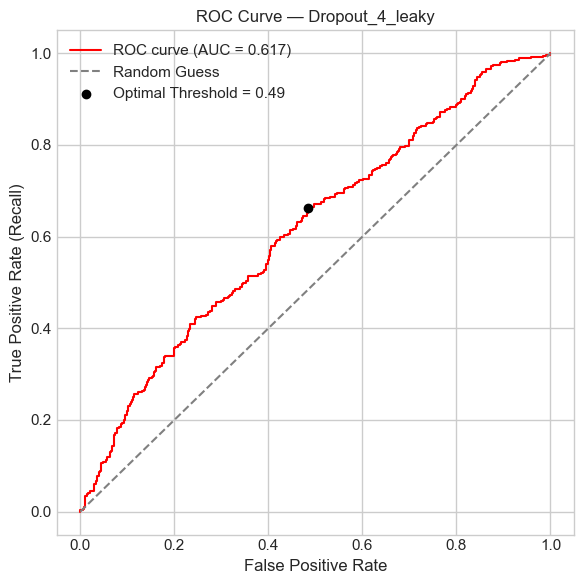

AUC Score: 0.6168
Optimal Threshold (Youden’s J): 0.4946
Plotting loss for Dropout_4_leaky


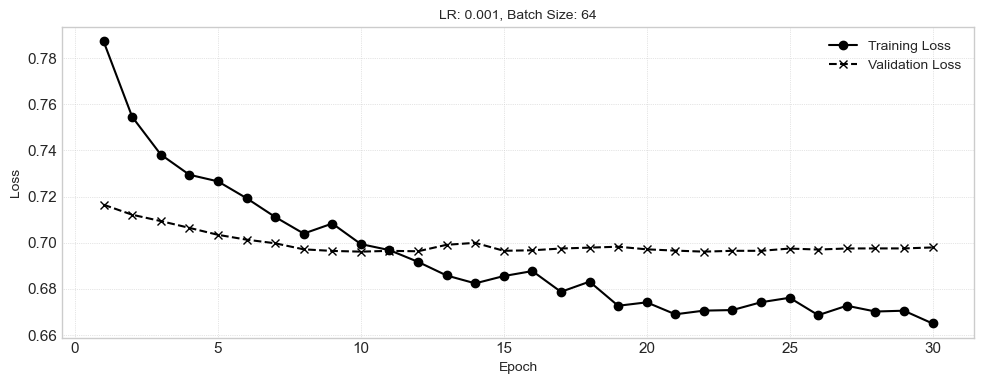

In [96]:
# Normal models
results_normal_leaky_ds2, _ = train_model_pipeline(
    model_dict=leaky_normal_model_dict,
    X_train=X_train2_scaled,
    y_train=y_train2,
    X_val=X_val2_scaled,
    y_val=y_val2,
    X_test=X_test2_scaled,
    y_test=y_test2
)

# Dropout models
results_dropout_leaky_ds2, _ = train_model_pipeline(
    model_dict=leaky_dropout_model_dict,
    X_train=X_train2_scaled,
    y_train=y_train2,
    X_val=X_val2_scaled,
    y_val=y_val2,
    X_test=X_test2_scaled,
    y_test=y_test2
)


**Evaluation**

In [97]:
results_normal_leaky_ds2

{'Normal_1_leaky': {'model': <Sequential name=sequential_814, built=True>,
  'logs':     Hyperparameters            Metrics                              
        Learning Rate Batch Size   Epoch Training Loss Validation Loss
  0             0.001         16       1      0.734721        0.686943
  1             0.001         16       2      0.687789        0.678399
  2             0.001         16       3      0.673347        0.678971
  3             0.001         16       4      0.666484        0.680817
  4             0.001         16       5      0.661636        0.682359
  ..              ...        ...     ...           ...             ...
  473           0.050        256      17      0.555294        0.772739
  474           0.050        256      18      0.552633        0.776813
  475           0.050        256      19      0.550423        0.777901
  476           0.050        256      20      0.548760        0.780518
  477           0.050        256      21      0.546996        0.7

In [98]:
# Collecting results for the normal models
sorted_normal_models_leaky_ds2, best_normal_leaky_ds2 = rank_models_by_auc(results_normal_leaky_ds2, X_test2_scaled, y_test2, label="Normal (LeakyReLu)")

# Collecting results for the dropout models
sorted_dropout_models_leaky_ds2, best_dropout_leaky_ds2 = rank_models_by_auc(results_dropout_leaky_ds2, X_test2_scaled, y_test2, label="Dropout (LeakyReLu)")


Normal (LeakyReLu) models ranked by AUC:
Normal_2_leaky: AUC = 0.6163, Params = {'learning_rate': 0.001, 'batch_size': 128, 'val_auc': 0.6162985887082847, 'epoch': 27}, Runtime = 1.90s
Normal_1_leaky: AUC = 0.6108, Params = {'learning_rate': 0.01, 'batch_size': 256, 'val_auc': 0.610841317758236, 'epoch': 23}, Runtime = 1.31s
Normal_4_leaky: AUC = 0.6101, Params = {'learning_rate': 0.005, 'batch_size': 16, 'val_auc': 0.6100538128363302, 'epoch': 20}, Runtime = 4.55s
Normal_3_leaky: AUC = 0.6033, Params = {'learning_rate': 0.001, 'batch_size': 256, 'val_auc': 0.6032702178072823, 'epoch': 24}, Runtime = 1.87s
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 669us/step

Best Normal (LeakyReLu) Model: Normal_2_leaky
AUC: 0.6163
Best Hyperparameters: {'learning_rate': 0.001, 'batch_size': 128, 'val_auc': 0.6162985887082847, 'epoch': 27}
Model Training Time: 1.8966 seconds
Threshold used: 0.4853

AUC on Test Set: 0.6336
Classification Report:
              precision    recall  f1-score   support

           0 

##### Dataset 3

In [ ]:
seed_value = 42
np.random.seed(seed_value)
tf.random.set_seed(seed_value)
random.seed(seed_value)

device_name = tf.test.gpu_device_name()
device = 'GPU' if device_name else 'CPU'
print(f"Using device: {device}")


Using device: CPU


**Training**


--- Training Normal_1_leaky ---
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=16, AUC=0.6176
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=32, AUC=0.6070
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=64, AUC=0.6118
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=128, AUC=0.6032
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=256, AUC=0.6184
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=16, AUC=0.6121
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=32, AUC=0.6020
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=64, AUC=0.6189
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=128, AUC=0.6105
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=256, AUC=0.6169
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, Batch=16, AUC=0.6054
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, Batch=32, AUC=0.6036
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, Batch=64, AUC=0.6123
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=

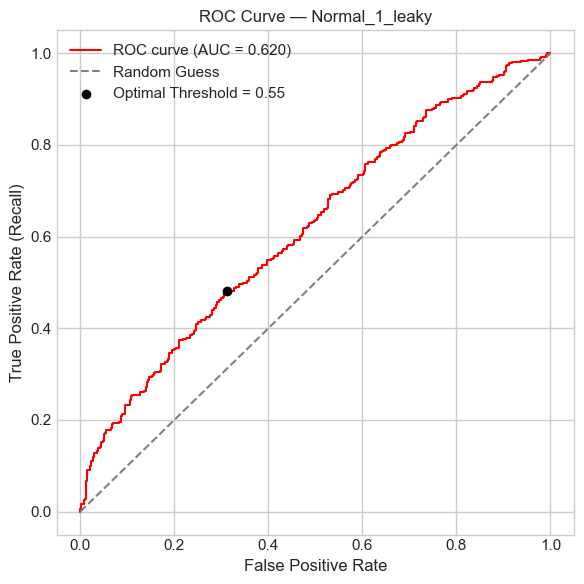

AUC Score: 0.6197
Optimal Threshold (Youden’s J): 0.5487
Plotting loss for Normal_1_leaky


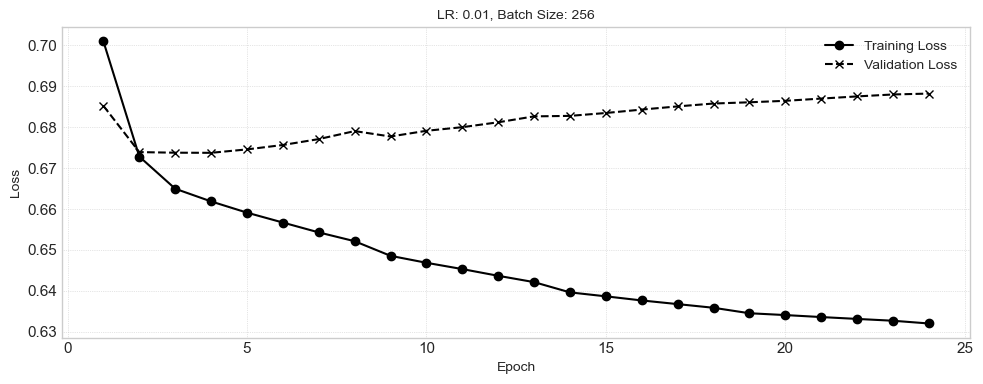


--- Training Normal_2_leaky ---
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=16, AUC=0.6121
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=32, AUC=0.5987
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=64, AUC=0.6170
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=128, AUC=0.5840
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=256, AUC=0.6236
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=16, AUC=0.6080
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=32, AUC=0.5910
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=64, AUC=0.6022
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=128, AUC=0.5672
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=256, AUC=0.6077
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.01, Batch=16, AUC=0.5970
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.01, Batch=32, AUC=0.6039
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.01, Batch=64, AUC=0.6051
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=

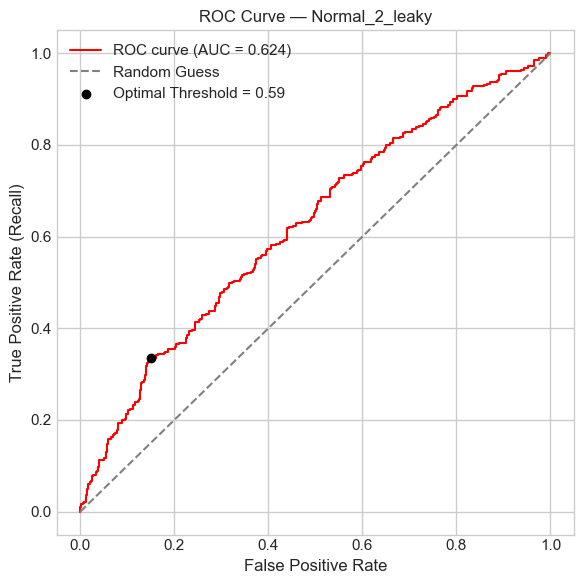

AUC Score: 0.6236
Optimal Threshold (Youden’s J): 0.5882
Plotting loss for Normal_2_leaky


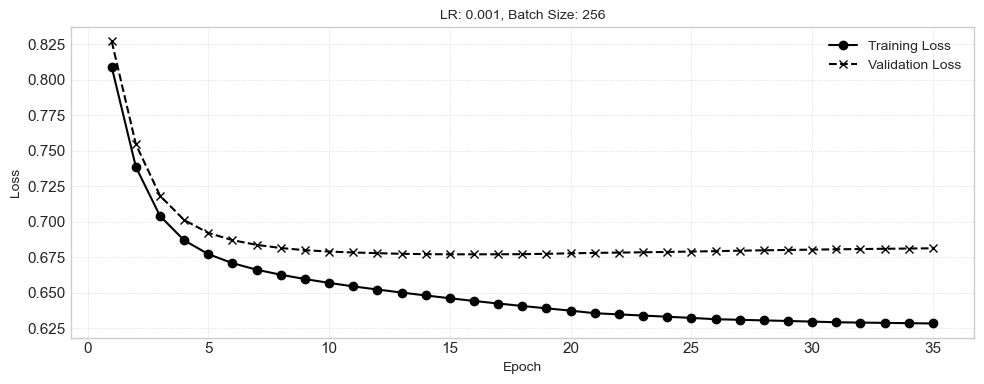


--- Training Normal_3_leaky ---
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=16, AUC=0.5850
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=32, AUC=0.5960
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=64, AUC=0.5287
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=128, AUC=0.5710
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=256, AUC=0.5794
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=16, AUC=0.5985
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=32, AUC=0.5977
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=64, AUC=0.6003
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=128, AUC=0.5909
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=256, AUC=0.5775
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.01, Batch=16, AUC=0.5963
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.01, Batch=32, AUC=0.6014
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.01, Batch=64, AUC=0.6116
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=

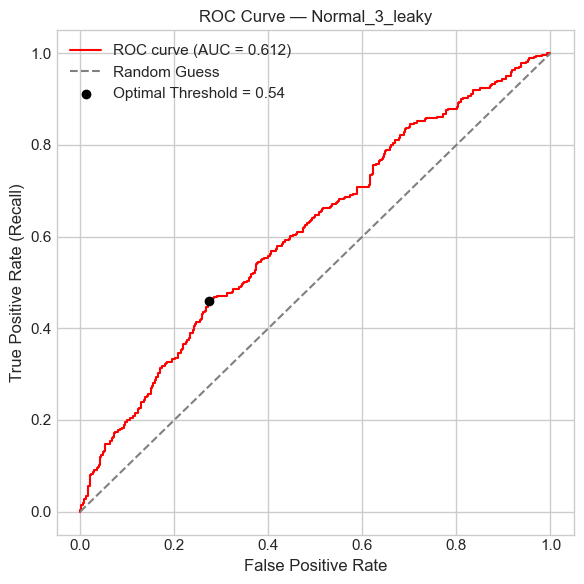

AUC Score: 0.6116
Optimal Threshold (Youden’s J): 0.5400
Plotting loss for Normal_3_leaky


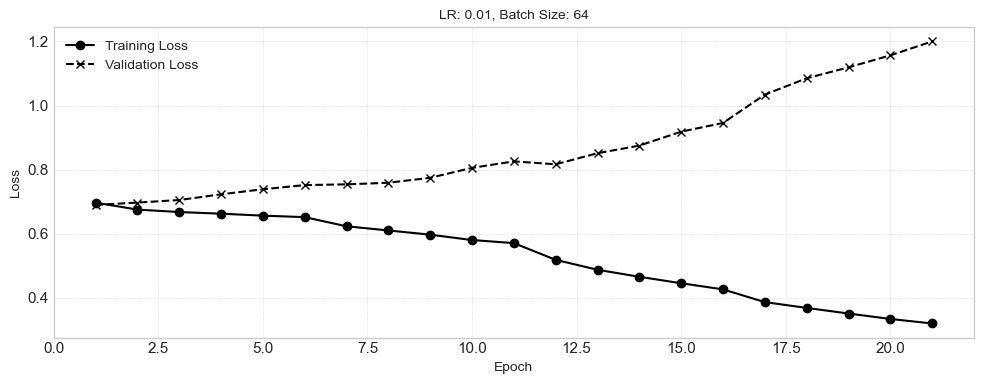


--- Training Normal_4_leaky ---
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=16, AUC=0.5883
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=32, AUC=0.5943
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=64, AUC=0.5763
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=128, AUC=0.5881
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=256, AUC=0.6059
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=16, AUC=0.5822
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=32, AUC=0.5856
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=64, AUC=0.5971
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=128, AUC=0.5835
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=256, AUC=0.5752
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.01, Batch=16, AUC=0.5935
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.01, Batch=32, AUC=0.6024
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.01, Batch=64, AUC=0.6070
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=

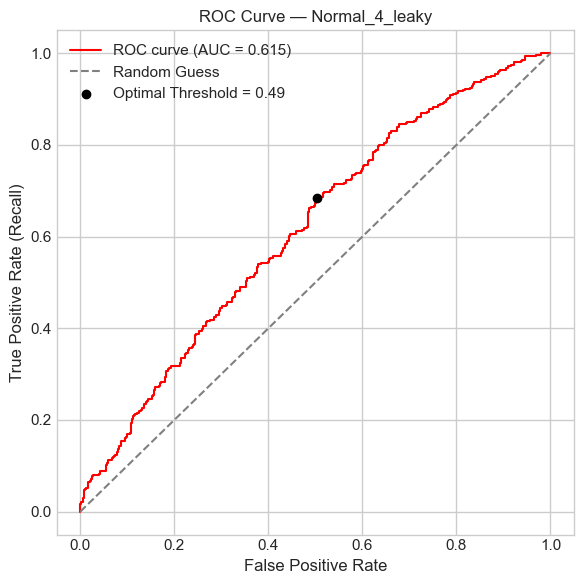

AUC Score: 0.6150
Optimal Threshold (Youden’s J): 0.4893
Plotting loss for Normal_4_leaky


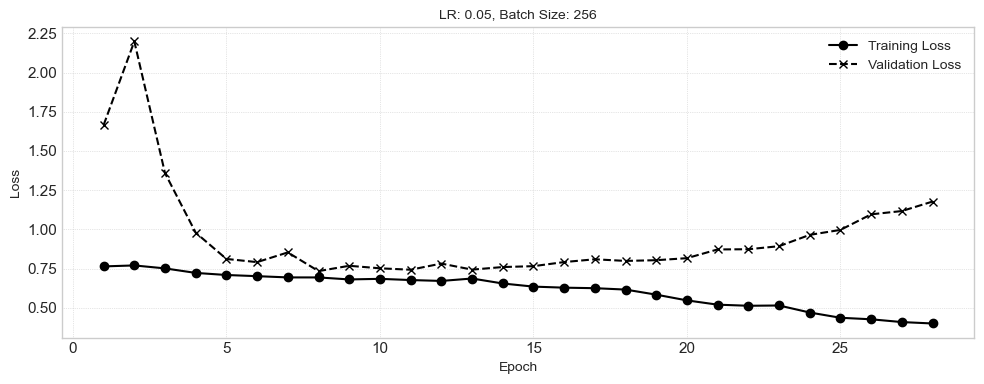


--- Training Dropout_1_leaky ---
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=16, AUC=0.6231
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=32, AUC=0.6237
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=64, AUC=0.6114
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=128, AUC=0.6020
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=256, AUC=0.6059
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=16, AUC=0.6167
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=32, AUC=0.6139
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=64, AUC=0.6176
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=128, AUC=0.6273
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=256, AUC=0.6112
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.01, Batch=16, AUC=0.6137
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, Batch=32, AUC=0.6154
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, Batch=64, AUC=0.6261
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR

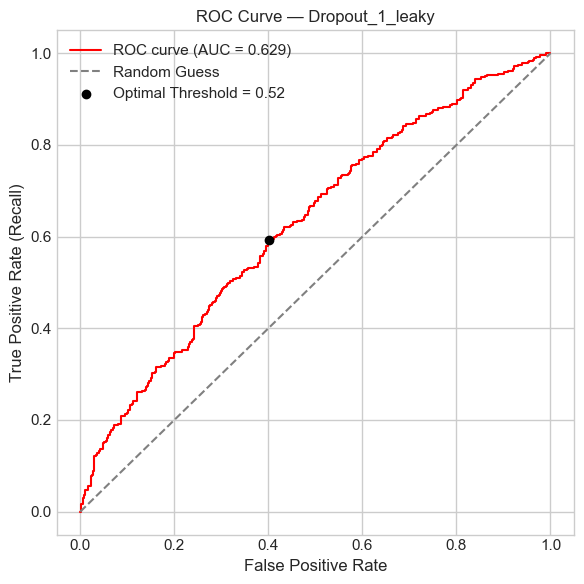

AUC Score: 0.6292
Optimal Threshold (Youden’s J): 0.5152
Plotting loss for Dropout_1_leaky


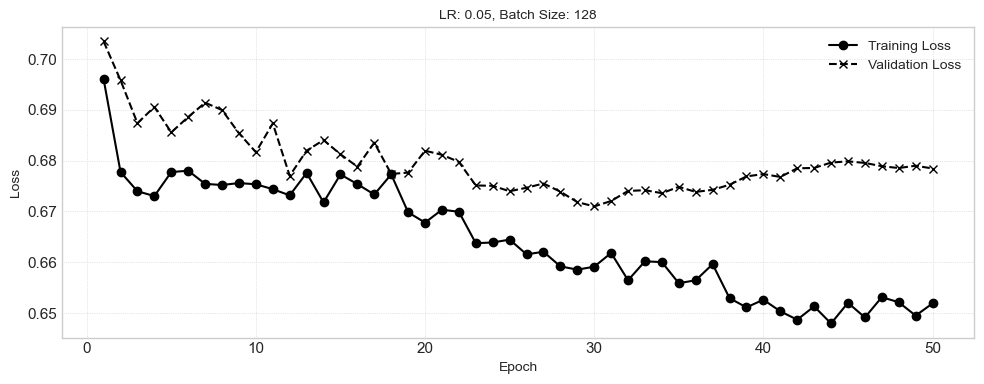


--- Training Dropout_2_leaky ---
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=16, AUC=0.6187
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=32, AUC=0.6182
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=64, AUC=0.6215
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=128, AUC=0.6124
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=256, AUC=0.6098
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=16, AUC=0.6125
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=32, AUC=0.6199
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=64, AUC=0.6224
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=128, AUC=0.6166
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=256, AUC=0.6150
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.01, Batch=16, AUC=0.6236
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.01, Batch=32, AUC=0.6166
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.01, Batch=64, AUC=0.6174
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR

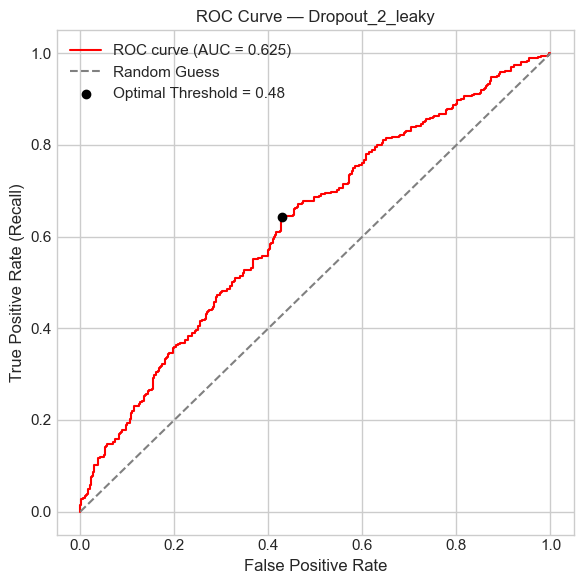

AUC Score: 0.6250
Optimal Threshold (Youden’s J): 0.4812
Plotting loss for Dropout_2_leaky


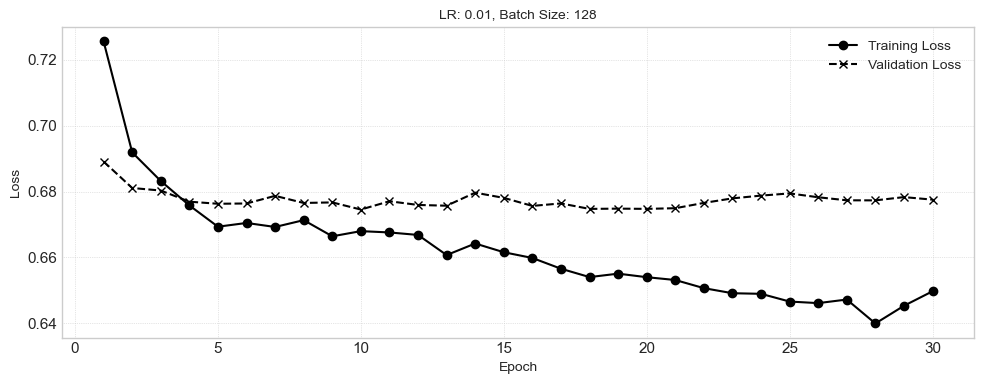


--- Training Dropout_3_leaky ---
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=16, AUC=0.6234
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=32, AUC=0.6106
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=64, AUC=0.6066
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=128, AUC=0.6141
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=256, AUC=0.6209
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=16, AUC=0.6108
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=32, AUC=0.6009
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=64, AUC=0.6153
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=128, AUC=0.6112
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=256, AUC=0.6092
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.01, Batch=16, AUC=0.6076
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.01, Batch=32, AUC=0.6216
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.01, Batch=64, AUC=0.6017
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR

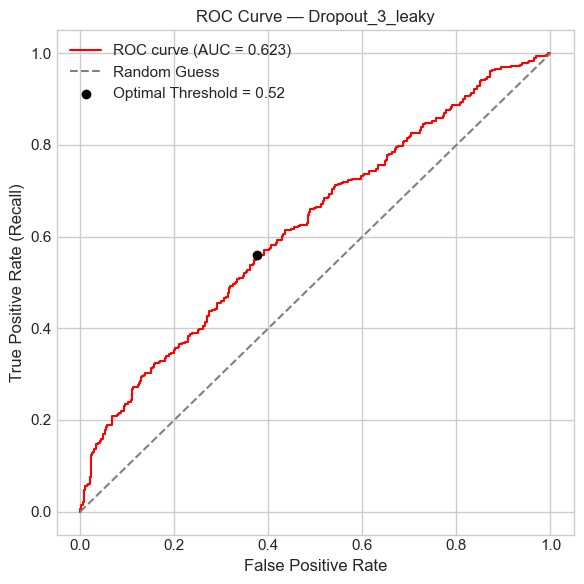

AUC Score: 0.6234
Optimal Threshold (Youden’s J): 0.5166
Plotting loss for Dropout_3_leaky


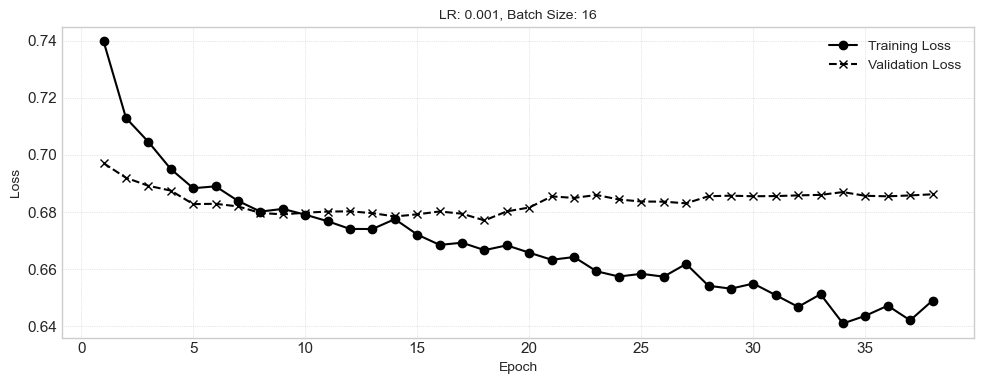


--- Training Dropout_4_leaky ---
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=16, AUC=0.6173
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=32, AUC=0.6273
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=64, AUC=0.6154
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
LR=0.001, Batch=128, AUC=0.6168
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=256, AUC=0.6118
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
LR=0.005, Batch=16, AUC=0.6134
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=32, AUC=0.6141
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=64, AUC=0.6172
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=128, AUC=0.6112
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=256, AUC=0.6207
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
LR=0.01, Batch=16, AUC=0.6135
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.01, Batch=32, AUC=0.6147
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.01, Batch=64, AUC=0.6053
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
LR=0.0

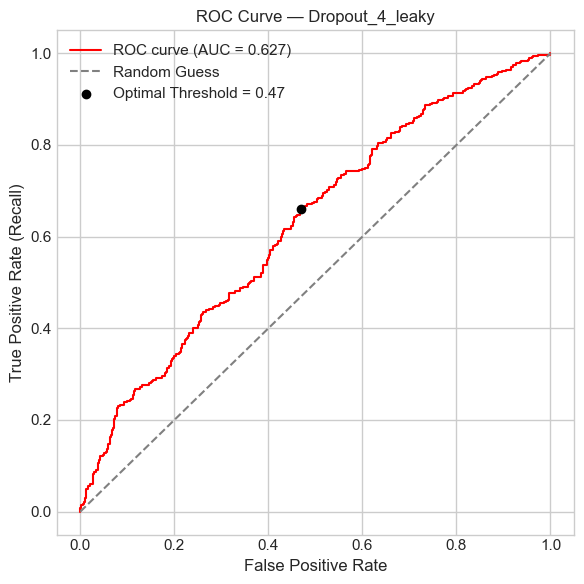

AUC Score: 0.6273
Optimal Threshold (Youden’s J): 0.4684
Plotting loss for Dropout_4_leaky


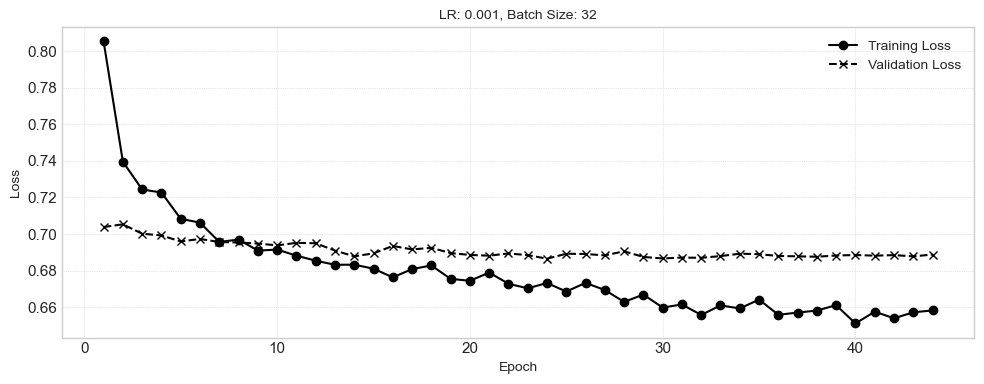

In [100]:
# Normal models
results_normal_leaky_ds3, _ = train_model_pipeline(
    model_dict=leaky_normal_model_dict,
    X_train=X_train3_scaled,
    y_train=y_train3,
    X_val=X_val3_scaled,
    y_val=y_val3,
    X_test=X_test3_scaled,
    y_test=y_test3
)

# Dropout models
results_dropout_leaky_ds3, _ = train_model_pipeline(
    model_dict=leaky_dropout_model_dict,
    X_train=X_train3_scaled,
    y_train=y_train3,
    X_val=X_val3_scaled,
    y_val=y_val3,
    X_test=X_test3_scaled,
    y_test=y_test3
)


**Evaluation**

In [101]:
# Collecting results for the normal models
sorted_normal_models_leaky_ds3, best_normal_leaky_ds3 = rank_models_by_auc(results_normal_leaky_ds3, X_test3_scaled, y_test3, label="Normal (LeakyReLu)")

# COllecting results for the dropout models
sorted_dropout_models_leaky_ds3, best_dropout_leaky_ds3 = rank_models_by_auc(results_dropout_leaky_ds3, X_test3_scaled, y_test3, label="Dropout (LeakyReLu)")


Normal (LeakyReLu) models ranked by AUC:
Normal_2_leaky: AUC = 0.6236, Params = {'learning_rate': 0.001, 'batch_size': 256, 'val_auc': 0.6236279108323375, 'epoch': 34}, Runtime = 1.93s
Normal_1_leaky: AUC = 0.6197, Params = {'learning_rate': 0.01, 'batch_size': 256, 'val_auc': 0.6196765703469856, 'epoch': 23}, Runtime = 1.33s
Normal_4_leaky: AUC = 0.6150, Params = {'learning_rate': 0.05, 'batch_size': 256, 'val_auc': 0.6149515408155511, 'epoch': 27}, Runtime = 2.49s
Normal_3_leaky: AUC = 0.6116, Params = {'learning_rate': 0.01, 'batch_size': 64, 'val_auc': 0.6116219147422303, 'epoch': 20}, Runtime = 2.12s
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 595us/step

Best Normal (LeakyReLu) Model: Normal_2_leaky
AUC: 0.6236
Best Hyperparameters: {'learning_rate': 0.001, 'batch_size': 256, 'val_auc': 0.6236279108323375, 'epoch': 34}
Model Training Time: 1.9251 seconds
Threshold used: 0.5882

AUC on Test Set: 0.6469
Classification Report:
              precision    recall  f1-score   support

           0  

##### Dataset 4

In [ ]:
seed_value = 42
np.random.seed(seed_value)
tf.random.set_seed(seed_value)
random.seed(seed_value) 

device_name = tf.test.gpu_device_name()
device = 'GPU' if device_name else 'CPU'
print(f"Using device: {device}")


Using device: CPU


**Training**


--- Training Normal_1_leaky ---
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=16, AUC=0.7209
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=32, AUC=0.7041
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=64, AUC=0.7222
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=128, AUC=0.7091
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=256, AUC=0.7264
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=16, AUC=0.7117
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=32, AUC=0.7092
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=64, AUC=0.7259
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=128, AUC=0.7132
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=256, AUC=0.7188
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, Batch=16, AUC=0.7057
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, Batch=32, AUC=0.7076
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, Batch=64, AUC=0.7162
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=

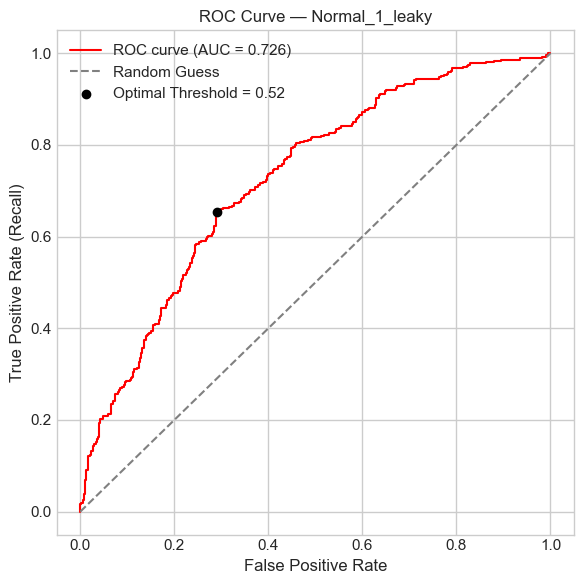

AUC Score: 0.7264
Optimal Threshold (Youden’s J): 0.5229
Plotting loss for Normal_1_leaky


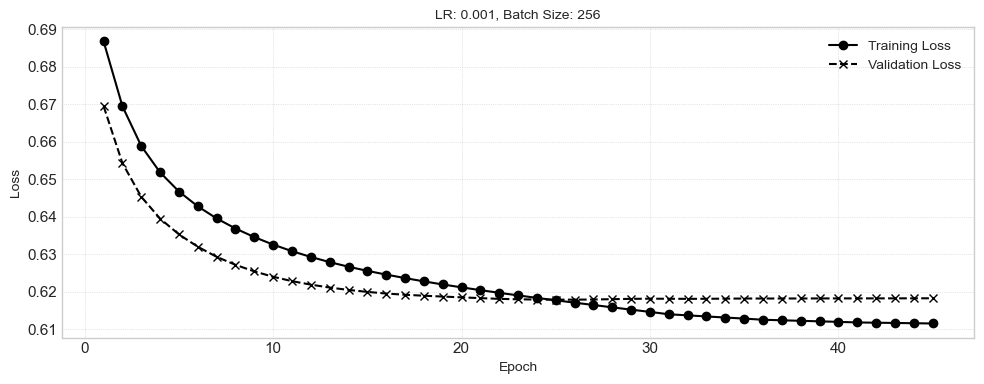


--- Training Normal_2_leaky ---
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=16, AUC=0.7032
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=32, AUC=0.7147
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=64, AUC=0.7098
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=128, AUC=0.6998
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=256, AUC=0.7070
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=16, AUC=0.7098
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=32, AUC=0.7043
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=64, AUC=0.7218
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=128, AUC=0.6993
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=256, AUC=0.7129
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.01, Batch=16, AUC=0.7000
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.01, Batch=32, AUC=0.7036
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.01, Batch=64, AUC=0.7055
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=

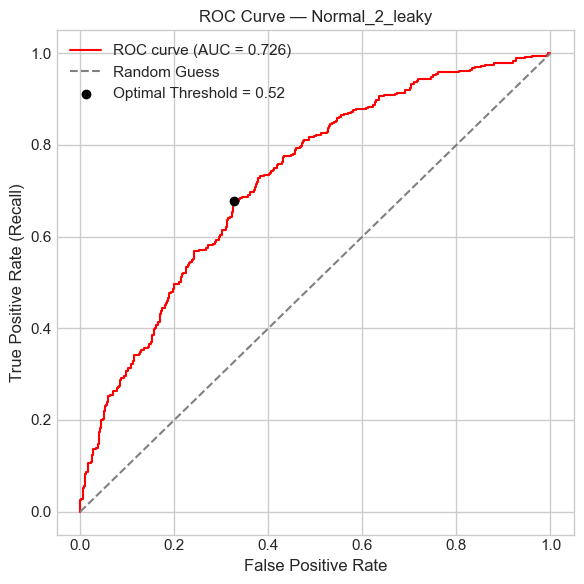

AUC Score: 0.7263
Optimal Threshold (Youden’s J): 0.5213
Plotting loss for Normal_2_leaky


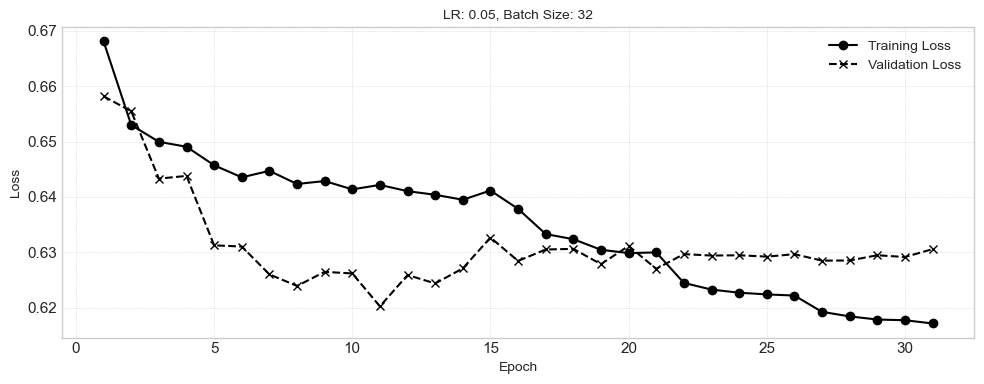


--- Training Normal_3_leaky ---
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=16, AUC=0.6852
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=32, AUC=0.6779
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=64, AUC=0.6921
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=128, AUC=0.6913
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=256, AUC=0.6865
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=16, AUC=0.7116
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=32, AUC=0.6977
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=64, AUC=0.6983
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=128, AUC=0.7127
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=256, AUC=0.6947
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.01, Batch=16, AUC=0.6883
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.01, Batch=32, AUC=0.6987
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.01, Batch=64, AUC=0.6931
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=

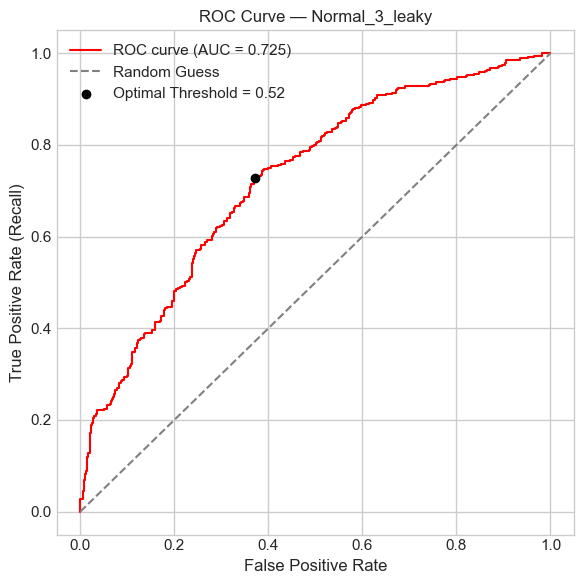

AUC Score: 0.7254
Optimal Threshold (Youden’s J): 0.5188
Plotting loss for Normal_3_leaky


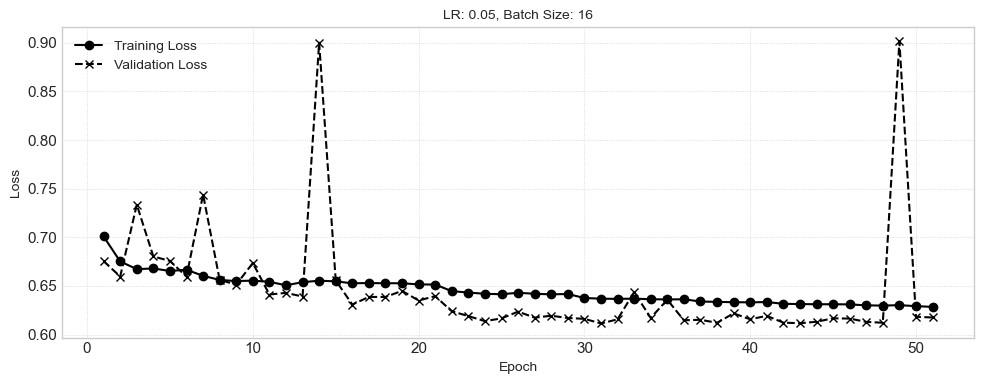


--- Training Normal_4_leaky ---
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=16, AUC=0.6902
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=32, AUC=0.6914
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
LR=0.001, Batch=64, AUC=0.6761
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=128, AUC=0.6918
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=256, AUC=0.6727
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=16, AUC=0.6793
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=32, AUC=0.6948
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=64, AUC=0.7016
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=128, AUC=0.6891
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=256, AUC=0.6915
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.01, Batch=16, AUC=0.6997
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.01, Batch=32, AUC=0.7058
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.01, Batch=64, AUC=0.6774
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0

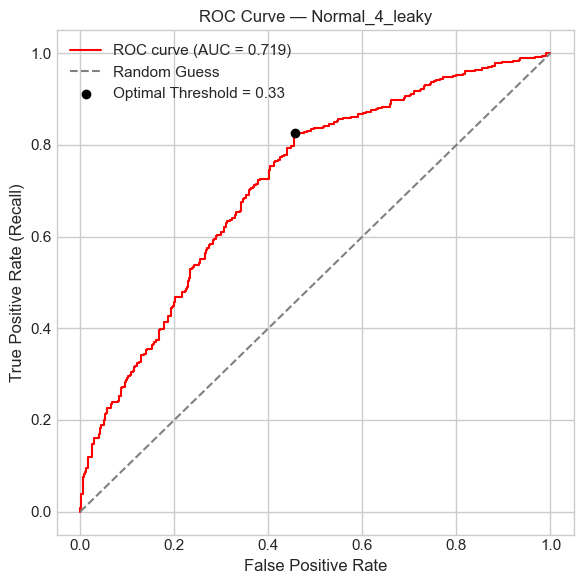

AUC Score: 0.7186
Optimal Threshold (Youden’s J): 0.3282
Plotting loss for Normal_4_leaky


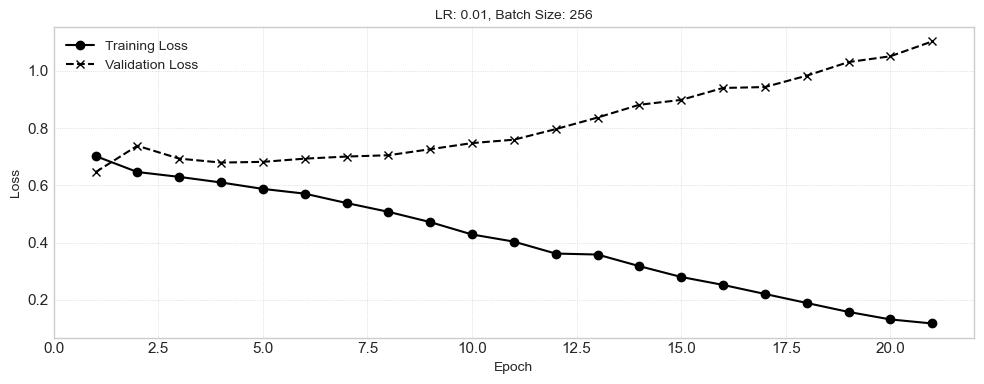


--- Training Dropout_1_leaky ---
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=16, AUC=0.7283
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=32, AUC=0.7214
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=64, AUC=0.7157
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=128, AUC=0.7215
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.001, Batch=256, AUC=0.7157
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=16, AUC=0.7181
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=32, AUC=0.7202
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=64, AUC=0.7247
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=128, AUC=0.7165
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.005, Batch=256, AUC=0.7198
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, Batch=16, AUC=0.7123
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, Batch=32, AUC=0.7186
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR=0.01, Batch=64, AUC=0.7190
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
LR

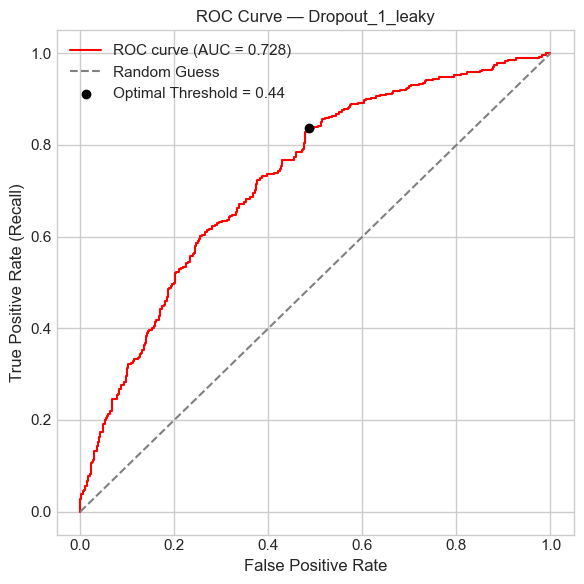

AUC Score: 0.7283
Optimal Threshold (Youden’s J): 0.4391
Plotting loss for Dropout_1_leaky


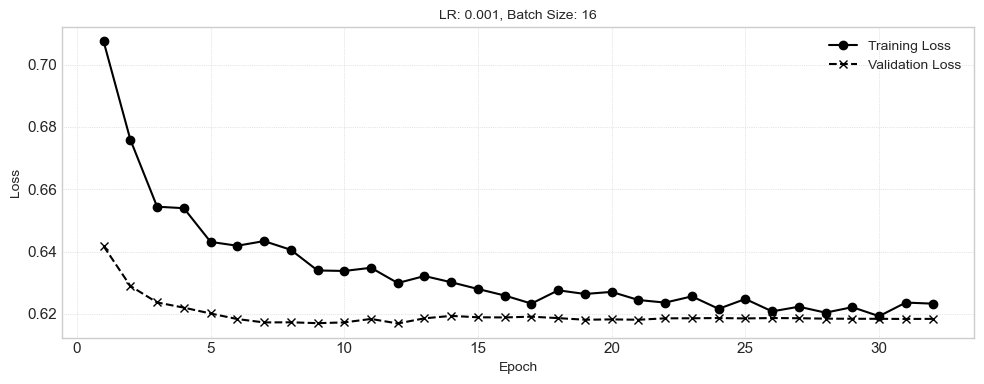


--- Training Dropout_2_leaky ---
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=16, AUC=0.7309
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=32, AUC=0.7211
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=64, AUC=0.7209
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=128, AUC=0.7158
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=256, AUC=0.7167
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=16, AUC=0.7140
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=32, AUC=0.7141
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=64, AUC=0.7181
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=128, AUC=0.7228
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=256, AUC=0.7158
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.01, Batch=16, AUC=0.7227
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.01, Batch=32, AUC=0.7142
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.01, Batch=64, AUC=0.7208
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR

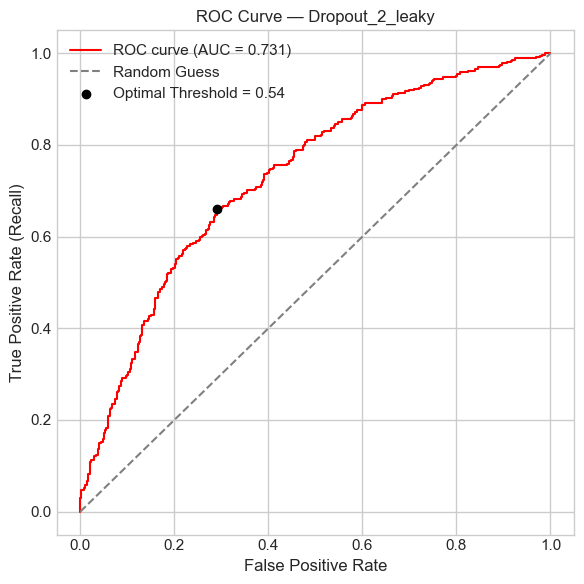

AUC Score: 0.7309
Optimal Threshold (Youden’s J): 0.5359
Plotting loss for Dropout_2_leaky


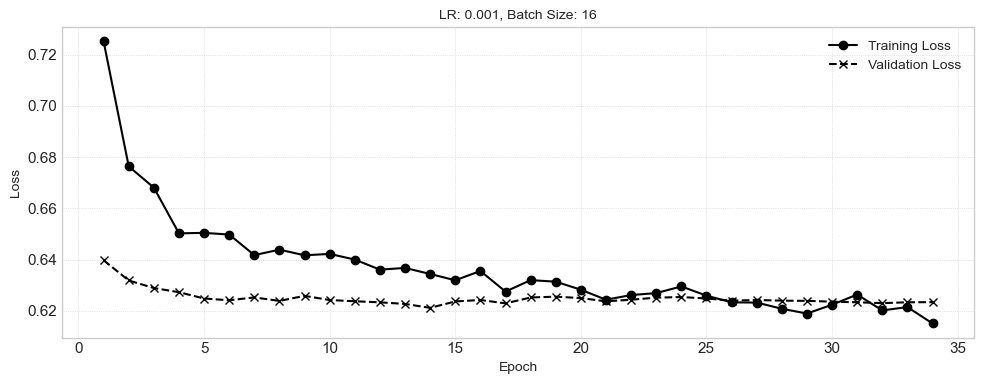


--- Training Dropout_3_leaky ---
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=16, AUC=0.7146
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=32, AUC=0.7143
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=64, AUC=0.7092
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=128, AUC=0.7160
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=256, AUC=0.7177
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=16, AUC=0.7055
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=32, AUC=0.7194
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=64, AUC=0.7097
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=128, AUC=0.7154
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=256, AUC=0.7184
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.01, Batch=16, AUC=0.7094
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.01, Batch=32, AUC=0.7119
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.01, Batch=64, AUC=0.7202
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR

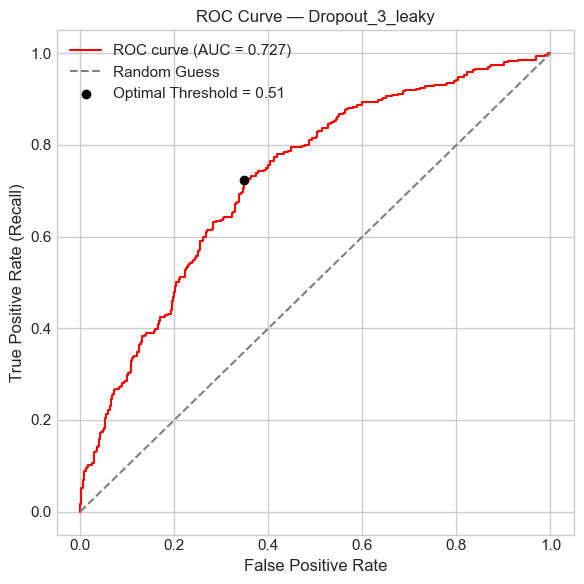

AUC Score: 0.7273
Optimal Threshold (Youden’s J): 0.5104
Plotting loss for Dropout_3_leaky


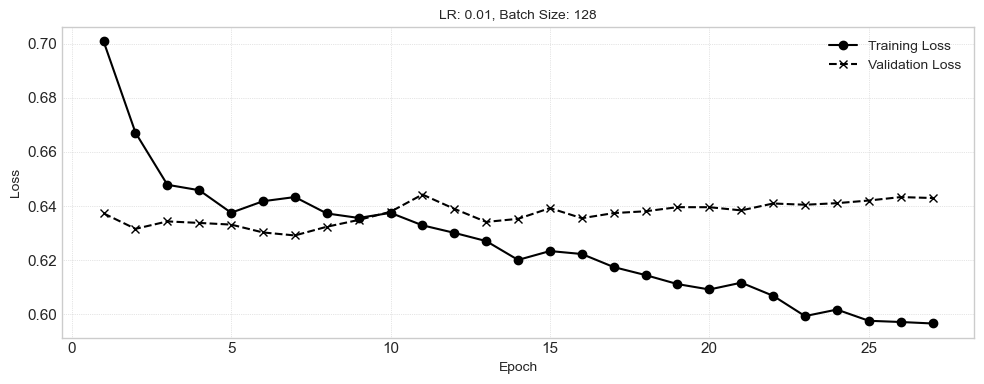


--- Training Dropout_4_leaky ---
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
LR=0.001, Batch=16, AUC=0.7154
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=32, AUC=0.7120
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=64, AUC=0.7193
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=128, AUC=0.7294
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.001, Batch=256, AUC=0.7209
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=16, AUC=0.7061
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=32, AUC=0.7145
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=64, AUC=0.7139
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=128, AUC=0.7144
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.005, Batch=256, AUC=0.7173
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.01, Batch=16, AUC=0.6975
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.01, Batch=32, AUC=0.7087
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=0.01, Batch=64, AUC=0.7225
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
LR=

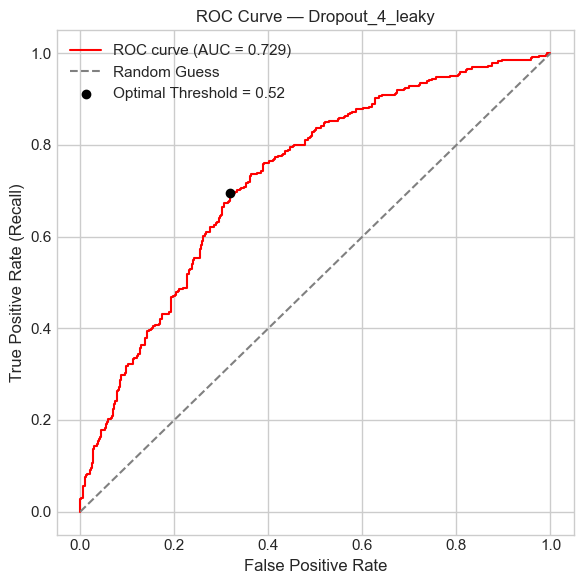

AUC Score: 0.7294
Optimal Threshold (Youden’s J): 0.5211
Plotting loss for Dropout_4_leaky


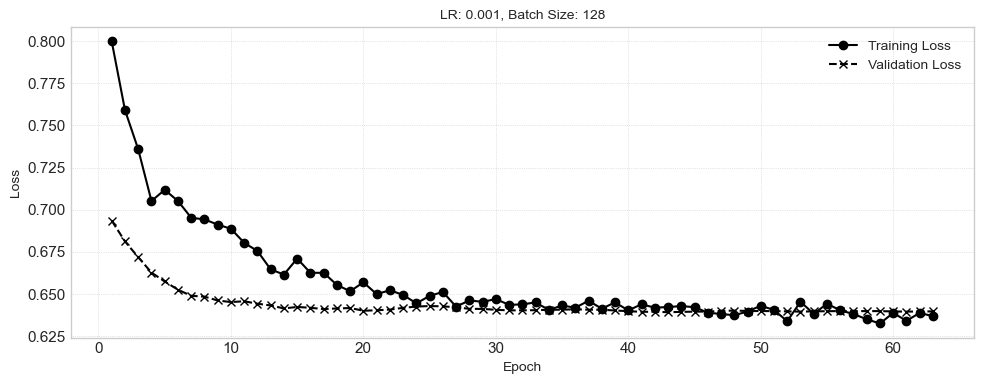

In [103]:
# Normal models
results_normal_leaky_ds4, _ = train_model_pipeline(
    model_dict=leaky_normal_model_dict,
    X_train=X_train4_scaled,
    y_train=y_train4,
    X_val=X_val4_scaled,
    y_val=y_val4,
    X_test=X_test4_scaled,
    y_test=y_test4
)

# Dropout models
results_dropout_leaky_ds4, _ = train_model_pipeline(
    model_dict=leaky_dropout_model_dict,
    X_train=X_train4_scaled,
    y_train=y_train4,
    X_val=X_val4_scaled,
    y_val=y_val4,
    X_test=X_test4_scaled,
    y_test=y_test4
)


**Evaluation**

In [104]:
# Collecting results from the normal models
sorted_normal_models_leaky_ds4, best_normal_leaky_ds4 = rank_models_by_auc(results_normal_leaky_ds4, X_test4_scaled, y_test4, label="Normal (LeakyReLu)")

# Collecting results from the dropout models
sorted_dropout_models_leaky_ds4, best_dropout_leaky_ds4 = rank_models_by_auc(results_dropout_leaky_ds4, X_test4_scaled, y_test4, label="Dropout (LeakyReLu)")


Normal (LeakyReLu) models ranked by AUC:
Normal_1_leaky: AUC = 0.7264, Params = {'learning_rate': 0.001, 'batch_size': 256, 'val_auc': 0.7264249348926852, 'epoch': 44}, Runtime = 2.33s
Normal_2_leaky: AUC = 0.7263, Params = {'learning_rate': 0.05, 'batch_size': 32, 'val_auc': 0.7263420396377478, 'epoch': 30}, Runtime = 3.21s
Normal_3_leaky: AUC = 0.7254, Params = {'learning_rate': 0.05, 'batch_size': 16, 'val_auc': 0.7253749283301443, 'epoch': 50}, Runtime = 8.51s
Normal_4_leaky: AUC = 0.7186, Params = {'learning_rate': 0.01, 'batch_size': 256, 'val_auc': 0.7186396888664764, 'epoch': 20}, Runtime = 2.08s
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 600us/step

Best Normal (LeakyReLu) Model: Normal_1_leaky
AUC: 0.7264
Best Hyperparameters: {'learning_rate': 0.001, 'batch_size': 256, 'val_auc': 0.7264249348926852, 'epoch': 44}
Model Training Time: 2.3310 seconds
Threshold used: 0.5229

AUC on Test Set: 0.7469
Classification Report:
              precision    recall  f1-score   support

           0   

#### Model Selection

For the betting simulation, we do not want to test all the 16 configurations above. Therefore, we selected one configuration per dataset based on the AUC score, as seen below.

In [105]:
# Adding the AUC Scores to the dict
auc_roc_scores['Neural Network (Dataset 1)'] = round(float(best_dropout_ds1[1]), 4)
auc_roc_scores['Neural Network (Dataset 2)'] = round(float(best_normal_ds2[1]), 4)
auc_roc_scores['Neural Network (Dataset 3)'] = round(float(best_dropout_leaky_ds3[1]), 4)
auc_roc_scores['Neural Network (Dataset 4)'] = round(float(best_dropout_leaky_ds4[1]), 4)

# Select the best models
_, _, best_nn_ds1, _, _, _ = best_dropout_ds1
_, _, best_nn_ds2, _, _, _ = best_normal_ds2
_, _, best_nn_ds3, _, _, _ = best_dropout_leaky_ds3
_, _, best_nn_ds4, _, _, _ = best_dropout_leaky_ds4

#### Predictions

In [106]:
# Perform predictions and add to all results, in correct format

# Making sure the results are not already added
all_results = [entry for entry in all_results if 'Neural Network' not in entry['Model']]

# List of best neural network models
best_nns = [best_nn_ds1, best_nn_ds2, best_nn_ds3, best_nn_ds4]

# Corresponding test sets
X_tests_scaled = [X_test1_scaled, X_test2_scaled, X_test3_scaled, X_test4_scaled]
y_tests = [y_test1, y_test2, y_test3, y_test4]
test_index_lists = [X_test1.index, X_test2.index, X_test3.index, X_test4.index]

# Loop through each dataset and its best NN model
for i, (model, X_test_scaled, y_test, test_indexes) in enumerate(zip(best_nns, X_tests_scaled, y_tests, test_index_lists), 1):
    
    # Predict probabilities for class 1 (Blue)
    y_proba = model.predict(X_test_scaled).flatten()  # Ensure shape is (n_samples,)
    
    # Predict class labels based on 0.5 threshold
    y_pred = (y_proba > 0.5).astype(int)

    # Append each prediction to all_results
    for idx, pred, blue_prob in zip(test_indexes, y_pred, y_proba):
        all_results.append({
            'Index': idx,
            'Model': f'Neural Network (Dataset {i})',
            'PredictedWinner': 'Red' if pred == 0 else 'Blue',
            'ActualWinner': 'Red' if y_test.loc[idx] == 0 else 'Blue',
            'RedProb': float(1 - blue_prob),
            'BlueProb': float(blue_prob)
        })

24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 615us/step
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 741us/step
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 565us/step


## Model Selection

In [117]:
auc_roc_scores

{'Logistic Regression (Dataset 1)': 0.5992989275729552,
 'Logistic Regression (Dataset 2)': 0.5992162447635407,
 'Logistic Regression (Dataset 3)': 0.6122158600489198,
 'Logistic Regression (Dataset 4)': 0.69969412147348,
 'Random Forest (Dataset 1)': 0.6045138936056429,
 'Random Forest (Dataset 2)': 0.5922250322216284,
 'Random Forest (Dataset 3)': 0.6067050872417272,
 'Random Forest (Dataset 4)': 0.6999512562564639,
 'XG Boost (Dataset 1)': 0.6012768247455206,
 'XG Boost (Dataset 2)': 0.5734752928559732,
 'XG Boost (Dataset 3)': 0.5970487739738857,
 'XG Boost (Dataset 4)': 0.6970932376001552,
 'Neural Network (Dataset 1)': 0.6219,
 'Neural Network (Dataset 2)': 0.6104,
 'Neural Network (Dataset 3)': 0.6292,
 'Neural Network (Dataset 4)': 0.7309}

In [ ]:
# Convert dictionary to DataFrame
df_auc_sorted_models = pd.DataFrame(list(auc_roc_scores.items()), columns=['Model_Dataset', 'Score'])

# Sort by AUC
df_auc_sorted_models = df_auc_sorted_models.sort_values("Score", ascending=False)

print(df_auc_sorted_models)

                      Model_Dataset     Score
15       Neural Network (Dataset 4)  0.730900
7         Random Forest (Dataset 4)  0.699951
3   Logistic Regression (Dataset 4)  0.699694
11             XG Boost (Dataset 4)  0.697093
14       Neural Network (Dataset 3)  0.629200
12       Neural Network (Dataset 1)  0.621900
2   Logistic Regression (Dataset 3)  0.612216
13       Neural Network (Dataset 2)  0.610400
6         Random Forest (Dataset 3)  0.606705
4         Random Forest (Dataset 1)  0.604514
8              XG Boost (Dataset 1)  0.601277
0   Logistic Regression (Dataset 1)  0.599299
1   Logistic Regression (Dataset 2)  0.599216
10             XG Boost (Dataset 3)  0.597049
5         Random Forest (Dataset 2)  0.592225
9              XG Boost (Dataset 2)  0.573475


## Deployment: Betting Strategies

### Preparation

**Converting to correct format**

In [107]:
# Converting the list of results to a DataFrame
results_df = pd.DataFrame(all_results)

display(results_df)

,Index,Model,PredictedWinner,ActualWinner,RedProb,BlueProb
0,991,Logistic Regression (Dataset 1),Red,Red,0.713972,0.286028
1,992,Logistic Regression (Dataset 1),Blue,Blue,0.476675,0.523325
2,968,Logistic Regression (Dataset 1),Blue,Blue,0.272350,0.727650
3,969,Logistic Regression (Dataset 1),Red,Blue,0.531925,0.468075
4,970,Logistic Regression (Dataset 1),Red,Red,0.557326,0.442674
...,...,...,...,...,...,...
12187,11,Neural Network (Dataset 4),Red,Red,0.541074,0.458926
12188,12,Neural Network (Dataset 4),Blue,Blue,0.073031,0.926969
12189,13,Neural Network (Dataset 4),Red,Red,0.682907,0.317093
12190,7,Neural Network (Dataset 4),Red,Red,0.673481,0.326519


**Adding back Date and Odds**

In [108]:
# Merging back with the strategy-relevant columns

# Ensure 'Index' exists in both DataFrames and is aligned
strategy_cols['Index'] = strategy_cols.index  # if not already present

# Merge strategy columns back into results_df
results_df_final = results_df.merge(strategy_cols, on='Index', how='left')

# Confirm
display(results_df_final.head())

,Index,Model,PredictedWinner,ActualWinner,RedProb,BlueProb,Date,RedOddsDecimal,BlueOddsDecimal
0,991,Logistic Regression (Dataset 1),Red,Red,0.713972,0.286028,2023-01-21,1.19,5.20
1,992,Logistic Regression (Dataset 1),Blue,Blue,0.476675,0.523325,2023-01-21,1.71,2.20
2,968,Logistic Regression (Dataset 1),Blue,Blue,0.272350,0.727650,2023-02-04,3.55,1.33
3,969,Logistic Regression (Dataset 1),Red,Blue,0.531925,0.468075,2023-02-04,1.36,3.30
4,970,Logistic Regression (Dataset 1),Red,Red,0.557326,0.442674,2023-02-04,1.69,2.25


**Exporting**

In [110]:
# Exporting the results dataframe to a CSV file
#results_df_final.to_csv('/Users/sanderthomasrud/V25/machine-learning/exam/results_df_final.csv', index=False)

### Strategies

#### All Models: Basic Strategy

This strategy bets in every single fight - on the fighter that has the highest probability of winning. The results are shown in Return on Investment (in %), which is calculated based on how much money has been placed in bets, in total. 

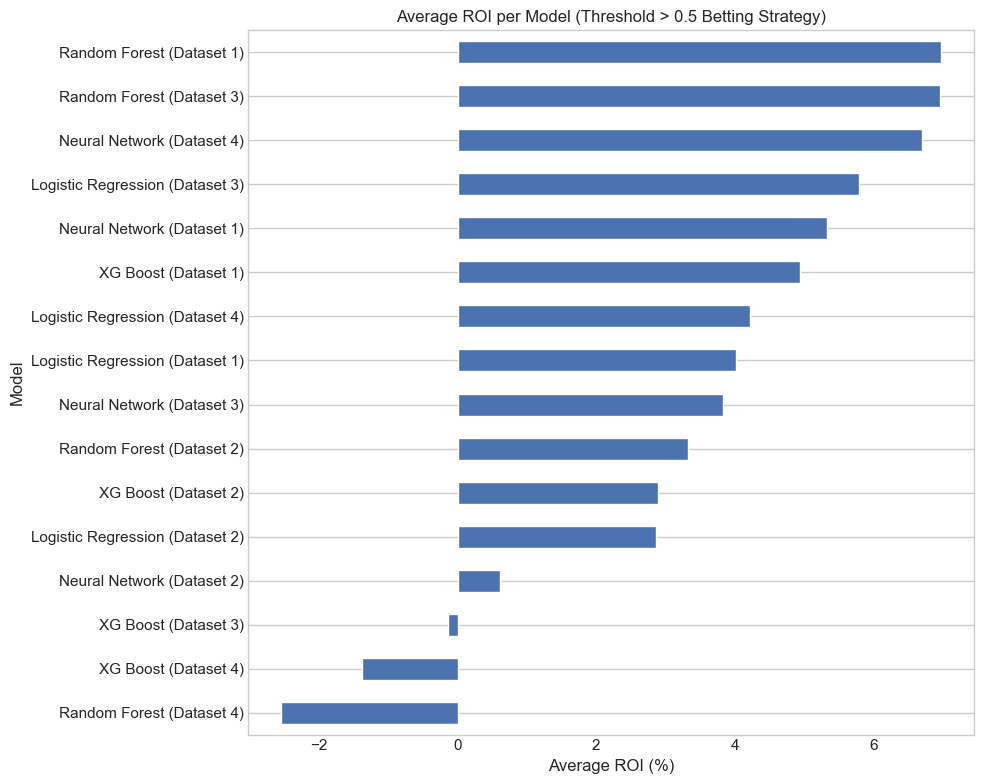

In [ ]:
# Function to calculate returns per row
def calculate_return(row):
    if row['PredictedWinner'] == 'Red' and row['RedProb'] > 0.5:
        return (row['RedOddsDecimal'] - 1) if row['ActualWinner'] == 'Red' else -1
    elif row['PredictedWinner'] == 'Blue' and row['BlueProb'] > 0.5:
        return (row['BlueOddsDecimal'] - 1) if row['ActualWinner'] == 'Blue' else -1
    else:
        return 0

# ROI col
results_df_final['ROI'] = results_df_final.apply(calculate_return, axis=1)

# sum ROI and divide by number of bets to convert to percentage
model_roi = results_df_final.groupby('Model')['ROI'].mean().sort_values() * 100

# plot
plt.figure(figsize=(10, 8))
model_roi.plot(kind='barh')
plt.xlabel('Average ROI (%)')
plt.title('Average ROI per Model (Threshold > 0.5 Betting Strategy)')
plt.tight_layout()
plt.grid(axis='x')
plt.show()

#### Kelly Strategy

##### Helper Function

In [ ]:
# Initializing the strategy function
def run_kelly_strategy_analysis(model_name, results, initial_portfolio=1000):
    # Load and prepare data
    df = results.copy()
    df = df[df["Model"] == model_name].reset_index(drop=True)
    df["Date"] = pd.to_datetime(df["Date"])
    df = df.sort_values("Date")

    # Kelly simulation function
    def simulate_kelly_strategy(df, threshold, label, kelly_scale=0.5, max_bet_fraction=0.05):
        portfolio = initial_portfolio
        portfolio_values = []
        logbook = []
        total_bets = 0
        total_profit = 0
        invested = 0

        for _, row in df.iterrows():
            p_red = row["RedProb"]
            red_odds = row["RedOddsDecimal"]
            blue_odds = row["BlueOddsDecimal"]
            actual = row["ActualWinner"]
            date = row["Date"]

            if p_red > 1 - p_red:
                predicted = "Red"
                prob = p_red
                odds = red_odds
            else:
                predicted = "Blue"
                prob = 1 - p_red
                odds = blue_odds

            if prob > threshold:
                b = odds - 1
                q = 1 - prob
                kelly_fraction = ((b * prob) - q) / b

                if kelly_fraction <= 0:
                    continue

                stake = min(portfolio * kelly_fraction * kelly_scale, portfolio * max_bet_fraction)

                profit = stake * (odds - 1) if predicted == actual else -stake
                portfolio += profit
                total_profit += profit
                invested += stake
                total_bets += 1

                logbook.append({
                    "Date": date,
                    "Predicted Winner": predicted,
                    "Actual Winner": actual,
                    "Predicted Probability": round(prob, 4),
                    "Odds": round(odds, 2),
                    "Stake": round(stake, 2),
                    "Profit/Loss": round(profit, 2),
                    "Portfolio After Bet": round(portfolio, 2)
                })

                if portfolio <= 0:
                    print(f" Strategy '{label}' stopped: Portfolio dropped below $0 on {date.date()}")
                    break

            portfolio_values.append((date, portfolio))

        roi = (total_profit / invested) * 100 if invested > 0 else 0
        portfolio_df = pd.DataFrame(portfolio_values, columns=["Date", label])
        logbook_df = pd.DataFrame(logbook)
        return portfolio_df, roi, total_bets, logbook_df

    # Set thresholds
    low_risk_threshold = 0.75
    medium_risk_threshold = 0.65
    high_risk_threshold = 0.55

    # Run simulations
    high_df, high_roi, high_bets, high_log = simulate_kelly_strategy(df, high_risk_threshold, "High Risk", kelly_scale=0.5)
    medium_df, medium_roi, medium_bets, medium_log = simulate_kelly_strategy(df, medium_risk_threshold, "Medium Risk", kelly_scale=0.5)
    low_df, low_roi, low_bets, low_log = simulate_kelly_strategy(df, low_risk_threshold, "Low Risk", kelly_scale=0.5)

    # Daily ROI
    high_df["High ROI"] = high_df["High Risk"].pct_change() * 100
    medium_df["Medium ROI"] = medium_df["Medium Risk"].pct_change() * 100
    low_df["Low ROI"] = low_df["Low Risk"].pct_change() * 100

    # Merge portfolios
    portfolio_combined_df = high_df[["Date", "High Risk"]] \
        .merge(medium_df[["Date", "Medium Risk"]], on="Date", how="outer") \
        .merge(low_df[["Date", "Low Risk"]], on="Date", how="outer").sort_values("Date")
    
    # Forward-fill missing values to ensure continuous lines
    portfolio_combined_df.ffill(inplace=True)

    # Merge ROI
    roi_combined_df = high_df[["Date", "High ROI"]] \
        .merge(medium_df[["Date", "Medium ROI"]], on="Date", how="outer") \
        .merge(low_df[["Date", "Low ROI"]], on="Date", how="outer").sort_values("Date")

    # Plot: Portfolio Value
    plt.figure(figsize=(10, 6))
    plt.plot(portfolio_combined_df["Date"], portfolio_combined_df["High Risk"], label=f"High Risk - Threshold: {high_risk_threshold}")
    plt.plot(portfolio_combined_df["Date"], portfolio_combined_df["Medium Risk"], label=f"Medium Risk - Threshold: {medium_risk_threshold}")
    plt.plot(portfolio_combined_df["Date"], portfolio_combined_df["Low Risk"], label=f"Low Risk - Threshold: {low_risk_threshold}")
    plt.title("Portfolio Value Over Time by Kelly Strategy")
    plt.xlabel("Date")
    plt.ylabel("Portfolio Value ($)")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    # Volatility and Annualized ROI
    high_volatility = high_df["High ROI"].std()
    medium_volatility = medium_df["Medium ROI"].std()
    low_volatility = low_df["Low ROI"].std()

    start_date = df["Date"].min()
    end_date = df["Date"].max()
    days_active = (end_date - start_date).days

    high_vol_annual = high_volatility * (252 ** 0.5) / (days_active ** 0.5)
    medium_vol_annual = medium_volatility * (252 ** 0.5) / (days_active ** 0.5)
    low_vol_annual = low_volatility * (252 ** 0.5) / (days_active ** 0.5)

    high_roi_annual = ((1 + high_roi / 100) ** (252 / days_active) - 1) * 100
    medium_roi_annual = ((1 + medium_roi / 100) ** (252 / days_active) - 1) * 100
    low_roi_annual = ((1 + low_roi / 100) ** (252 / days_active) - 1) * 100

    # Print summary
    print("Kelly Strategy Summary:")
    print(f"High Risk:   ROI = {high_roi:.2f}%, Volatility = {high_volatility:.2f}%, Bets Placed = {high_bets}")
    print(f"Medium Risk: ROI = {medium_roi:.2f}%, Volatility = {medium_volatility:.2f}%, Bets Placed = {medium_bets}")
    print(f"Low Risk:    ROI = {low_roi:.2f}%, Volatility = {low_volatility:.2f}%, Bets Placed = {low_bets}")

    print("\nAnnualized Kelly Strategy Summary:")
    print(f"High Risk:   ROI = {high_roi_annual:.2f}%, Volatility = {high_vol_annual:.2f}%")
    print(f"Medium Risk: ROI = {medium_roi_annual:.2f}%, Volatility = {medium_vol_annual:.2f}%")
    print(f"Low Risk:    ROI = {low_roi_annual:.2f}%, Volatility = {low_vol_annual:.2f}%")

    # Save combined logbook
    high_log["Strategy"] = "High Risk"
    medium_log["Strategy"] = "Medium Risk"
    low_log["Strategy"] = "Low Risk"
    combined_log = pd.concat([high_log, medium_log, low_log]).sort_values("Date")
    combined_log.to_csv("logbook_all_strategies.csv", index=False)

##### Dataset 1

**Logistic Regression**

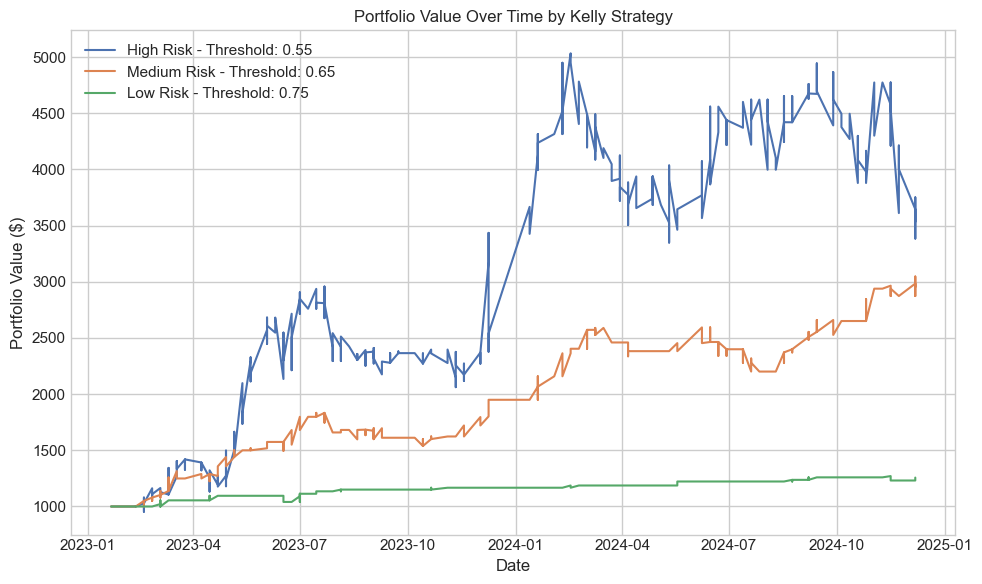

Kelly Strategy Summary:
High Risk:   ROI = 8.55%, Volatility = 3.72%, Bets Placed = 218
Medium Risk: ROI = 27.63%, Volatility = 1.46%, Bets Placed = 77
Low Risk:    ROI = 29.37%, Volatility = 0.40%, Bets Placed = 16

Annualized Kelly Strategy Summary:
High Risk:   ROI = 3.06%, Volatility = 2.25%
Medium Risk: ROI = 9.38%, Volatility = 0.89%
Low Risk:    ROI = 9.92%, Volatility = 0.24%


In [123]:
run_kelly_strategy_analysis("Logistic Regression (Dataset 1)", results_df_final, initial_portfolio=1000)

**Random Forest**

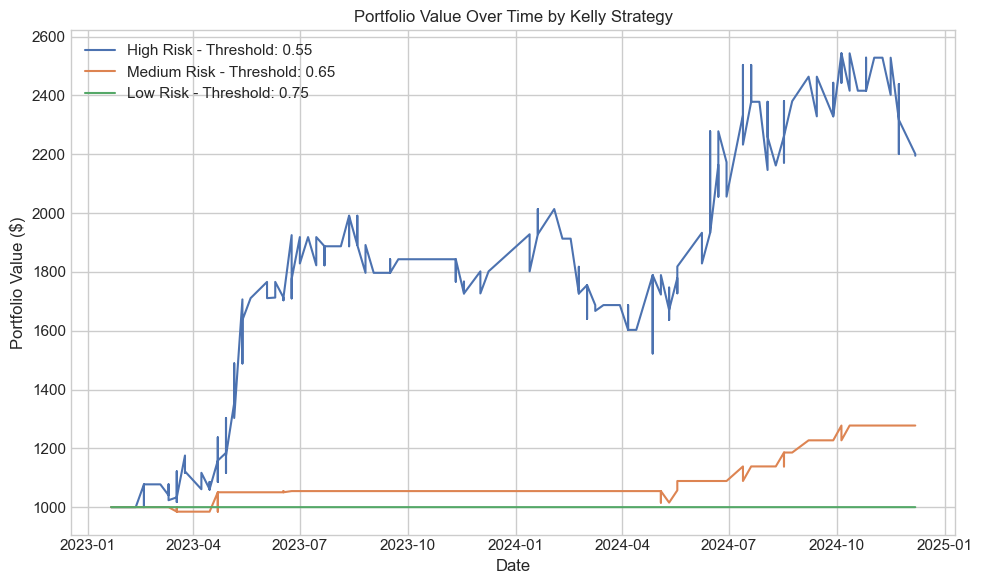

Kelly Strategy Summary:
High Risk:   ROI = 17.51%, Volatility = 2.24%, Bets Placed = 90
Medium Risk: ROI = 62.11%, Volatility = 0.46%, Bets Placed = 10
Low Risk:    ROI = 0.00%, Volatility = 0.00%, Bets Placed = 0

Annualized Kelly Strategy Summary:
High Risk:   ROI = 6.11%, Volatility = 1.36%
Medium Risk: ROI = 19.42%, Volatility = 0.28%
Low Risk:    ROI = 0.00%, Volatility = 0.00%


In [124]:
run_kelly_strategy_analysis("Random Forest (Dataset 1)", results_df_final, initial_portfolio=1000)

**XG Boost**

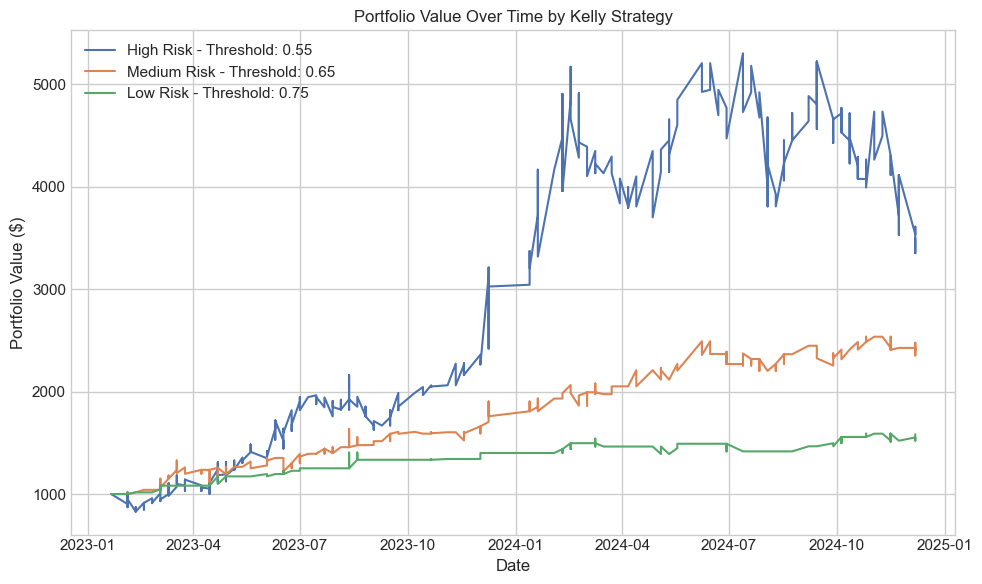

Kelly Strategy Summary:
High Risk:   ROI = 8.55%, Volatility = 3.57%, Bets Placed = 225
Medium Risk: ROI = 18.85%, Volatility = 1.57%, Bets Placed = 93
Low Risk:    ROI = 30.52%, Volatility = 0.80%, Bets Placed = 29

Annualized Kelly Strategy Summary:
High Risk:   ROI = 3.06%, Volatility = 2.17%
Medium Risk: ROI = 6.55%, Volatility = 0.95%
Low Risk:    ROI = 10.28%, Volatility = 0.48%


In [125]:
run_kelly_strategy_analysis("XG Boost (Dataset 1)", results_df_final, initial_portfolio=1000)

**Neural Network (MLP)**

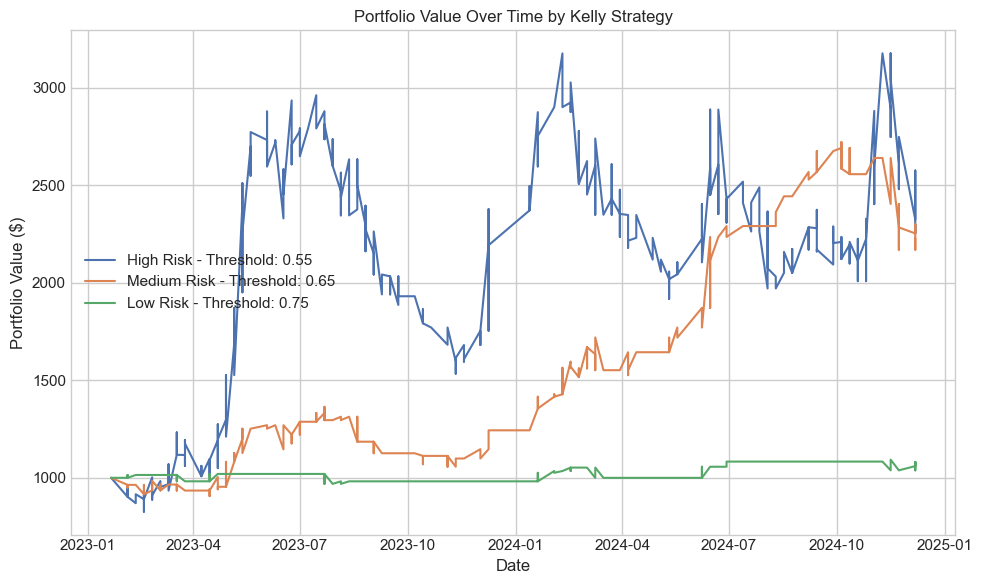

Kelly Strategy Summary:
High Risk:   ROI = 6.23%, Volatility = 3.72%, Bets Placed = 219
Medium Risk: ROI = 21.63%, Volatility = 1.58%, Bets Placed = 77
Low Risk:    ROI = 11.18%, Volatility = 0.48%, Bets Placed = 15

Annualized Kelly Strategy Summary:
High Risk:   ROI = 2.25%, Volatility = 2.25%
Medium Risk: ROI = 7.46%, Volatility = 0.96%
Low Risk:    ROI = 3.97%, Volatility = 0.29%


In [126]:
run_kelly_strategy_analysis("Neural Network (Dataset 1)", results_df_final, initial_portfolio=1000)

##### Dataset 2

**Logistic Regression**

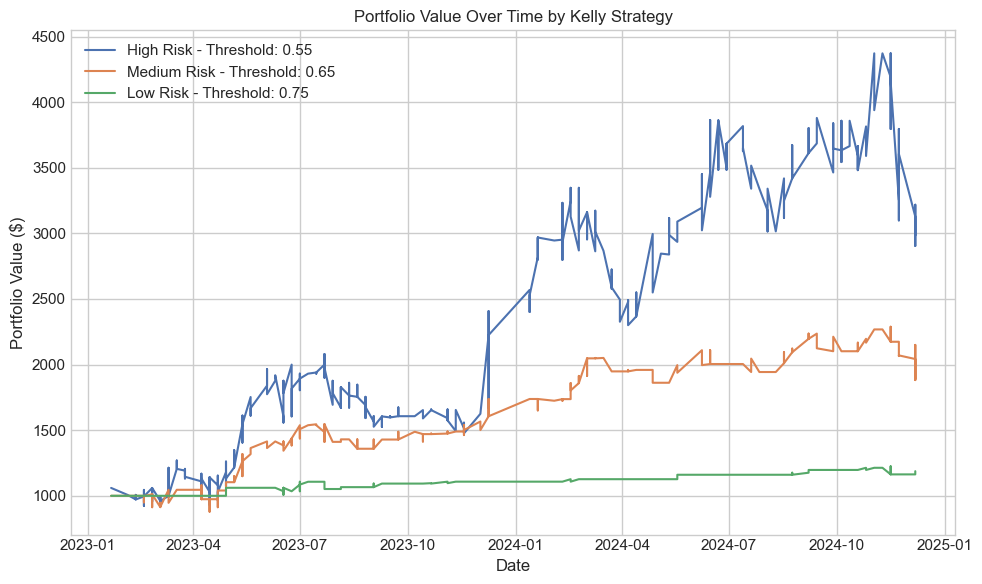

Kelly Strategy Summary:
High Risk:   ROI = 8.69%, Volatility = 3.66%, Bets Placed = 221
Medium Risk: ROI = 14.43%, Volatility = 1.52%, Bets Placed = 87
Low Risk:    ROI = 19.88%, Volatility = 0.49%, Bets Placed = 18

Annualized Kelly Strategy Summary:
High Risk:   ROI = 3.11%, Volatility = 2.22%
Medium Risk: ROI = 5.08%, Volatility = 0.92%
Low Risk:    ROI = 6.89%, Volatility = 0.30%


In [127]:
run_kelly_strategy_analysis("Logistic Regression (Dataset 2)", results_df_final, initial_portfolio=1000)

**Random Forest**

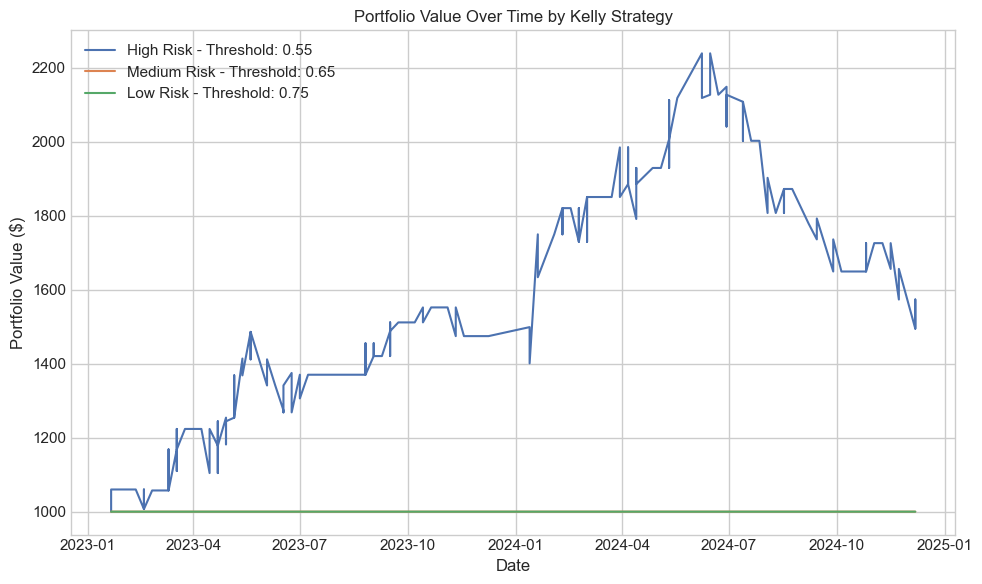

Kelly Strategy Summary:
High Risk:   ROI = 11.56%, Volatility = 1.78%, Bets Placed = 61
Medium Risk: ROI = 0.00%, Volatility = 0.00%, Bets Placed = 0
Low Risk:    ROI = 0.00%, Volatility = 0.00%, Bets Placed = 0

Annualized Kelly Strategy Summary:
High Risk:   ROI = 4.10%, Volatility = 1.08%
Medium Risk: ROI = 0.00%, Volatility = 0.00%
Low Risk:    ROI = 0.00%, Volatility = 0.00%


In [128]:
run_kelly_strategy_analysis("Random Forest (Dataset 2)", results_df_final, initial_portfolio=1000)

**XG Boost**

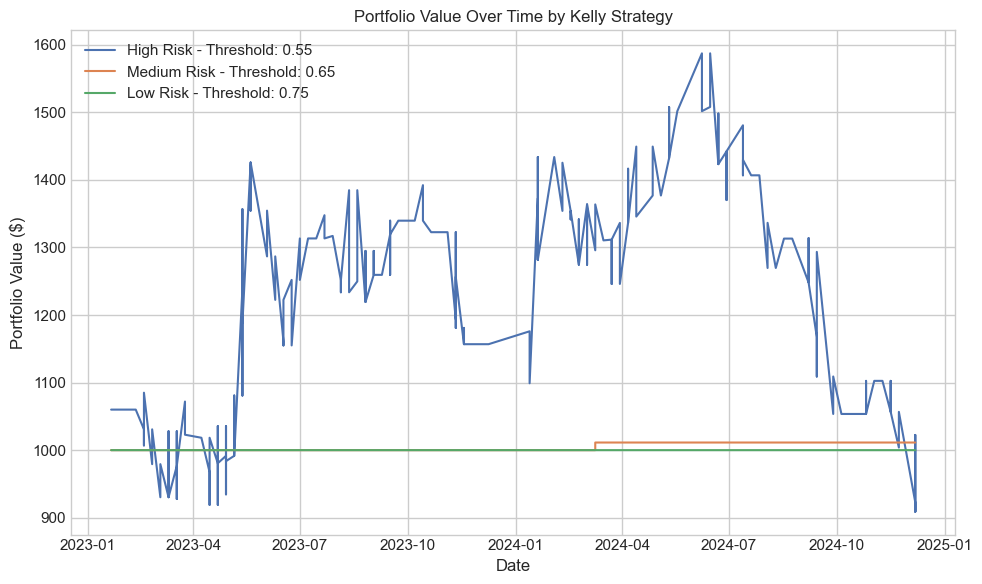

Kelly Strategy Summary:
High Risk:   ROI = -1.72%, Volatility = 2.27%, Bets Placed = 100
Medium Risk: ROI = 54.00%, Volatility = 0.04%, Bets Placed = 1
Low Risk:    ROI = 0.00%, Volatility = 0.00%, Bets Placed = 0

Annualized Kelly Strategy Summary:
High Risk:   ROI = -0.63%, Volatility = 1.38%
Medium Risk: ROI = 17.19%, Volatility = 0.02%
Low Risk:    ROI = 0.00%, Volatility = 0.00%


In [129]:
run_kelly_strategy_analysis("XG Boost (Dataset 2)", results_df_final, initial_portfolio=1000)

**Neural Network (MLP)**

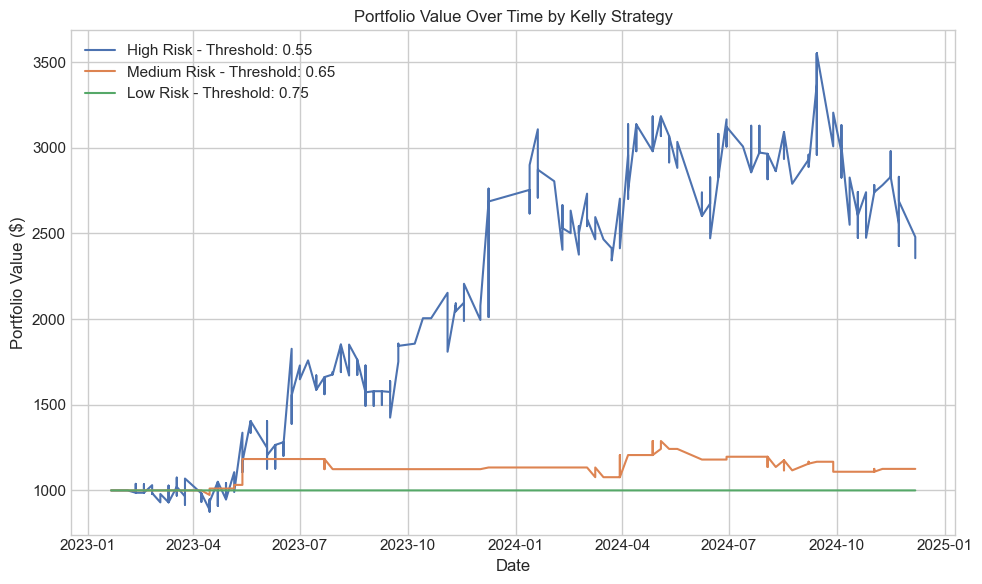

Kelly Strategy Summary:
High Risk:   ROI = 7.86%, Volatility = 3.55%, Bets Placed = 178
Medium Risk: ROI = 13.09%, Volatility = 0.84%, Bets Placed = 20
Low Risk:    ROI = 0.00%, Volatility = 0.00%, Bets Placed = 0

Annualized Kelly Strategy Summary:
High Risk:   ROI = 2.82%, Volatility = 2.15%
Medium Risk: ROI = 4.62%, Volatility = 0.51%
Low Risk:    ROI = 0.00%, Volatility = 0.00%


In [130]:
run_kelly_strategy_analysis("Neural Network (Dataset 2)", results_df_final, initial_portfolio=1000)

##### Dataset 3

**Logistic Regression**

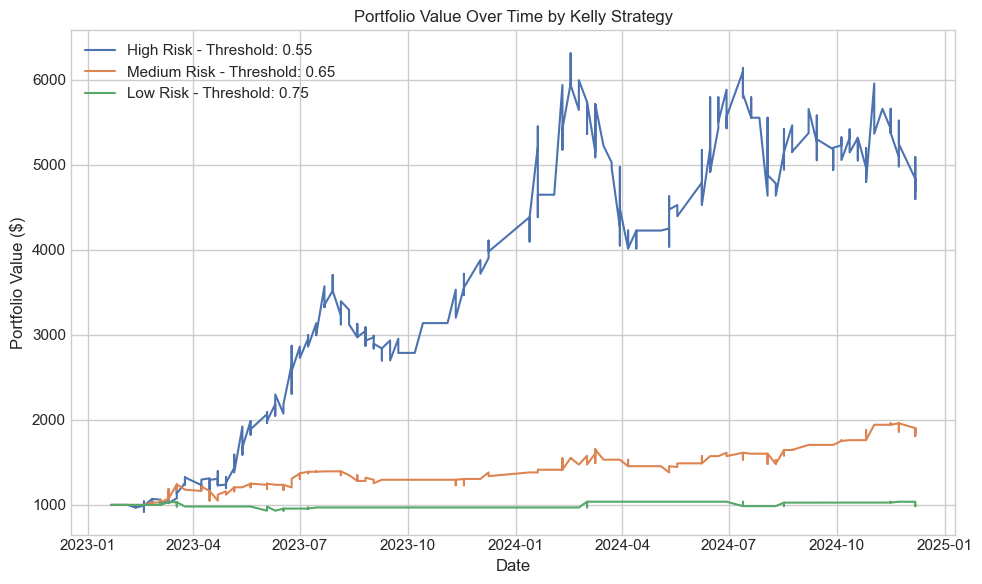

Kelly Strategy Summary:
High Risk:   ROI = 10.84%, Volatility = 3.53%, Bets Placed = 212
Medium Risk: ROI = 19.13%, Volatility = 1.37%, Bets Placed = 71
Low Risk:    ROI = 0.89%, Volatility = 0.50%, Bets Placed = 12

Annualized Kelly Strategy Summary:
High Risk:   ROI = 3.85%, Volatility = 2.14%
Medium Risk: ROI = 6.64%, Volatility = 0.83%
Low Risk:    ROI = 0.33%, Volatility = 0.31%


In [131]:
run_kelly_strategy_analysis("Logistic Regression (Dataset 3)", results_df_final, initial_portfolio=1000)

**Random Forest**

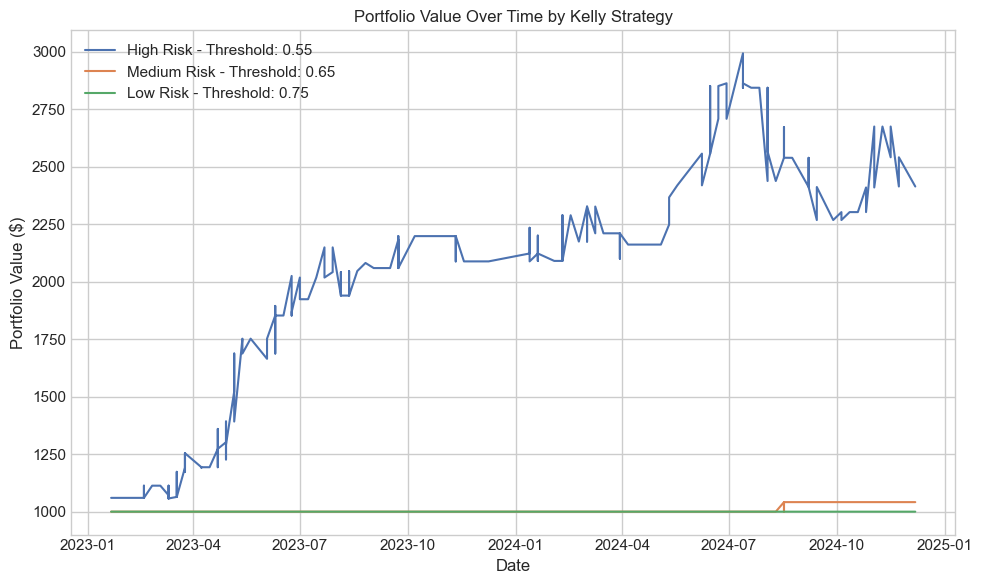

Kelly Strategy Summary:
High Risk:   ROI = 22.50%, Volatility = 2.14%, Bets Placed = 71
Medium Risk: ROI = 83.00%, Volatility = 0.15%, Bets Placed = 1
Low Risk:    ROI = 0.00%, Volatility = 0.00%, Bets Placed = 0

Annualized Kelly Strategy Summary:
High Risk:   ROI = 7.74%, Volatility = 1.30%
Medium Risk: ROI = 24.86%, Volatility = 0.09%
Low Risk:    ROI = 0.00%, Volatility = 0.00%


In [132]:
run_kelly_strategy_analysis("Random Forest (Dataset 3)", results_df_final, initial_portfolio=1000)

**XG Boost**

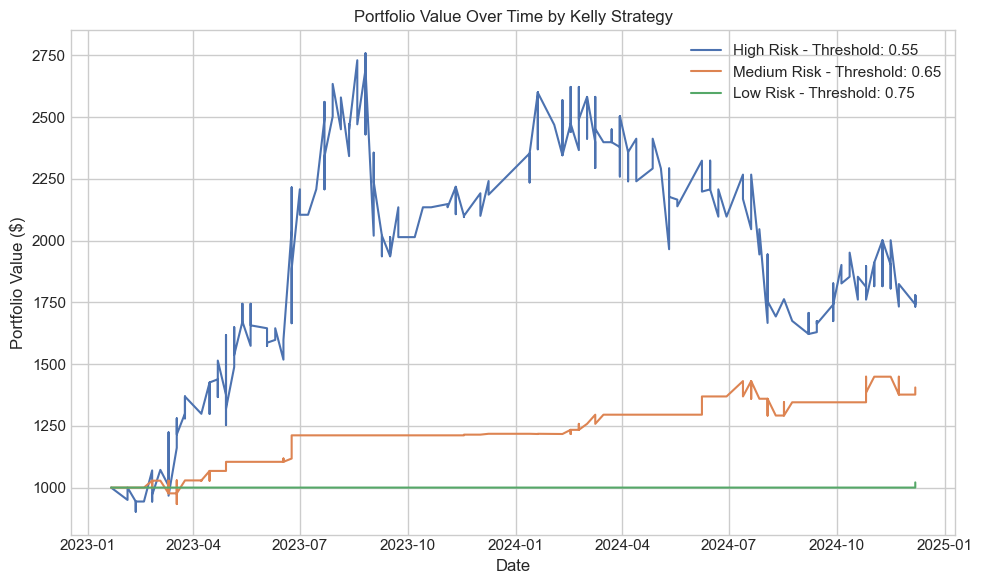

Kelly Strategy Summary:
High Risk:   ROI = 6.11%, Volatility = 2.99%, Bets Placed = 157
Medium Risk: ROI = 35.50%, Volatility = 0.80%, Bets Placed = 24
Low Risk:    ROI = 42.00%, Volatility = 0.08%, Bets Placed = 1

Annualized Kelly Strategy Summary:
High Risk:   ROI = 2.20%, Volatility = 1.81%
Medium Risk: ROI = 11.81%, Volatility = 0.49%
Low Risk:    ROI = 13.75%, Volatility = 0.05%


In [133]:
run_kelly_strategy_analysis("XG Boost (Dataset 3)", results_df_final, initial_portfolio=1000)

**Neural Network (MLP)**

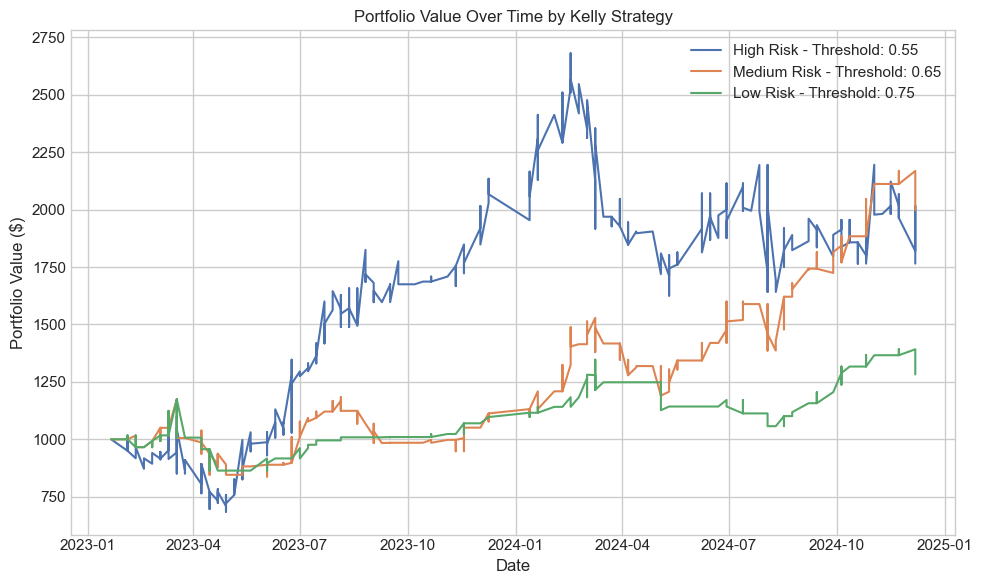

Kelly Strategy Summary:
High Risk:   ROI = 4.86%, Volatility = 3.08%, Bets Placed = 212
Medium Risk: ROI = 15.27%, Volatility = 1.64%, Bets Placed = 107
Low Risk:    ROI = 9.66%, Volatility = 1.03%, Bets Placed = 53

Annualized Kelly Strategy Summary:
High Risk:   ROI = 1.76%, Volatility = 1.87%
Medium Risk: ROI = 5.36%, Volatility = 0.99%
Low Risk:    ROI = 3.45%, Volatility = 0.62%


In [134]:
run_kelly_strategy_analysis("Neural Network (Dataset 3)", results_df_final, initial_portfolio=1000)

##### Dataset 4

**Logistic Regression**

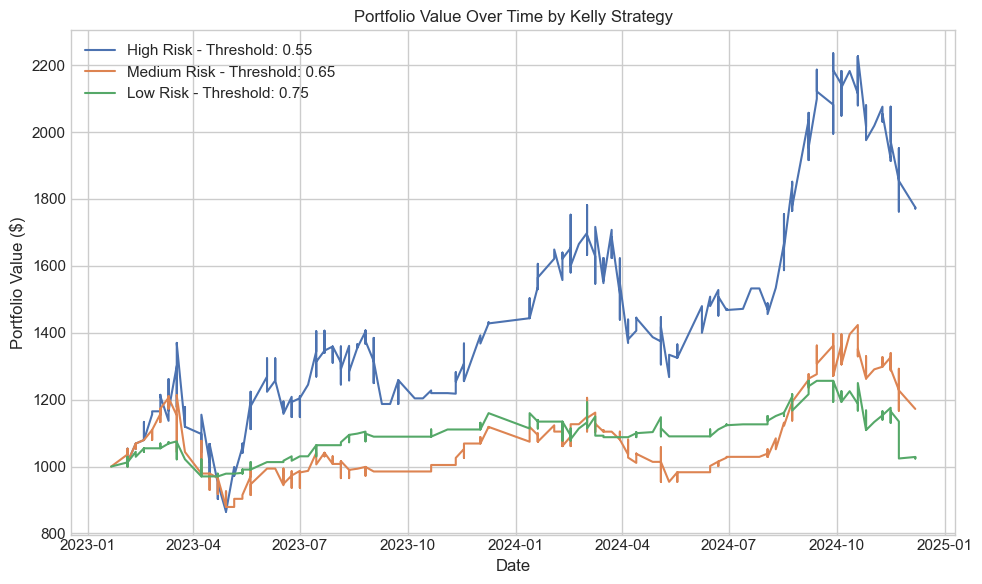

Kelly Strategy Summary:
High Risk:   ROI = 5.88%, Volatility = 2.54%, Bets Placed = 232
Medium Risk: ROI = 2.66%, Volatility = 1.37%, Bets Placed = 144
Low Risk:    ROI = 0.74%, Volatility = 0.82%, Bets Placed = 79

Annualized Kelly Strategy Summary:
High Risk:   ROI = 2.12%, Volatility = 1.54%
Medium Risk: ROI = 0.97%, Volatility = 0.83%
Low Risk:    ROI = 0.27%, Volatility = 0.49%


In [135]:
run_kelly_strategy_analysis("Logistic Regression (Dataset 4)", results_df_final, initial_portfolio=1000)

**Random Forest**

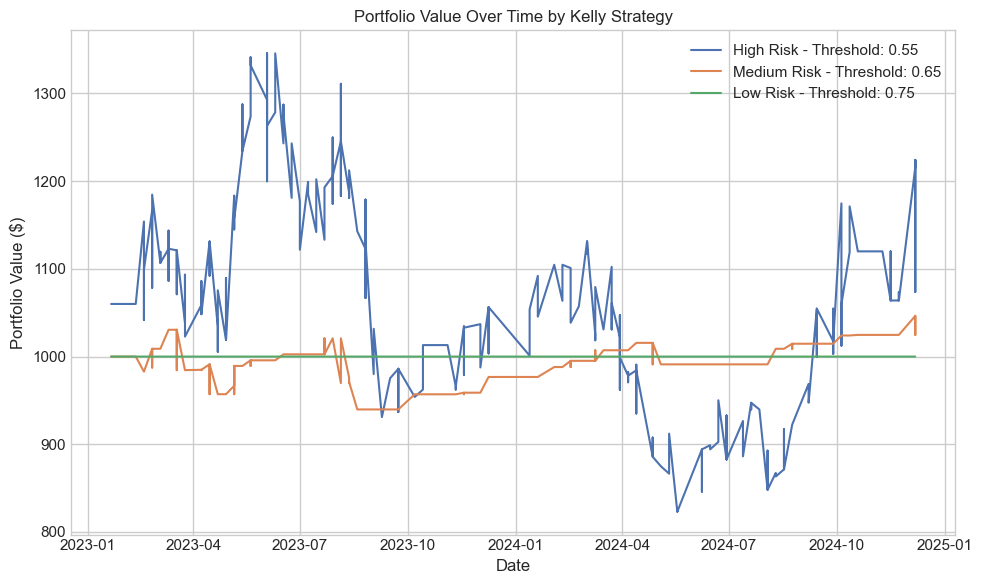

Kelly Strategy Summary:
High Risk:   ROI = 3.53%, Volatility = 2.82%, Bets Placed = 176
Medium Risk: ROI = 6.85%, Volatility = 0.52%, Bets Placed = 31
Low Risk:    ROI = 0.00%, Volatility = 0.00%, Bets Placed = 0

Annualized Kelly Strategy Summary:
High Risk:   ROI = 1.28%, Volatility = 1.71%
Medium Risk: ROI = 2.46%, Volatility = 0.31%
Low Risk:    ROI = 0.00%, Volatility = 0.00%


In [136]:
run_kelly_strategy_analysis("Random Forest (Dataset 4)", results_df_final, initial_portfolio=1000)

**XG Boost**

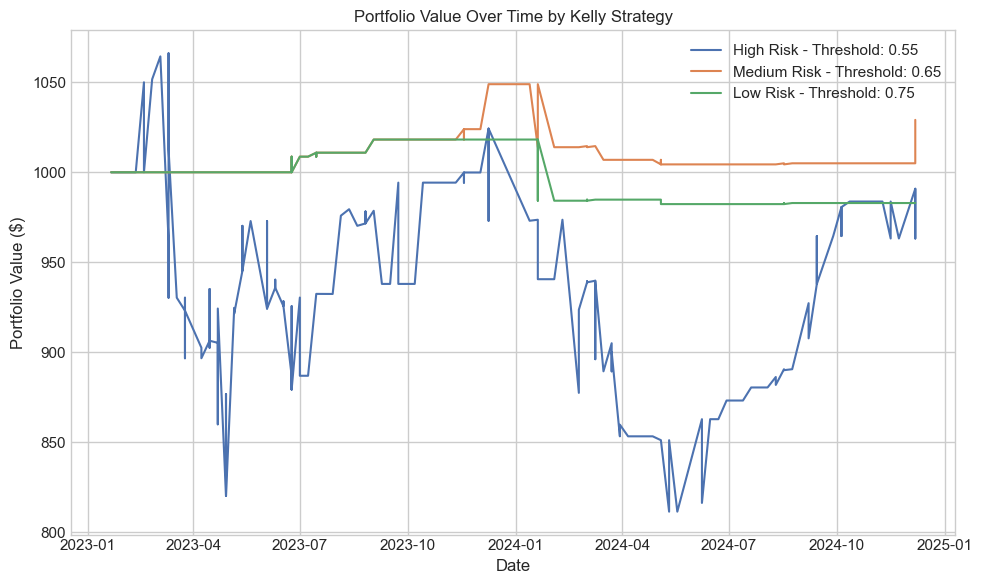

Kelly Strategy Summary:
High Risk:   ROI = -0.53%, Volatility = 1.63%, Bets Placed = 77
Medium Risk: ROI = 12.61%, Volatility = 0.21%, Bets Placed = 11
Low Risk:    ROI = -15.29%, Volatility = 0.13%, Bets Placed = 7

Annualized Kelly Strategy Summary:
High Risk:   ROI = -0.20%, Volatility = 0.99%
Medium Risk: ROI = 4.46%, Volatility = 0.13%
Low Risk:    ROI = -5.92%, Volatility = 0.08%


In [137]:
run_kelly_strategy_analysis("XG Boost (Dataset 4)", results_df_final, initial_portfolio=1000)

**Neural Network (MLP)**

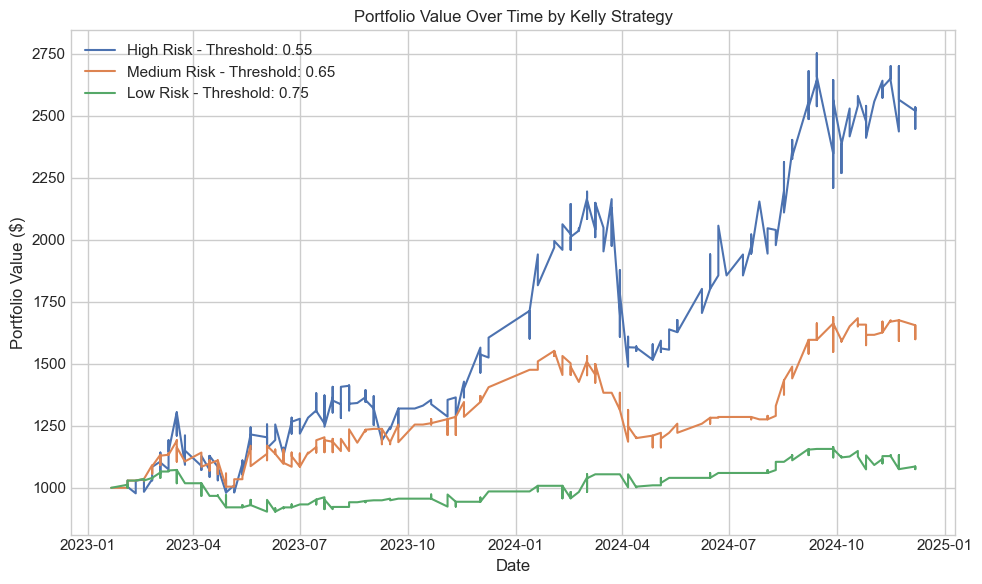

Kelly Strategy Summary:
High Risk:   ROI = 9.80%, Volatility = 2.72%, Bets Placed = 230
Medium Risk: ROI = 8.86%, Volatility = 1.43%, Bets Placed = 136
Low Risk:    ROI = 2.74%, Volatility = 0.77%, Bets Placed = 70

Annualized Kelly Strategy Summary:
High Risk:   ROI = 3.49%, Volatility = 1.65%
Medium Risk: ROI = 3.17%, Volatility = 0.87%
Low Risk:    ROI = 1.00%, Volatility = 0.46%


In [138]:
run_kelly_strategy_analysis("Neural Network (Dataset 4)", results_df_final, initial_portfolio=1000)

In [ ]:
def visualize_predictions(df, results_df=None):
     
    # Define the models to include
    models_to_include = [
        'Logistic Regression (Dataset 4)', 'Random Forest (Dataset 4)',
        'XG Boost (Dataset 4)', 'Neural Network (Dataset 4)',
        'Logistic Regression (Dataset 3)', 'Random Forest (Dataset 3)',
        'XG Boost (Dataset 1)', 'Neural Network (Dataset 3)'
    ]
 
    # Prepare new results
    new_results = df.copy()
    new_results['TrueLabel'] = df['ActualWinner'].apply(lambda x: 0 if x == 'Red' else 1)
    new_results['ModelPredicted'] = df['PredictedWinner'].apply(lambda x: 0 if x == 'Red' else 1)
    new_results['Model'] = df['Model']
 
    new_results['BookmakerPrediction'] = new_results.apply(
        lambda row: 0 if row['RedOddsDecimal'] < row['BlueOddsDecimal'] else 1, axis=1
    )
 
    def categorize_outcome(row):
        bettor_right = row['ModelPredicted'] == row['TrueLabel']
        bookmaker_right = row['BookmakerPrediction'] == row['TrueLabel']
        if bettor_right and bookmaker_right:
            return "Consensus"
        elif not bettor_right and not bookmaker_right:
            return "Upset"
        elif not bettor_right and bookmaker_right:
            return "Missed"
        elif bettor_right and not bookmaker_right:
            return "Spotted"
 
    new_results['OutcomeCategory'] = new_results.apply(categorize_outcome, axis=1)
 
    # Combine with existing results if any
    if results_df is not None:
        results_df = pd.concat([results_df, new_results], ignore_index=True)
    else:
        results_df = new_results
 
    # Filter to include only selected models
    results_df = results_df[results_df['Model'].isin(models_to_include)]
 
    # Extract dataset number for sorting
    def extract_dataset_number(model_name):
        match = re.search(r'Dataset (\d+)', model_name)
        return int(match.group(1)) if match else float('inf')
 
    results_df['DatasetNum'] = results_df['Model'].apply(extract_dataset_number)
 
    # Group and visualize
    grouped = results_df.groupby(['Model', 'OutcomeCategory']).size().unstack(fill_value=0)
    proportions = grouped.div(grouped.sum(axis=1), axis=0) * 100
 
    # Sort index using dataset number and then model name
    sorted_index = (
        proportions.index.to_series()
        .sort_values(key=lambda x: x.apply(lambda name: (extract_dataset_number(name), name)))
    )
    proportions = proportions.loc[sorted_index]
 
    category_order = ['Consensus', 'Upset', 'Missed', 'Spotted']
    colors = {
        'Consensus': '#1f77b4',
        'Upset': '#2ca02c',
        'Missed': 'Red',
        'Spotted': '#9467bd'
    }
 
    fig, ax = plt.subplots(figsize=(10, 6))
    bottom = None
    for category in category_order:
        values = proportions[category] if category in proportions else 0
        ax.barh(proportions.index, values, left=bottom, label=category, color=colors[category])
        bottom = values if bottom is None else bottom + values
 
    ax.set_xlabel("Portion of games [%]")
    ax.set_ylabel("Model")
    ax.legend(loc='upper center', ncol=4)
    plt.tight_layout()
    plt.show()
 
    return results_df

/var/folders/mn/g09qkr_50mgcjzv_xfxqjsy00000gn/T/ipykernel_5859/181352063.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  results_df['DatasetNum'] = results_df['Model'].apply(extract_dataset_number)


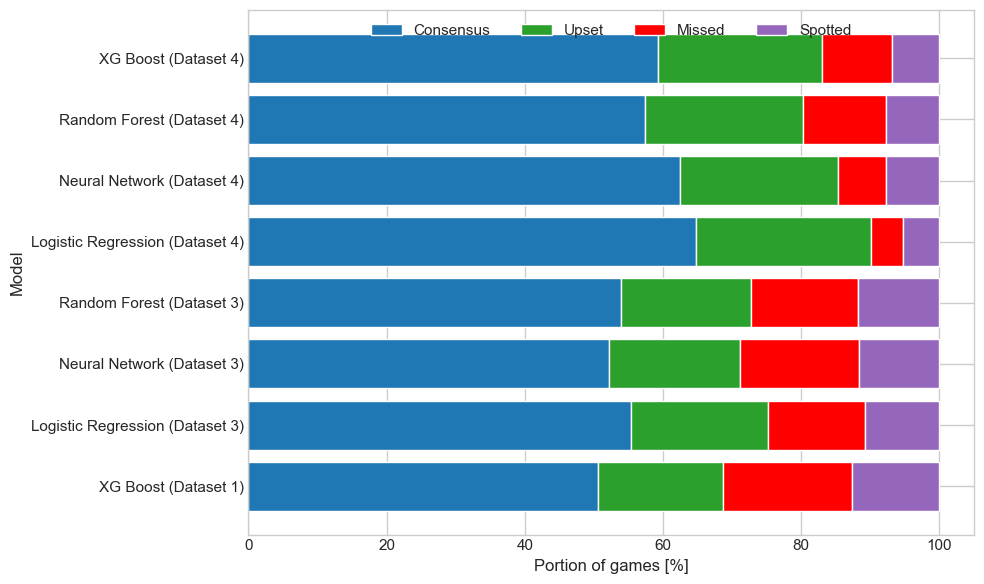

In [150]:
results_df = visualize_predictions(results_df_final)